### Import libraries

In [1]:
import sys
sys.path.append("..")
import os
from model import old_model_1D, experimental_model, experimental2d_model, grapher
from data import batch_creator, loader, data_generation
from helpers import helpers, plotter, metrics
import tensorflow as tf
import time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
def embed_position(t, d, TΔmin, Tmax):  # return.shape=(T,B,d)
    # t.shape=(T,B)   T=sequence_length, B=batch_size
    """A position-embedder, similar to the Attention paper, but tweaked to account for
    floating point positions, rather than integer.
    """
    R = Tmax / TΔmin * 100
    drange_even = TΔmin * R**(np.arange(0,d,2)/d)
    drange_odd = TΔmin * R**((np.arange(1,d,2) - 1)/d)
    x = np.concatenate([np.sin(t[:,:,None] / drange_even), np.cos(t[:,:,None] / drange_odd)], 2)
    return x

In [3]:
df = np.load('/Users/omernivron/Downloads/river_flow/data/maurer.pickle', allow_pickle= True)
df_attributes = np.load('/Users/omernivron/Downloads/attributes.pickle', allow_pickle= True)
att_csv = pd.read_csv('/Users/omernivron/Downloads/river_flow/data/attibutes.csv')


In [4]:
basin_list = pd.read_csv('/Users/omernivron/Downloads/river_flow/data/basin_list.txt', header=None)

In [5]:
attributes = [#'gauge_id', 
               'p_mean', 'pet_mean', 'p_seasonality', 'frac_snow',
               'aridity', 'high_prec_freq', 'high_prec_dur', 
                #'high_prec_timing',
               'low_prec_freq', 'low_prec_dur', 
                #'low_prec_timing', 'geol_1st_class', 'glim_1st_class_frac', 'geol_2nd_class', 'glim_2nd_class_frac',
               'carbonate_rocks_frac', #'geol_porostiy', 
                'geol_permeability', 
                #'q_mean','runoff_ratio', 'slope_fdc', 'baseflow_index', 'stream_elas', 'q5',
               #'q95', 'high_q_freq', 'high_q_dur', 'low_q_freq', 'low_q_dur',
               #'zero_q_freq', 'hfd_mean', 'huc_02', 'gauge_name',
               'soil_depth_pelletier', 'soil_depth_statsgo', 'soil_porosity','soil_conductivity', 
                'max_water_content', 'sand_frac', 'silt_frac', 'clay_frac', 
                #'water_frac', 'organic_frac', 'other_frac', 
                #'gauge_lat','gauge_lon', 
                'elev_mean', 'slope_mean', 
                #'area_gages2',
                'area_geospa_fabric', 
                'frac_forest', 'lai_max', 'lai_diff', 'gvf_max','gvf_diff', 
                #'dom_land_cover_frac', 'dom_land_cover', 'root_depth_50','root_depth_99', 'hru08'
                ]

In [6]:
basin_list = basin_list[0].apply(lambda x: '0' + str(x) if len(str(x)) < 8 else str(x))



In [7]:
att_csv1 = att_csv[attributes]
att_csv1 = (att_csv1 - np.mean(att_csv1, axis  = 0)) / np.std(att_csv1, axis =0 )


In [8]:
ymd = df['01013500'].groupby(['Year', 'Mnth']).size().reset_index()

In [9]:
ymd['d_cumsum'] = 0
for y in ymd['Year']:
    temp = ymd.loc[ymd['Year'] == y, 0].cumsum()
    ymd.loc[ymd['Year'] == y,'d_cumsum'] =  np.concatenate(([0], temp[:-1]))

In [10]:
for k,v in df.items():
    df[k].reset_index(inplace=True)
    df[k] = pd.DataFrame.merge(v, ymd, right_on=['Year', 'Mnth'], left_on=['Year', 'Mnth'])
    df[k]['n_day'] = df[k]['d_cumsum'] + df[k]['Day']
    df[k]['t'] = df[k]['Year'] + (df[k]['n_day'] - 1) / 366

In [11]:
# np.save('/Users/omernivron/Downloads/river_flow/data/maurer.pickle', df,  allow_pickle= True)

In [12]:
df_filtered = {}
for (b) in basin_list: 
    if (df[b].shape[0] < 10593):
        basin_list = basin_list[basin_list!=b]
        continue
    df_filtered[b] = df[b][['Date','t', 'Dayl(s)', 'PRCP(mm/day)', 'SRAD(W/m2)', 'Tmax(C)', 'Tmin(C)', 'Vp(Pa)', 'Q']]

In [13]:
%%time
# Choose type of transform, i.e., 'standardize' or 'normalize' 
dist = 'gaussian'

if dist == 'gaussian':
    transform = 'standardize'
    log_P = True
    log_Q = True
    
if dist == 'gamma':
    transform = 'normalize'
    log_P = True
    log_Q = True
    gamma_shift = 1e-3

divide_by_area = True
cols = ['t','Dayl(s)', 'PRCP(mm/day)', 'SRAD(W/m2)', 'Tmax(C)', 'Tmin(C)', 'Vp(Pa)', 'Q']
epsilon = 1e-3

x_maxs, x_mins, x_means, x_stds = [], [], [], []
for k,v in df_filtered.items():
#     # Scale streamflow values by catchment area
    if divide_by_area:
        v['Q'] = v['Q']/df_attributes[k]['area_geospa_fabric'].values
    
    # Calculate mean (after scaling by area)
#     v['Q_mu'] = v['Q'].mean()
    
#     Log-transform precipitation
    if log_P: 
        v['PRCP(mm/day)'] = np.log(v['PRCP(mm/day)'] + epsilon)
    
    # Log-transform streamflow
    if log_Q: 
        v['Q'] = np.log(v['Q'] + epsilon)
    
#     x_maxs.append(v[cols].max().values)
#     x_mins.append(v[cols].min().values)
    x_means.append(v[cols].values)
    x_stds.append(v[cols].values)

# x_max = np.concatenate(x_maxs).reshape(-1,len(cols)).max(axis=0)
# x_min = np.concatenate(x_mins).reshape(-1,len(cols)).min(axis=0)
x_mean = np.concatenate(x_means, axis=0).mean(axis=0)
x_std = np.concatenate(x_stds, axis=0).std(axis = 0)

for k,v in df_filtered.items():
    for i, col in enumerate(cols):
        if transform == 'normalize':
            
            v[col] = (v[col] - x_min[i]) / (x_max[i] - x_min[i])
            
            if dist=="gamma":
                v['Q'] = v['Q'] + gamma_shift
            
            def rev_transform(x):
                x = x * (x_max[0] - x_min[0]) + x_min[0]
                if log_Q:
                    x = np.exp(x) - epsilon
                if dist == "gamma":
                    x = x - gamma_shift
                return x
            
            def rev_transform_tensor(x):
                x = x * (x_max[0] - x_min[0]) + x_min[0]
                if log_Q:
                    x = torch.exp(x) - epsilon 
                if dist == "gamma":
                    x = x - gamma_shift
                return x
        
        elif transform == 'standardize':
            
            v[col] = (v[col] - x_mean[i]) / x_std[i]
            
            #WARNING -- NO GAMMA SHIFT
            
            def rev_transform(x):
                x = x * x_std[0] + x_mean[0]
                if log_Q:
                    x = np.exp(x) - epsilon
                if dist == "gamma":
                    x = x - gamma_shift
                return x

            def rev_transform_tensor(x):
                x = x * x_std[0] + x_mean[0]
                if log_Q:
                    x = torch.exp(x) - epsilon 
                if dist == "gamma":
                    x = x - gamma_shift
                return x
        
        else:
            print("No transform has been applied.")

/Users/omernivron/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Users/omernivron/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Users/omernivron/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in 

CPU times: user 4.07 s, sys: 1.97 s, total: 6.05 s
Wall time: 4.55 s


In [14]:
df_filt_sliced = {}
for b in basin_list:
    df_filt_sliced[b] = {}
    temp = df_filtered[b].reset_index()[:10441]
    d_y = np.array([np.concatenate((temp.loc[j:j+179, 'Q'], temp.loc[180+j:359 +j, 'Q'])) for j in range(0, 10080, 180) ])
    t_y = np.array([embed_position(np.concatenate((temp.loc[j:j+179, 't'], temp.loc[180+j:359 +j, 't']))[:, None], d=122, TΔmin= 0.2, Tmax=180) for  j in range(0, 10080, 180)] )
    x_y = np.array([np.concatenate((temp.loc[j:j+179, ['PRCP(mm/day)','Dayl(s)', 'SRAD(W/m2)', 'Tmax(C)', 'Tmin(C)', 'Vp(Pa)']], temp.loc[180+j:359 +j, ['PRCP(mm/day)','Dayl(s)', 'SRAD(W/m2)', 'Tmax(C)', 'Tmin(C)', 'Vp(Pa)']])) for  j in range(0, 10080, 180)])
    time_x = np.array([np.concatenate((temp.loc[j:j+179, 'Date'].dt.date, temp.loc[180+j:359 +j, 'Date'].dt.date)) for j in range(0, 10080, 180)])
    df_filt_sliced[b]['x'] = x_y
    df_filt_sliced[b]['t'] = t_y
    df_filt_sliced[b]['y'] = d_y
    df_filt_sliced[b]['date'] = time_x

In [15]:
df_filtered['11532500'].Q.min()

-0.19526329718541402

In [16]:
train_step, test_step, train_loss, test_loss, m_tr, m_te = grapher.build_graph()

### Training

In [17]:
basin_list = basin_list.reset_index()
all_idx = np.arange(len(basin_list))
train_b_idx = np.random.choice(all_idx, len(basin_list) - 50, replace = False)
test_b_idx = all_idx[~np.isin(all_idx, train_b_idx).reshape(-1)]

In [18]:
d = False
save_dir = os.path.expanduser('~/Downloads/river_flow')

(array([1527., 1616., 1100., 1244., 1631., 1741., 1134.,  431.,  136.,
          33.]),
 array([-0.64321966, -0.31577514,  0.01166938,  0.3391139 ,  0.66655843,
         0.99400295,  1.32144747,  1.64889199,  1.97633651,  2.30378104,
         2.63122556]),
 <a list of 10 Patch objects>)

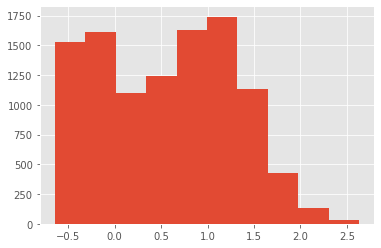

In [19]:
plt.hist(df_filtered['14316700']['Q'])

In [20]:
cmap = plt.get_cmap('Paired', 2)



New folder /Users/omernivron/Downloads/river_flow/ckpt/check_run_3
Initializing from scratch.


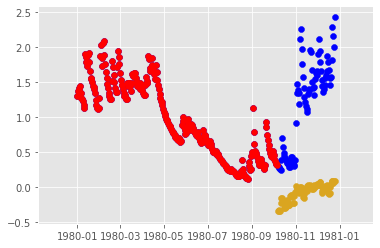

Epoch 0 batch 0 train Loss 0.6632 test Loss 0.5904 with training MSE metric 1.2244 and testing MSE metric 1.5289
NSE per seq:  -11.5591029677691
learning rate is 0.0003000000142492354


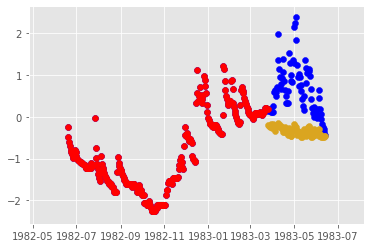

Epoch 0 batch 3 train Loss 0.4739 test Loss 0.4206 with training MSE metric 0.9723 and testing MSE metric 1.0259
NSE per seq:  -5.061746838409293
learning rate is 0.0003000000142492354


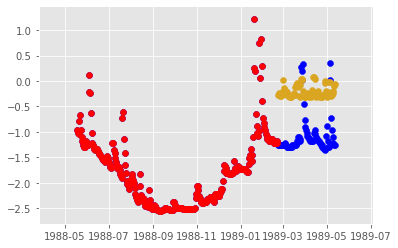

Epoch 0 batch 6 train Loss 0.3714 test Loss 0.3748 with training MSE metric 0.7540 and testing MSE metric 0.8337
NSE per seq:  -10.320506765530876
learning rate is 0.0003000000142492354


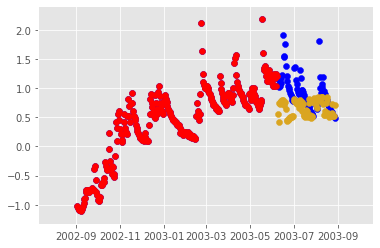

Epoch 0 batch 9 train Loss 0.3212 test Loss 0.3094 with training MSE metric 0.6423 and testing MSE metric 0.7750
NSE per seq:  -188.4438587671695
learning rate is 0.0003000000142492354


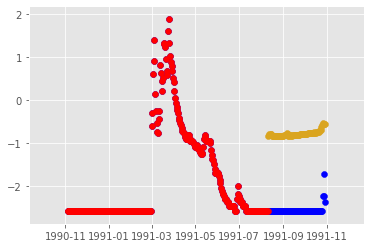

Epoch 0 batch 12 train Loss 0.3688 test Loss 0.3659 with training MSE metric 0.7916 and testing MSE metric 1.0241
NSE per seq:  -3.973948445399296
learning rate is 0.0003000000142492354


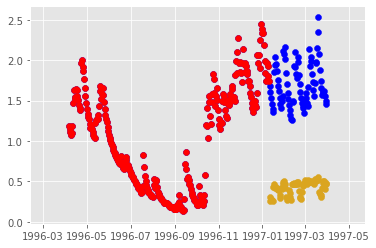

Epoch 0 batch 15 train Loss 0.3044 test Loss 0.3360 with training MSE metric 0.6003 and testing MSE metric 0.8605
NSE per seq:  -1.6221829282907685
learning rate is 0.0003000000142492354


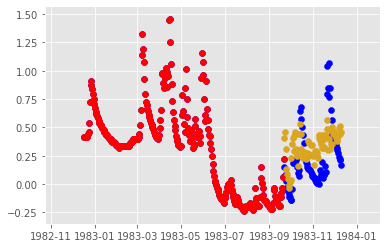

Epoch 0 batch 18 train Loss 0.2716 test Loss 0.2653 with training MSE metric 0.5215 and testing MSE metric 0.5457
NSE per seq:  -0.4588529774974932
learning rate is 0.0003000000142492354


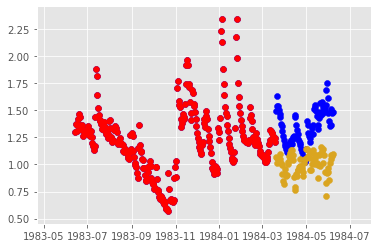

Epoch 0 batch 21 train Loss 0.2775 test Loss 0.2930 with training MSE metric 0.5841 and testing MSE metric 0.5923
NSE per seq:  -3.6793768658048474
learning rate is 0.0003000000142492354


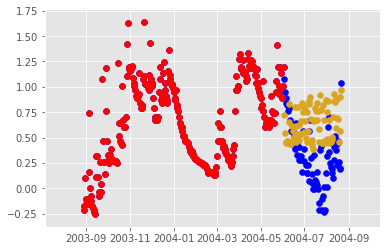

Epoch 0 batch 24 train Loss 0.2322 test Loss 0.1943 with training MSE metric 0.4816 and testing MSE metric 0.4620
NSE per seq:  -1.0226831210451863
learning rate is 0.0003000000142492354


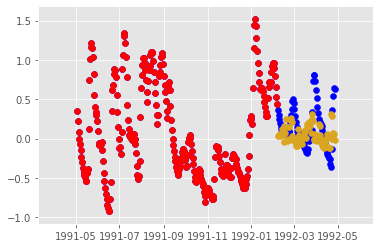

Epoch 0 batch 27 train Loss 0.2436 test Loss 0.3050 with training MSE metric 0.4435 and testing MSE metric 0.7301
NSE per seq:  -0.7098000692313808
learning rate is 0.0003000000142492354


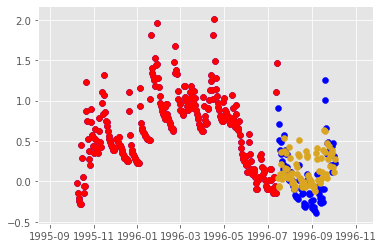

Epoch 0 batch 30 train Loss 0.2533 test Loss 0.3290 with training MSE metric 0.5586 and testing MSE metric 0.7940
NSE per seq:  -0.8328350751441234
learning rate is 0.0003000000142492354


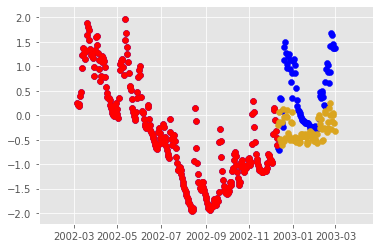

Epoch 0 batch 33 train Loss 0.2054 test Loss 0.2703 with training MSE metric 0.4419 and testing MSE metric 0.5611
NSE per seq:  -1.8305770397609065
learning rate is 0.0003000000142492354


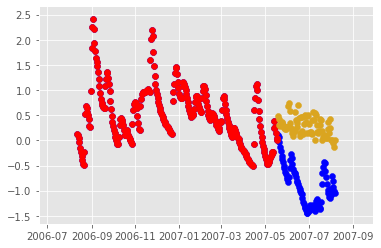

Epoch 0 batch 36 train Loss 0.2328 test Loss 0.2492 with training MSE metric 0.4943 and testing MSE metric 0.5322
NSE per seq:  -7.370955568083627
learning rate is 0.0003000000142492354


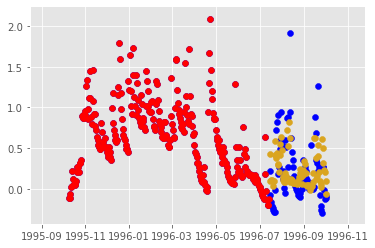

Epoch 0 batch 39 train Loss 0.2840 test Loss 0.2340 with training MSE metric 0.6057 and testing MSE metric 0.5289
NSE per seq:  -0.5456389751582509
learning rate is 0.0003000000142492354


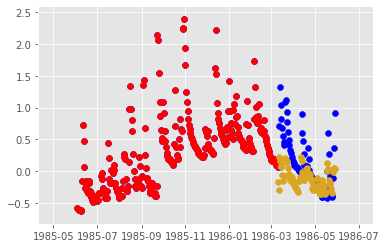

Epoch 0 batch 42 train Loss 0.2712 test Loss 0.2033 with training MSE metric 0.5466 and testing MSE metric 0.4544
NSE per seq:  -0.20672319581855786
learning rate is 0.0003000000142492354


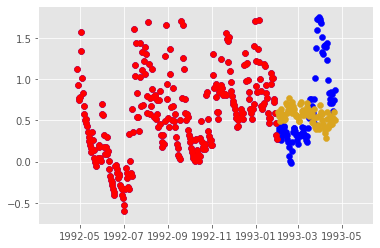

Epoch 0 batch 45 train Loss 0.2072 test Loss 0.1452 with training MSE metric 0.3955 and testing MSE metric 0.3392
NSE per seq:  -0.6881395694744836
learning rate is 0.0003000000142492354


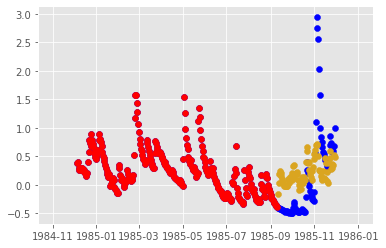

Epoch 0 batch 48 train Loss 0.2985 test Loss 0.2406 with training MSE metric 0.6409 and testing MSE metric 0.5438
NSE per seq:  -0.7270831482409477
learning rate is 0.0003000000142492354


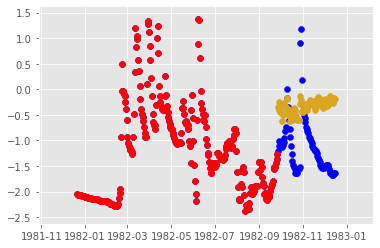

Epoch 0 batch 51 train Loss 0.2724 test Loss 0.1876 with training MSE metric 0.5457 and testing MSE metric 0.4294
NSE per seq:  -5.741972103037437
learning rate is 0.0003000000142492354


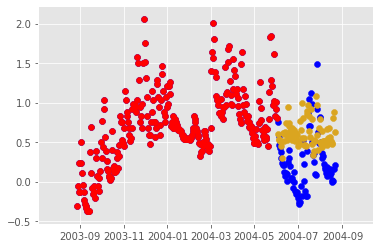

Epoch 0 batch 54 train Loss 0.2821 test Loss 0.2070 with training MSE metric 0.6036 and testing MSE metric 0.4699
NSE per seq:  -39.90074424087745
learning rate is 0.0003000000142492354


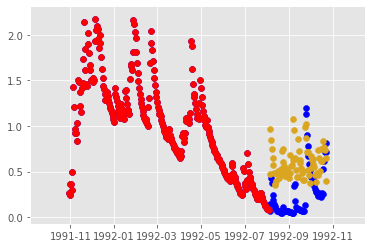

Epoch 0 batch 57 train Loss 0.2397 test Loss 0.1766 with training MSE metric 0.4826 and testing MSE metric 0.4069
NSE per seq:  -0.2702068412035631
learning rate is 0.0003000000142492354


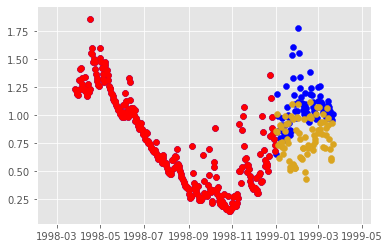

Epoch 0 batch 60 train Loss 0.1808 test Loss 0.1420 with training MSE metric 0.3818 and testing MSE metric 0.3760
NSE per seq:  -4.040347749789847
learning rate is 0.0003000000142492354


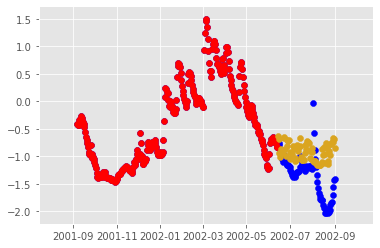

Epoch 0 batch 63 train Loss 0.2076 test Loss 0.2591 with training MSE metric 0.4782 and testing MSE metric 0.5484
NSE per seq:  -0.745206315001195
learning rate is 0.0003000000142492354


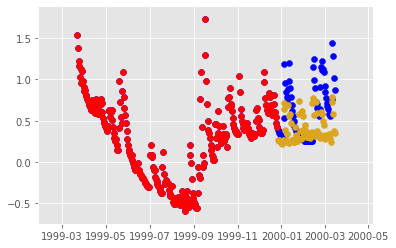

Epoch 0 batch 66 train Loss 0.2576 test Loss 0.1534 with training MSE metric 0.5340 and testing MSE metric 0.3846
NSE per seq:  -0.36580120399330734
learning rate is 0.0003000000142492354


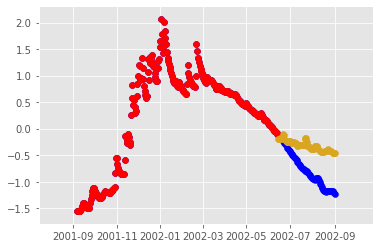

Epoch 0 batch 69 train Loss 0.1946 test Loss 0.2001 with training MSE metric 0.4350 and testing MSE metric 0.4763
NSE per seq:  -0.09993047901329584
learning rate is 0.0003000000142492354


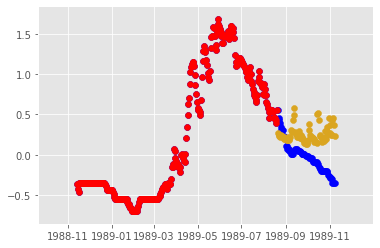

Epoch 0 batch 72 train Loss 0.1748 test Loss 0.2201 with training MSE metric 0.3835 and testing MSE metric 0.5146
NSE per seq:  -26.73208607504811
learning rate is 0.0003000000142492354


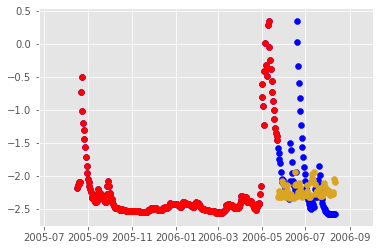

Epoch 0 batch 75 train Loss 0.1635 test Loss 0.2068 with training MSE metric 0.3692 and testing MSE metric 0.5168
NSE per seq:  -0.24875957632715873
learning rate is 0.0003000000142492354


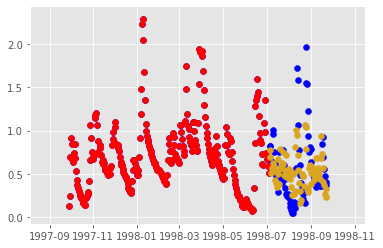

Epoch 0 batch 78 train Loss 0.2015 test Loss 0.1426 with training MSE metric 0.4274 and testing MSE metric 0.3851
NSE per seq:  -1.2324952239998508
learning rate is 0.0003000000142492354


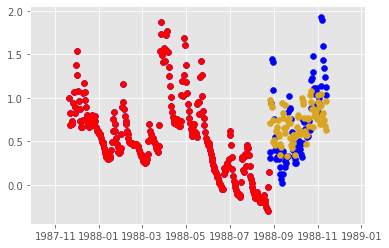

Epoch 0 batch 81 train Loss 0.1721 test Loss 0.1653 with training MSE metric 0.3813 and testing MSE metric 0.3436
NSE per seq:  -0.31580327689519344
learning rate is 0.0003000000142492354


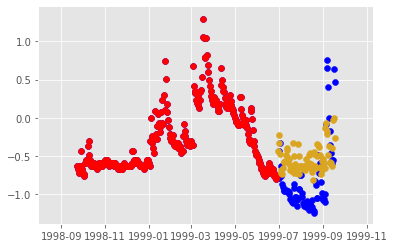

Epoch 0 batch 84 train Loss 0.2348 test Loss 0.1279 with training MSE metric 0.5292 and testing MSE metric 0.3336
NSE per seq:  -0.05336732813953126
learning rate is 0.0003000000142492354


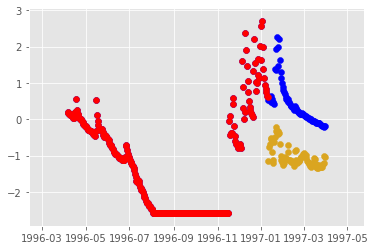

Epoch 0 batch 87 train Loss 0.2547 test Loss 0.0917 with training MSE metric 0.5228 and testing MSE metric 0.3367
NSE per seq:  -0.704465989739279
learning rate is 0.0003000000142492354


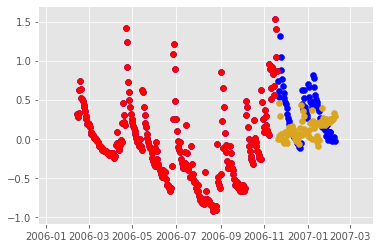

Epoch 0 batch 90 train Loss 0.1838 test Loss 0.0979 with training MSE metric 0.4334 and testing MSE metric 0.2448
NSE per seq:  -1.2691297672432302
learning rate is 0.0003000000142492354


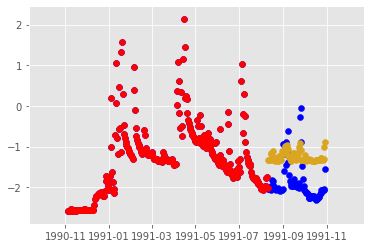

Epoch 0 batch 93 train Loss 0.1396 test Loss 0.2168 with training MSE metric 0.3341 and testing MSE metric 0.4563
NSE per seq:  -1.4426454753329327
learning rate is 0.0003000000142492354


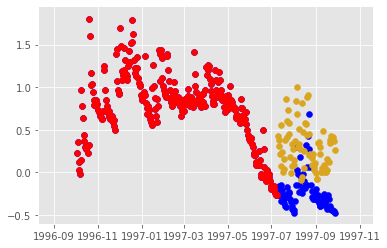

Epoch 0 batch 96 train Loss 0.1567 test Loss 0.1463 with training MSE metric 0.3995 and testing MSE metric 0.3751
NSE per seq:  -0.32388566694347315
learning rate is 0.0003000000142492354


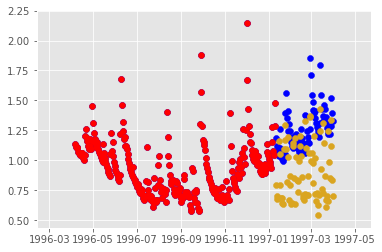

Epoch 0 batch 99 train Loss 0.1290 test Loss 0.2612 with training MSE metric 0.3092 and testing MSE metric 0.6238
NSE per seq:  -3.2149172158983883
learning rate is 0.0003000000142492354


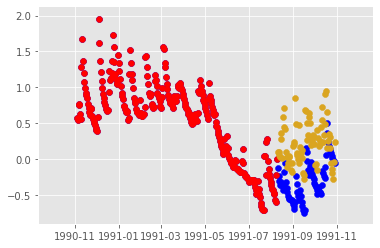

Epoch 0 batch 102 train Loss 0.1444 test Loss 0.1805 with training MSE metric 0.3449 and testing MSE metric 0.4831
NSE per seq:  -0.24396985402955074
learning rate is 0.0003000000142492354


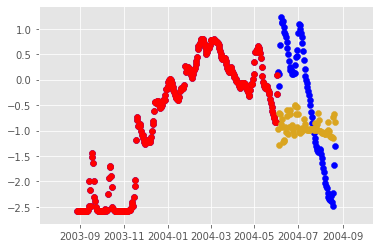

Epoch 0 batch 105 train Loss 0.1420 test Loss 0.1820 with training MSE metric 0.3791 and testing MSE metric 0.4391
NSE per seq:  -0.41003341983838426
learning rate is 0.0003000000142492354


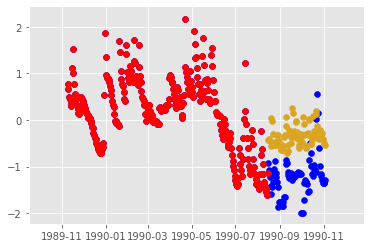

Epoch 0 batch 108 train Loss 0.1424 test Loss 0.2160 with training MSE metric 0.3157 and testing MSE metric 0.5332
NSE per seq:  -0.37569345481721517
learning rate is 0.0003000000142492354


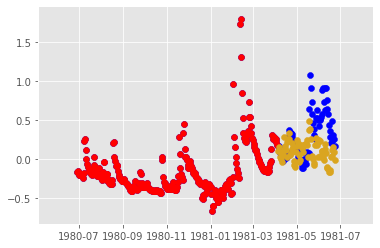

Epoch 0 batch 111 train Loss 0.1471 test Loss 0.1097 with training MSE metric 0.3510 and testing MSE metric 0.3795
NSE per seq:  -0.06120246458237434
learning rate is 0.0003000000142492354


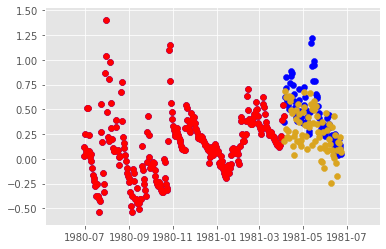

Epoch 0 batch 114 train Loss 0.1705 test Loss 0.1036 with training MSE metric 0.4552 and testing MSE metric 0.3288
NSE per seq:  -0.14165788604798554
learning rate is 0.0003000000142492354


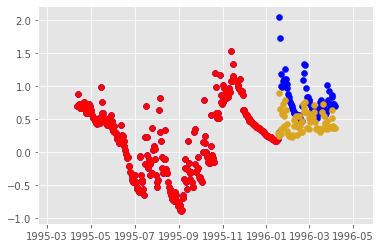

Epoch 0 batch 117 train Loss 0.1954 test Loss 0.0499 with training MSE metric 0.4679 and testing MSE metric 0.2344
NSE per seq:  0.028067169513330992
learning rate is 0.0003000000142492354


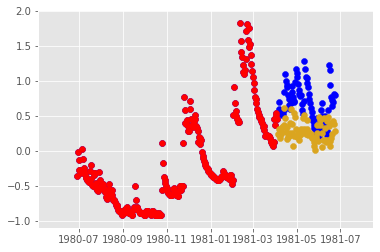

Epoch 0 batch 120 train Loss 0.1743 test Loss 0.2446 with training MSE metric 0.4437 and testing MSE metric 0.5736
NSE per seq:  -0.00012956151149481898
learning rate is 0.0003000000142492354


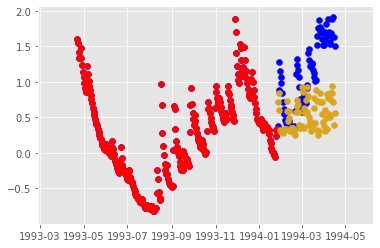

Epoch 0 batch 123 train Loss 0.1650 test Loss 0.0657 with training MSE metric 0.4261 and testing MSE metric 0.2536
NSE per seq:  -0.2862921567105685
learning rate is 0.0003000000142492354


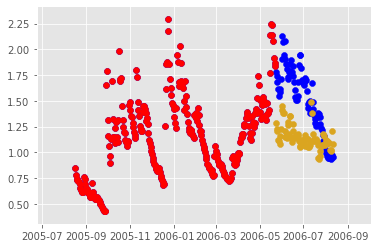

Epoch 0 batch 126 train Loss 0.2057 test Loss 0.1182 with training MSE metric 0.4757 and testing MSE metric 0.3374
NSE per seq:  -17.042139496182113
learning rate is 0.0003000000142492354


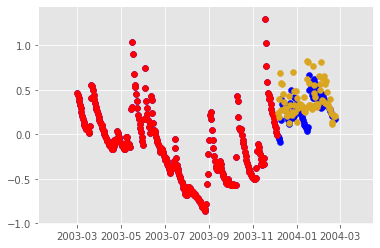

Epoch 0 batch 129 train Loss 0.1735 test Loss 0.1138 with training MSE metric 0.4093 and testing MSE metric 0.2969
NSE per seq:  -0.11536439692999545
learning rate is 0.0003000000142492354


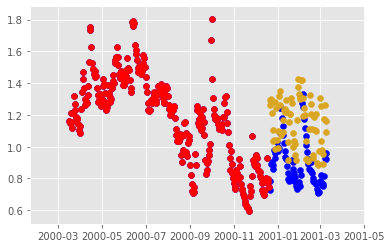

Epoch 0 batch 132 train Loss 0.1582 test Loss 0.0152 with training MSE metric 0.3990 and testing MSE metric 0.1858
NSE per seq:  -0.3933284521837064
learning rate is 0.0003000000142492354


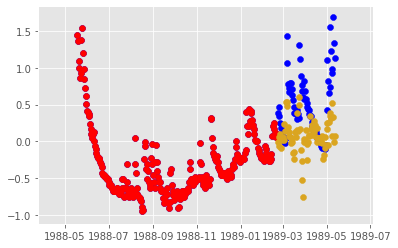

Epoch 0 batch 135 train Loss 0.1526 test Loss 0.0989 with training MSE metric 0.3896 and testing MSE metric 0.3264
NSE per seq:  -0.022471620437798656
learning rate is 0.0003000000142492354


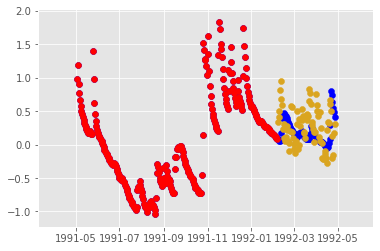

Epoch 0 batch 138 train Loss 0.0931 test Loss 0.0361 with training MSE metric 0.2818 and testing MSE metric 0.2627
NSE per seq:  -0.05110364997918065
learning rate is 0.0003000000142492354


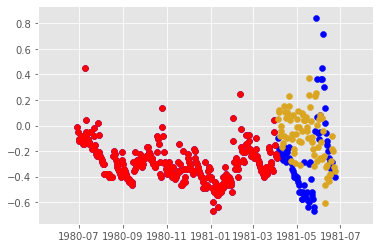

Epoch 0 batch 141 train Loss 0.1522 test Loss 0.0500 with training MSE metric 0.4085 and testing MSE metric 0.2312
NSE per seq:  0.077877490986826
learning rate is 0.0003000000142492354


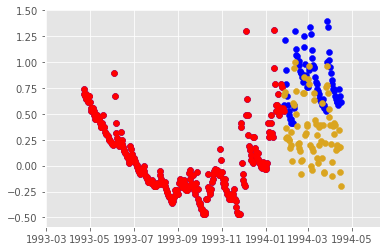

Epoch 0 batch 144 train Loss 0.1347 test Loss 0.0845 with training MSE metric 0.3634 and testing MSE metric 0.3078
NSE per seq:  -0.023880544954811803
learning rate is 0.0003000000142492354


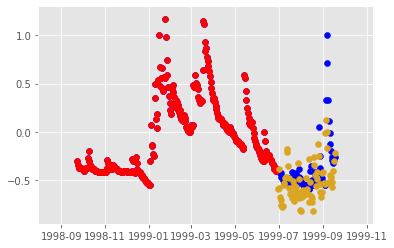

Epoch 0 batch 147 train Loss 0.1104 test Loss 0.1651 with training MSE metric 0.2937 and testing MSE metric 0.4367
NSE per seq:  0.042089928918588426
learning rate is 0.0003000000142492354


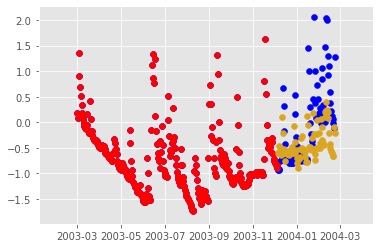

Epoch 0 batch 150 train Loss 0.1419 test Loss 0.0473 with training MSE metric 0.3281 and testing MSE metric 0.2701
NSE per seq:  -0.02682522896677883
learning rate is 0.0003000000142492354


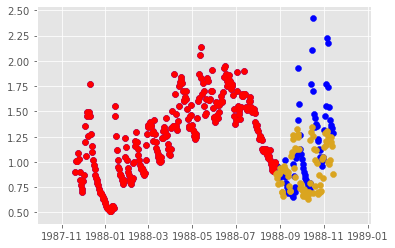

Epoch 0 batch 153 train Loss 0.0854 test Loss 0.0884 with training MSE metric 0.2940 and testing MSE metric 0.3356
NSE per seq:  -0.25115713511093196
learning rate is 0.0003000000142492354


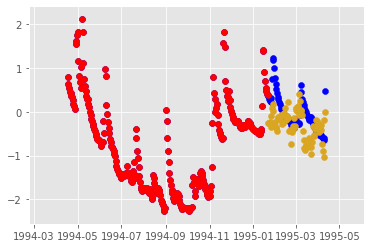

Epoch 0 batch 156 train Loss 0.2207 test Loss 0.0850 with training MSE metric 0.5271 and testing MSE metric 0.2799
NSE per seq:  0.11424513608066436
learning rate is 0.0003000000142492354


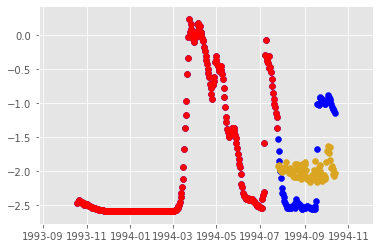

Epoch 0 batch 159 train Loss 0.1672 test Loss 0.0711 with training MSE metric 0.3705 and testing MSE metric 0.2951
NSE per seq:  0.24307179188669226
learning rate is 0.0003000000142492354


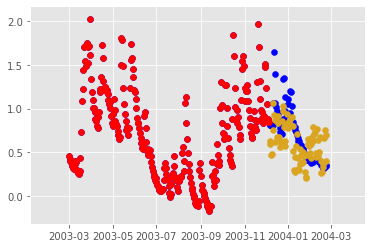

Epoch 0 batch 162 train Loss 0.1587 test Loss 0.0597 with training MSE metric 0.3705 and testing MSE metric 0.2455
NSE per seq:  -0.05008215481090787
learning rate is 0.0003000000142492354


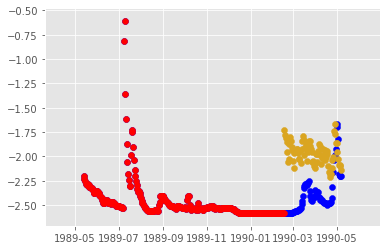

Epoch 0 batch 165 train Loss 0.1099 test Loss 0.0791 with training MSE metric 0.3221 and testing MSE metric 0.3451
NSE per seq:  -0.0822922969433802
learning rate is 0.0003000000142492354


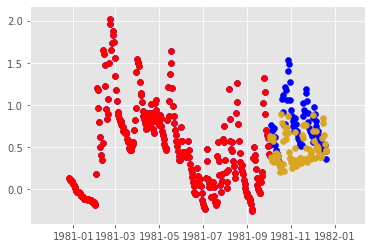

Epoch 0 batch 168 train Loss 0.1657 test Loss 0.0240 with training MSE metric 0.3928 and testing MSE metric 0.2313
NSE per seq:  0.1363580351535405
learning rate is 0.0003000000142492354


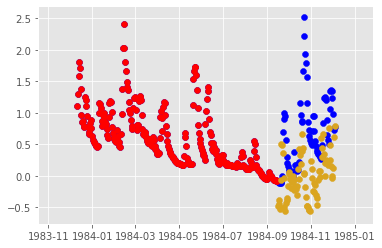

Epoch 0 batch 171 train Loss 0.1213 test Loss 0.1064 with training MSE metric 0.3349 and testing MSE metric 0.4216
NSE per seq:  0.13112866697432898
learning rate is 0.0003000000142492354


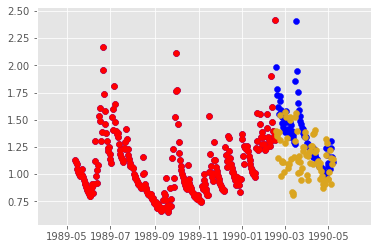

Epoch 0 batch 174 train Loss 0.0982 test Loss 0.0392 with training MSE metric 0.3125 and testing MSE metric 0.2104
NSE per seq:  -0.061409060015602264
learning rate is 0.0003000000142492354


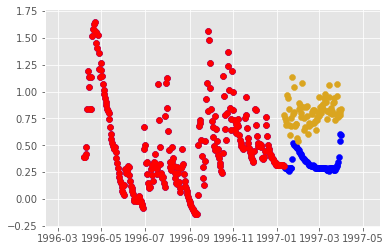

Epoch 0 batch 177 train Loss 0.0976 test Loss 0.0566 with training MSE metric 0.3020 and testing MSE metric 0.2672
NSE per seq:  -0.4552706412125298
learning rate is 0.0003000000142492354


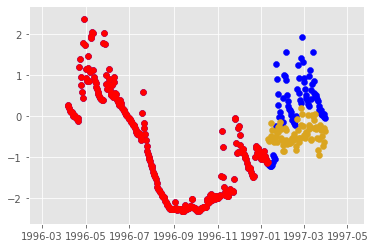

Epoch 0 batch 180 train Loss 0.1456 test Loss 0.0509 with training MSE metric 0.4136 and testing MSE metric 0.2984
NSE per seq:  -10.251630872893237
learning rate is 0.0003000000142492354


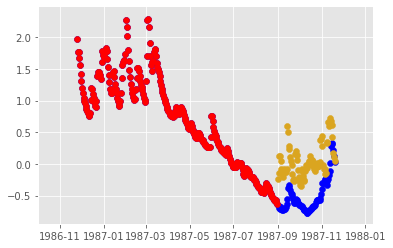

Epoch 0 batch 183 train Loss 0.1984 test Loss 0.1085 with training MSE metric 0.4470 and testing MSE metric 0.3897
NSE per seq:  0.014042841000651105
learning rate is 0.0003000000142492354


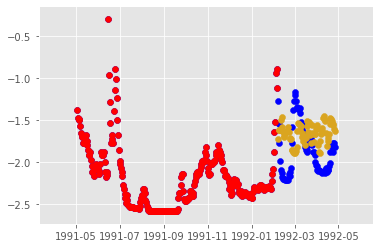

Epoch 0 batch 186 train Loss 0.1282 test Loss 0.1172 with training MSE metric 0.3346 and testing MSE metric 0.3372
NSE per seq:  0.13435286928378504
learning rate is 0.0003000000142492354


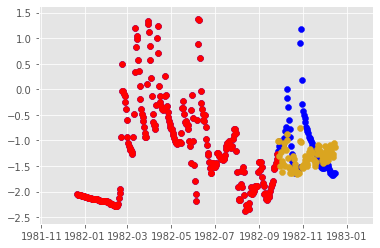

Epoch 0 batch 189 train Loss 0.1100 test Loss 0.0915 with training MSE metric 0.3357 and testing MSE metric 0.2910
NSE per seq:  -0.16468299976733286
learning rate is 0.0003000000142492354


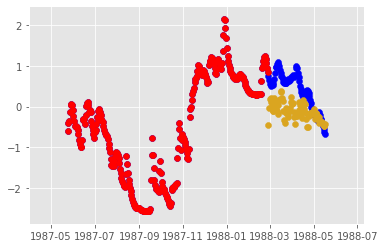

Epoch 0 batch 192 train Loss 0.1384 test Loss 0.0926 with training MSE metric 0.4061 and testing MSE metric 0.3277
NSE per seq:  -0.04448557961810122
learning rate is 0.0003000000142492354


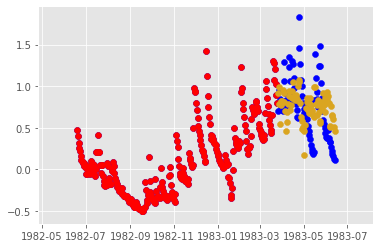

Epoch 0 batch 195 train Loss 0.1354 test Loss 0.0487 with training MSE metric 0.3485 and testing MSE metric 0.2887
NSE per seq:  -1.8158471688431193
learning rate is 0.0003000000142492354


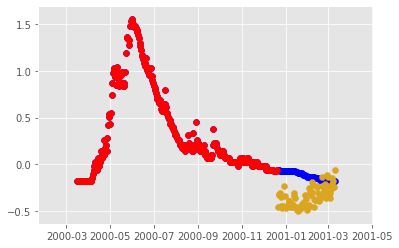

Epoch 0 batch 198 train Loss 0.0742 test Loss 0.0715 with training MSE metric 0.2970 and testing MSE metric 0.3194
NSE per seq:  -0.5582052195865959
learning rate is 0.0003000000142492354


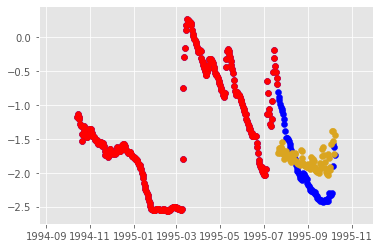

Epoch 0 batch 201 train Loss 0.0964 test Loss 0.1079 with training MSE metric 0.2864 and testing MSE metric 0.3230
NSE per seq:  0.04717089094850713
learning rate is 0.0003000000142492354


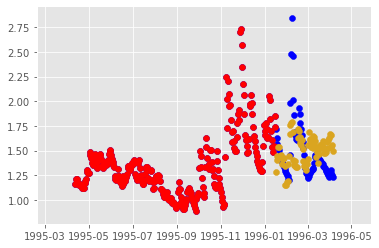

Epoch 0 batch 204 train Loss 0.0698 test Loss 0.0249 with training MSE metric 0.2939 and testing MSE metric 0.2473
NSE per seq:  0.05790930216573478
learning rate is 0.0003000000142492354


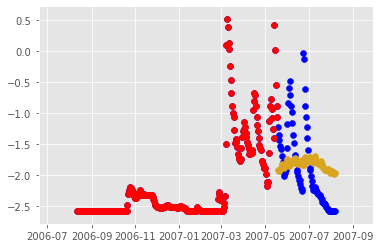

Epoch 0 batch 207 train Loss 0.1197 test Loss 0.0430 with training MSE metric 0.2998 and testing MSE metric 0.2822
NSE per seq:  0.2591233878533724
learning rate is 0.0003000000142492354


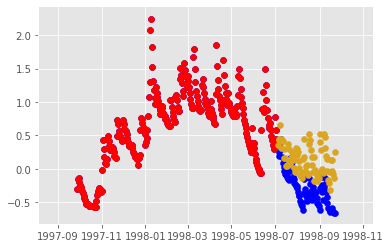

Epoch 0 batch 210 train Loss 0.1048 test Loss 0.0691 with training MSE metric 0.3386 and testing MSE metric 0.2769
NSE per seq:  -0.0024038854062409937
learning rate is 0.0003000000142492354


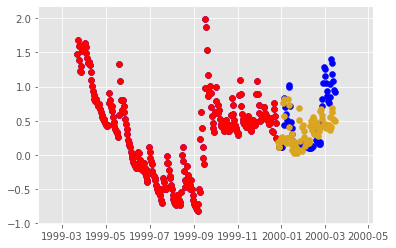

Epoch 0 batch 213 train Loss 0.0724 test Loss -0.0331 with training MSE metric 0.2928 and testing MSE metric 0.1938
NSE per seq:  -1.698278431977815
learning rate is 0.0003000000142492354


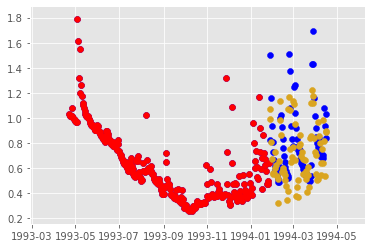

Epoch 0 batch 216 train Loss 0.0501 test Loss 0.0013 with training MSE metric 0.2690 and testing MSE metric 0.2287
NSE per seq:  -0.4307531993038103
learning rate is 0.0003000000142492354


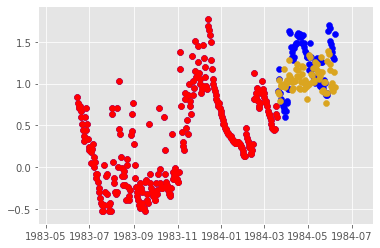

Epoch 0 batch 219 train Loss 0.0937 test Loss 0.0090 with training MSE metric 0.3177 and testing MSE metric 0.1915
NSE per seq:  -4.221273817373843
learning rate is 0.0003000000142492354


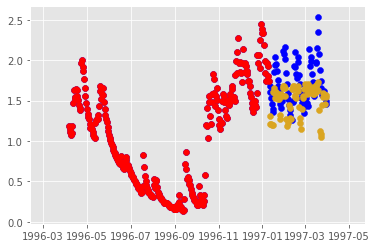

Epoch 0 batch 222 train Loss 0.1207 test Loss 0.0148 with training MSE metric 0.3425 and testing MSE metric 0.2100
NSE per seq:  -0.18734415169839685
learning rate is 0.0003000000142492354


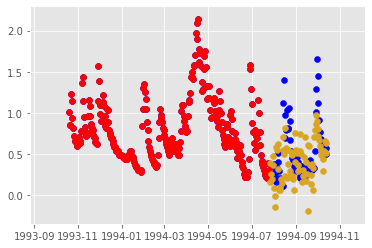

Epoch 0 batch 225 train Loss 0.1218 test Loss 0.0901 with training MSE metric 0.3747 and testing MSE metric 0.4195
NSE per seq:  -0.21428208563410672
learning rate is 0.0003000000142492354


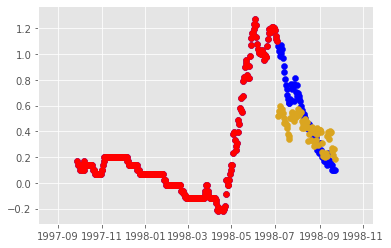

Epoch 0 batch 228 train Loss 0.0562 test Loss 0.0615 with training MSE metric 0.2928 and testing MSE metric 0.3058
NSE per seq:  0.17596041822448738
learning rate is 0.0003000000142492354


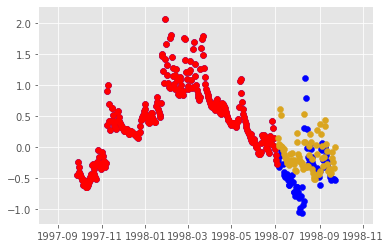

Epoch 0 batch 231 train Loss 0.0559 test Loss 0.0066 with training MSE metric 0.2633 and testing MSE metric 0.2251
NSE per seq:  -0.03501368875777022
learning rate is 0.0003000000142492354


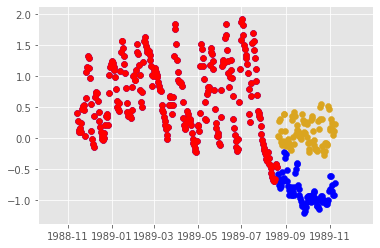

Epoch 0 batch 234 train Loss 0.0262 test Loss 0.0335 with training MSE metric 0.2386 and testing MSE metric 0.2628
NSE per seq:  0.3233316061779916
learning rate is 0.0003000000142492354


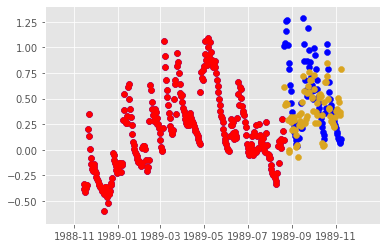

Epoch 0 batch 237 train Loss 0.1057 test Loss 0.0464 with training MSE metric 0.3600 and testing MSE metric 0.2777
NSE per seq:  -0.47917965024316755
learning rate is 0.0003000000142492354


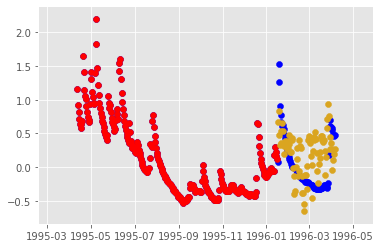

Epoch 0 batch 240 train Loss 0.0293 test Loss 0.0493 with training MSE metric 0.2336 and testing MSE metric 0.2971
NSE per seq:  -0.2991876243523677
learning rate is 0.0003000000142492354


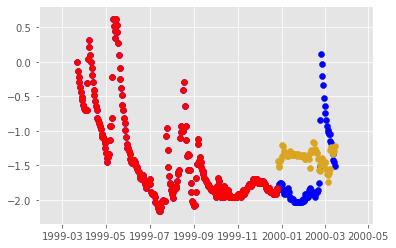

Epoch 0 batch 243 train Loss 0.0889 test Loss 0.0290 with training MSE metric 0.3338 and testing MSE metric 0.3748
NSE per seq:  0.14730684942912442
learning rate is 0.0003000000142492354


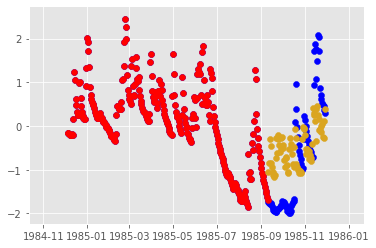

Epoch 0 batch 246 train Loss 0.0469 test Loss 0.0363 with training MSE metric 0.2732 and testing MSE metric 0.2517
NSE per seq:  0.13002004207708978
learning rate is 0.0003000000142492354


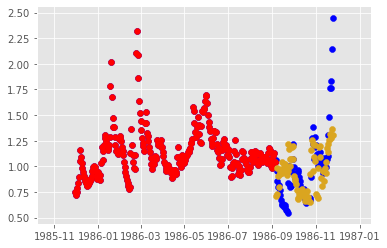

Epoch 0 batch 249 train Loss 0.0348 test Loss 0.0072 with training MSE metric 0.2512 and testing MSE metric 0.2426
NSE per seq:  -0.4654507560176778
learning rate is 0.0003000000142492354


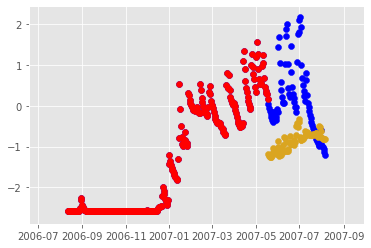

Epoch 0 batch 252 train Loss 0.0864 test Loss -0.0237 with training MSE metric 0.3478 and testing MSE metric 0.2211
NSE per seq:  0.10202984349391386
learning rate is 0.0003000000142492354


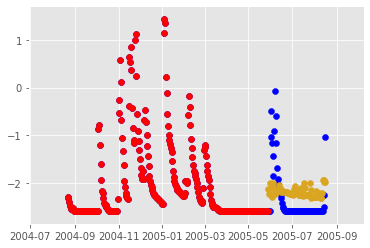

Epoch 0 batch 255 train Loss 0.0376 test Loss 0.0142 with training MSE metric 0.2828 and testing MSE metric 0.3495
NSE per seq:  0.13133613989427215
learning rate is 0.0003000000142492354


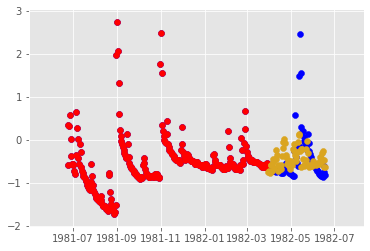

Epoch 0 batch 258 train Loss 0.0569 test Loss 0.0205 with training MSE metric 0.2814 and testing MSE metric 0.3161
NSE per seq:  0.08664244305093015
learning rate is 0.0003000000142492354


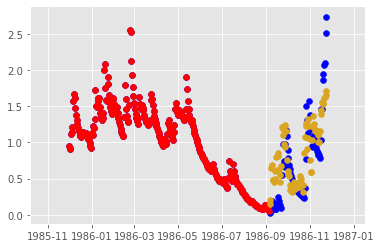

Epoch 0 batch 261 train Loss 0.0707 test Loss -0.0468 with training MSE metric 0.2578 and testing MSE metric 0.1709
NSE per seq:  -0.30940714494648197
learning rate is 0.0003000000142492354


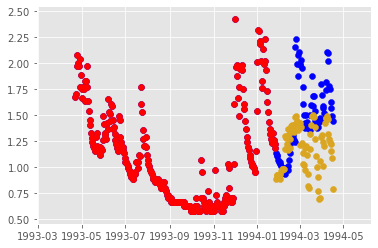

Epoch 0 batch 264 train Loss 0.1012 test Loss 0.0393 with training MSE metric 0.3192 and testing MSE metric 0.2631
NSE per seq:  -0.13623191183954741
learning rate is 0.0003000000142492354


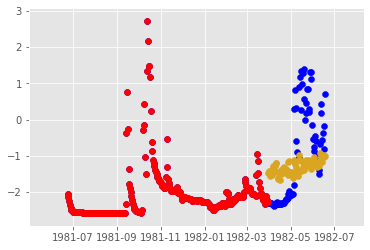

Epoch 0 batch 267 train Loss 0.0204 test Loss 0.0221 with training MSE metric 0.2532 and testing MSE metric 0.2558
NSE per seq:  0.38048460650832006
learning rate is 0.0003000000142492354


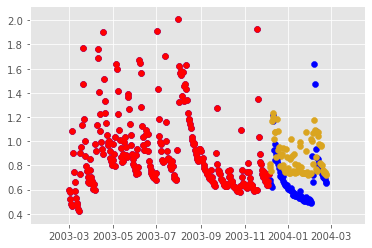

Epoch 0 batch 270 train Loss 0.0823 test Loss -0.0178 with training MSE metric 0.2932 and testing MSE metric 0.2279
NSE per seq:  -0.02252742370838294
learning rate is 0.0003000000142492354


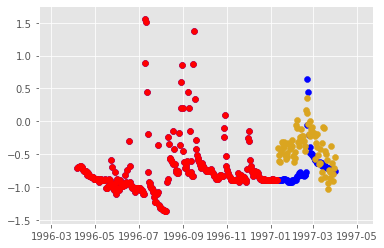

Epoch 0 batch 273 train Loss 0.0615 test Loss 0.0004 with training MSE metric 0.2720 and testing MSE metric 0.2321
NSE per seq:  0.18047935689992745
learning rate is 0.0003000000142492354


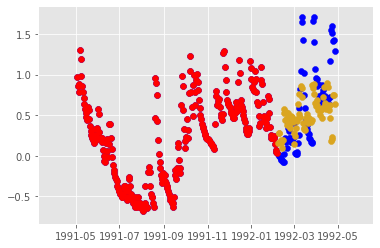

Epoch 0 batch 276 train Loss 0.0442 test Loss 0.0641 with training MSE metric 0.2404 and testing MSE metric 0.3817
NSE per seq:  0.31994372206544075
learning rate is 0.0003000000142492354


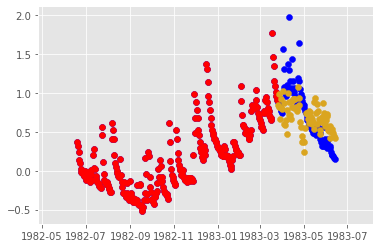

Epoch 0 batch 279 train Loss 0.0284 test Loss -0.0157 with training MSE metric 0.2233 and testing MSE metric 0.2348
NSE per seq:  0.05001869602602716
learning rate is 0.0003000000142492354


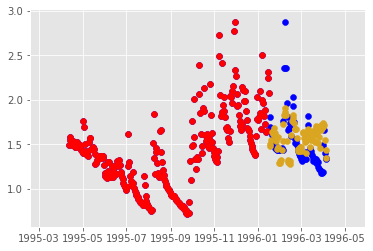

Epoch 0 batch 282 train Loss 0.1040 test Loss -0.0332 with training MSE metric 0.3544 and testing MSE metric 0.2137
NSE per seq:  0.38065348152537326
learning rate is 0.0003000000142492354


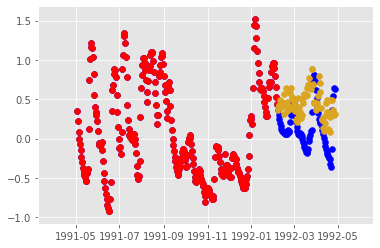

Epoch 0 batch 285 train Loss 0.0192 test Loss 0.0353 with training MSE metric 0.2263 and testing MSE metric 0.2408
NSE per seq:  0.010559216426652106
learning rate is 0.0003000000142492354


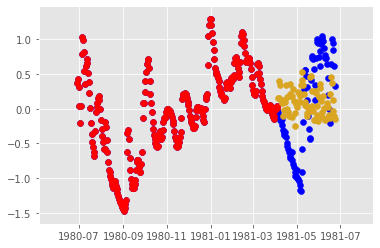

Epoch 0 batch 288 train Loss 0.0702 test Loss 0.0753 with training MSE metric 0.2881 and testing MSE metric 0.3048
NSE per seq:  0.22142373929558629
learning rate is 0.0003000000142492354


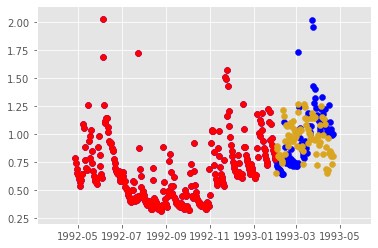

Epoch 0 batch 291 train Loss 0.0345 test Loss 0.0762 with training MSE metric 0.2771 and testing MSE metric 0.2900
NSE per seq:  -0.1423581400724716
learning rate is 0.0003000000142492354


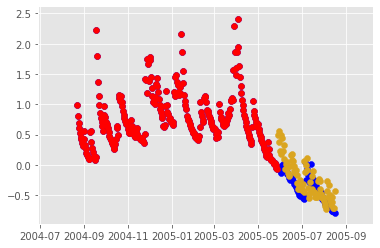

Epoch 0 batch 294 train Loss 0.0469 test Loss -0.0455 with training MSE metric 0.2610 and testing MSE metric 0.1731
NSE per seq:  0.06986468857748365
learning rate is 0.0003000000142492354


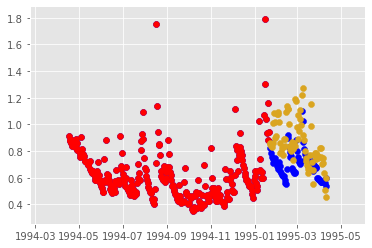

Epoch 0 batch 297 train Loss 0.0451 test Loss -0.0120 with training MSE metric 0.2693 and testing MSE metric 0.1935
NSE per seq:  0.1633118184110287
learning rate is 0.0003000000142492354


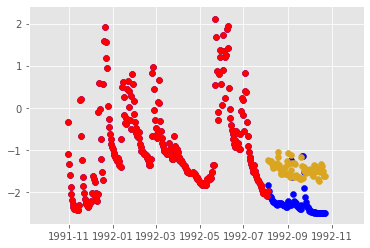

Epoch 0 batch 300 train Loss 0.0859 test Loss 0.0876 with training MSE metric 0.3235 and testing MSE metric 0.3339
NSE per seq:  0.29115017976423596
learning rate is 0.0003000000142492354


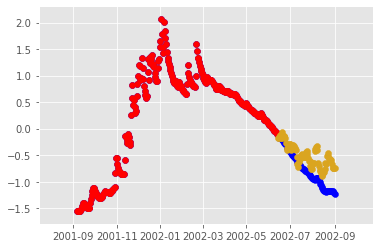

Epoch 0 batch 303 train Loss -0.0106 test Loss -0.0263 with training MSE metric 0.2150 and testing MSE metric 0.2184
NSE per seq:  0.1677336336809057
learning rate is 0.0003000000142492354


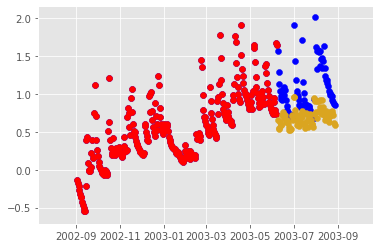

Epoch 0 batch 306 train Loss 0.0004 test Loss -0.0288 with training MSE metric 0.2283 and testing MSE metric 0.2312
NSE per seq:  -0.1070044013241097
learning rate is 0.0003000000142492354


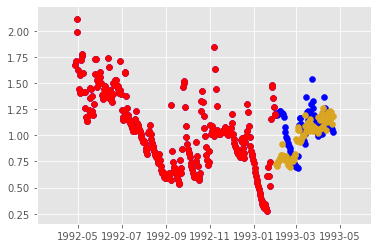

Epoch 0 batch 309 train Loss 0.0692 test Loss -0.0140 with training MSE metric 0.3166 and testing MSE metric 0.2501
NSE per seq:  -0.2417661586288653
learning rate is 0.0003000000142492354


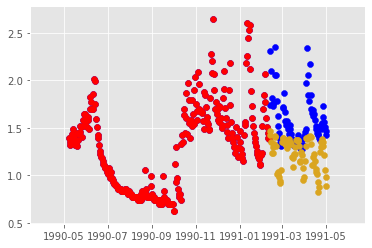

Epoch 0 batch 312 train Loss 0.0598 test Loss -0.0323 with training MSE metric 0.2609 and testing MSE metric 0.1768
NSE per seq:  0.23961033626480477
learning rate is 0.0003000000142492354


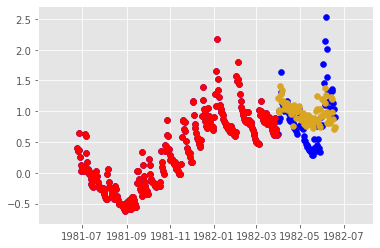

Epoch 0 batch 315 train Loss 0.0835 test Loss 0.0463 with training MSE metric 0.2863 and testing MSE metric 0.2979
NSE per seq:  -0.07397686103152556
learning rate is 0.0003000000142492354


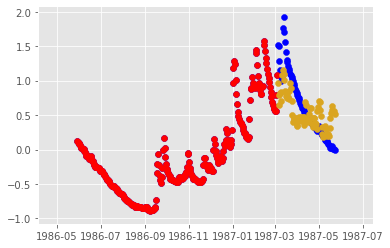

Epoch 0 batch 318 train Loss 0.0519 test Loss 0.0153 with training MSE metric 0.2624 and testing MSE metric 0.2613
NSE per seq:  0.2906817299135991
learning rate is 0.0003000000142492354


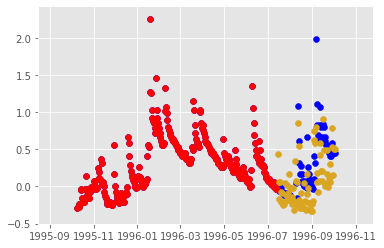

Epoch 0 batch 321 train Loss 0.0173 test Loss -0.0308 with training MSE metric 0.2379 and testing MSE metric 0.2252
NSE per seq:  0.25950476207370177
learning rate is 0.0003000000142492354


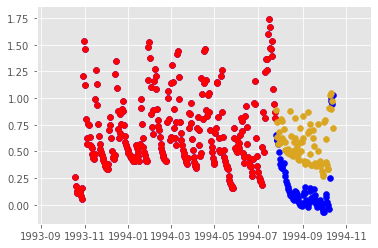

Epoch 0 batch 324 train Loss 0.0404 test Loss 0.0150 with training MSE metric 0.2588 and testing MSE metric 0.2418
NSE per seq:  -0.30862288243875574
learning rate is 0.0003000000142492354


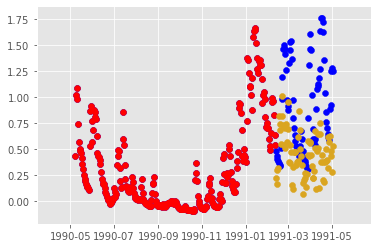

Epoch 0 batch 327 train Loss 0.0587 test Loss 0.0408 with training MSE metric 0.2774 and testing MSE metric 0.2781
NSE per seq:  0.20139176194699354
learning rate is 0.0003000000142492354


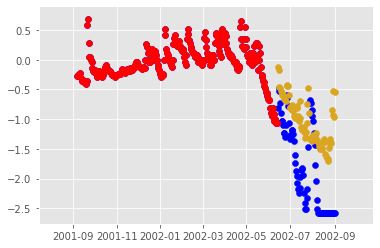

Epoch 0 batch 330 train Loss 0.0165 test Loss -0.0258 with training MSE metric 0.2583 and testing MSE metric 0.2516
NSE per seq:  0.4701497047429999
learning rate is 0.0003000000142492354


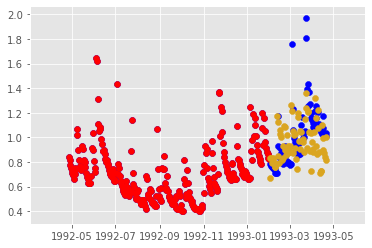

Epoch 0 batch 333 train Loss 0.0334 test Loss -0.0570 with training MSE metric 0.2579 and testing MSE metric 0.1935
NSE per seq:  0.3873779755106157
learning rate is 0.0003000000142492354


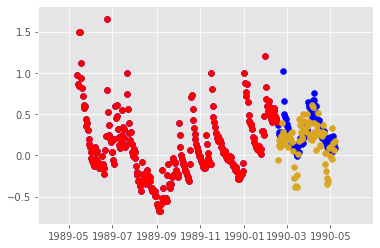

Epoch 0 batch 336 train Loss 0.0556 test Loss 0.0957 with training MSE metric 0.2735 and testing MSE metric 0.3984
NSE per seq:  -0.3600750935573862
learning rate is 0.0003000000142492354


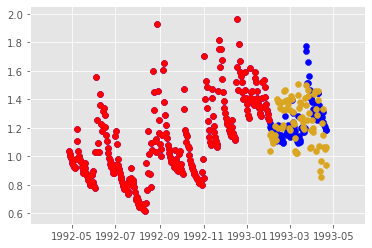

Epoch 0 batch 339 train Loss 0.0711 test Loss 0.0404 with training MSE metric 0.2961 and testing MSE metric 0.3402
NSE per seq:  -0.010948886163795774
learning rate is 0.0003000000142492354


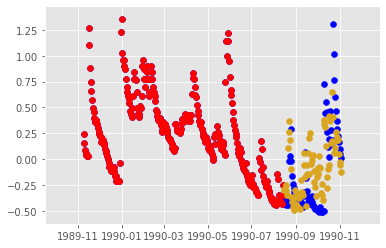

Epoch 0 batch 342 train Loss 0.0866 test Loss -0.0248 with training MSE metric 0.3542 and testing MSE metric 0.2151
NSE per seq:  0.15535907394567483
learning rate is 0.0003000000142492354


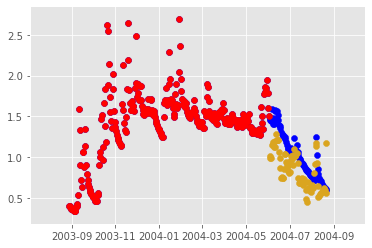

Epoch 0 batch 345 train Loss -0.0284 test Loss 0.0240 with training MSE metric 0.1885 and testing MSE metric 0.2618
NSE per seq:  -0.04934722441591019
learning rate is 0.0003000000142492354


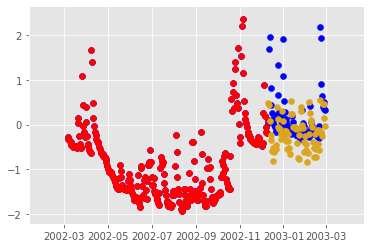

Epoch 0 batch 348 train Loss -0.0254 test Loss 0.0054 with training MSE metric 0.2342 and testing MSE metric 0.2471
NSE per seq:  0.2070702811635147
learning rate is 0.0003000000142492354


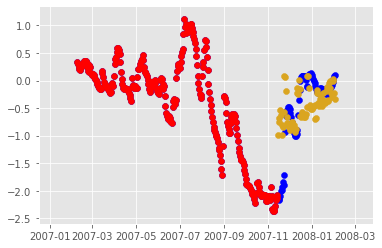

Epoch 0 batch 351 train Loss 0.0096 test Loss 0.0926 with training MSE metric 0.2292 and testing MSE metric 0.3083
NSE per seq:  -1.5983780402224343
learning rate is 0.0003000000142492354


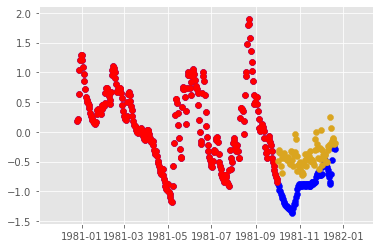

Epoch 0 batch 354 train Loss 0.0269 test Loss 0.0380 with training MSE metric 0.2518 and testing MSE metric 0.2684
NSE per seq:  0.3583479827999527
learning rate is 0.0003000000142492354


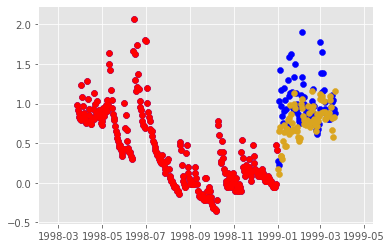

Epoch 0 batch 357 train Loss 0.0432 test Loss 0.0255 with training MSE metric 0.2770 and testing MSE metric 0.2623
NSE per seq:  0.07998428283662565
learning rate is 0.0003000000142492354


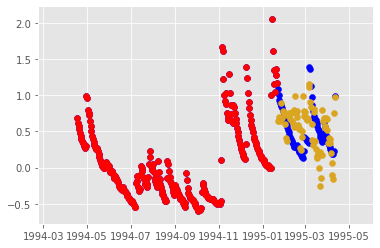

Epoch 0 batch 360 train Loss 0.0261 test Loss 0.0131 with training MSE metric 0.2445 and testing MSE metric 0.2604
NSE per seq:  0.3544467138417877
learning rate is 0.0003000000142492354


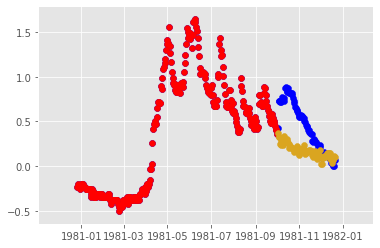

Epoch 0 batch 363 train Loss 0.0125 test Loss -0.0416 with training MSE metric 0.2495 and testing MSE metric 0.2126
NSE per seq:  -0.15961605188686465
learning rate is 0.0003000000142492354


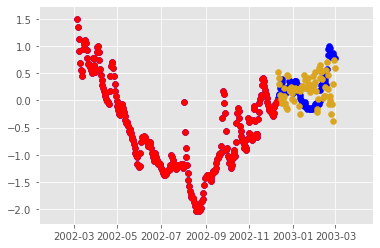

Epoch 0 batch 366 train Loss -0.0264 test Loss -0.0162 with training MSE metric 0.2106 and testing MSE metric 0.2142
NSE per seq:  -0.631749712169742
learning rate is 0.0003000000142492354


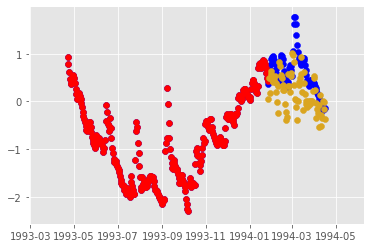

Epoch 0 batch 369 train Loss -0.0031 test Loss 0.0107 with training MSE metric 0.2355 and testing MSE metric 0.2245
NSE per seq:  0.4760749500893555
learning rate is 0.0003000000142492354


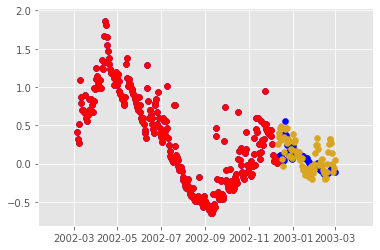

Epoch 0 batch 372 train Loss 0.0516 test Loss -0.0332 with training MSE metric 0.2661 and testing MSE metric 0.2119
NSE per seq:  0.3138878923521045
learning rate is 0.0003000000142492354


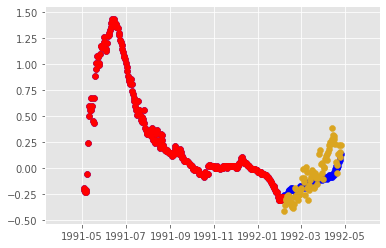

Epoch 0 batch 375 train Loss 0.0698 test Loss -0.0163 with training MSE metric 0.3006 and testing MSE metric 0.1991
NSE per seq:  0.009709041983110345
learning rate is 0.0003000000142492354


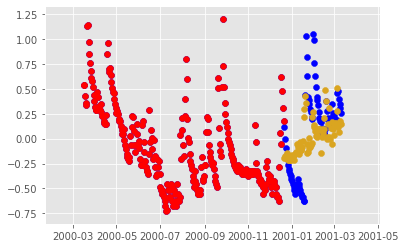

Epoch 0 batch 378 train Loss -0.0142 test Loss -0.0510 with training MSE metric 0.2030 and testing MSE metric 0.1790
NSE per seq:  -0.18154998426128577
learning rate is 0.0003000000142492354


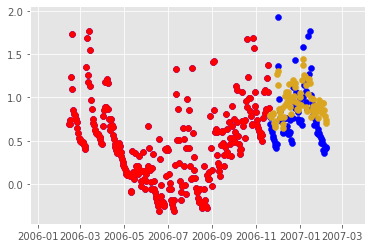

Epoch 0 batch 381 train Loss 0.0911 test Loss -0.0670 with training MSE metric 0.3657 and testing MSE metric 0.1726
NSE per seq:  -0.8361332450736448
learning rate is 0.0003000000142492354


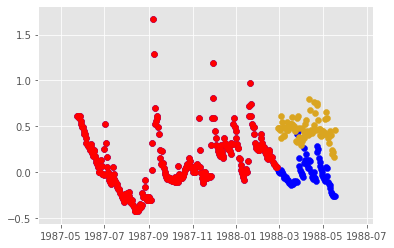

Epoch 0 batch 384 train Loss 0.0340 test Loss -0.0592 with training MSE metric 0.2706 and testing MSE metric 0.1893
NSE per seq:  0.08444836684846421
learning rate is 0.0003000000142492354


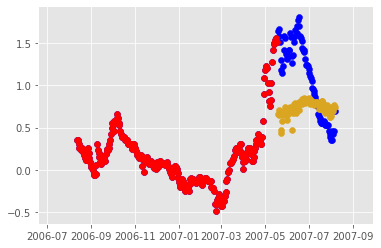

Epoch 0 batch 387 train Loss -0.0590 test Loss -0.0177 with training MSE metric 0.1715 and testing MSE metric 0.2297
NSE per seq:  0.04200167625861009
learning rate is 0.0003000000142492354


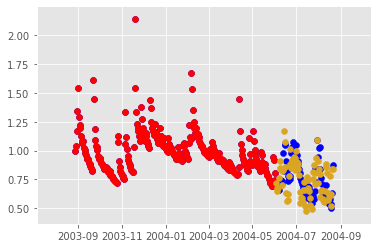

Epoch 0 batch 390 train Loss 0.0003 test Loss -0.0248 with training MSE metric 0.2372 and testing MSE metric 0.2129
NSE per seq:  0.3271353189730737
learning rate is 0.0003000000142492354


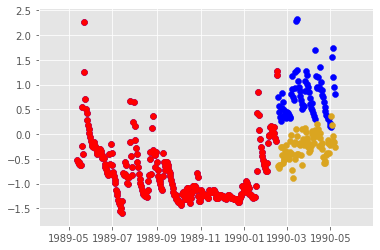

Epoch 0 batch 393 train Loss 0.0311 test Loss 0.0702 with training MSE metric 0.2485 and testing MSE metric 0.3111
NSE per seq:  -0.044320338118106185
learning rate is 0.0003000000142492354


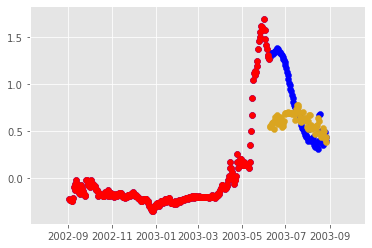

Epoch 0 batch 396 train Loss 0.0106 test Loss -0.1066 with training MSE metric 0.2550 and testing MSE metric 0.1865
NSE per seq:  0.3561946098791706
learning rate is 0.0003000000142492354


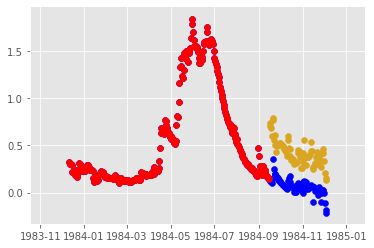

Epoch 0 batch 399 train Loss -0.0422 test Loss 0.0054 with training MSE metric 0.2041 and testing MSE metric 0.2155
NSE per seq:  -0.0312504158622615
learning rate is 0.0003000000142492354


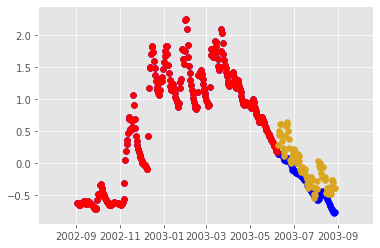

Epoch 0 batch 402 train Loss -0.0312 test Loss 0.0578 with training MSE metric 0.2134 and testing MSE metric 0.3404
NSE per seq:  0.08939228293247507
learning rate is 0.0003000000142492354


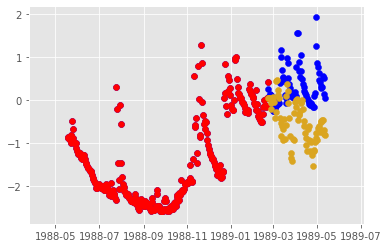

Epoch 0 batch 405 train Loss -0.0071 test Loss -0.0096 with training MSE metric 0.2182 and testing MSE metric 0.2349
NSE per seq:  -0.0770893341698965
learning rate is 0.0003000000142492354


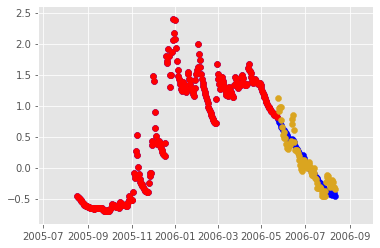

Epoch 0 batch 408 train Loss -0.0154 test Loss -0.0696 with training MSE metric 0.2469 and testing MSE metric 0.1951
NSE per seq:  -0.032134589022540794
learning rate is 0.0003000000142492354


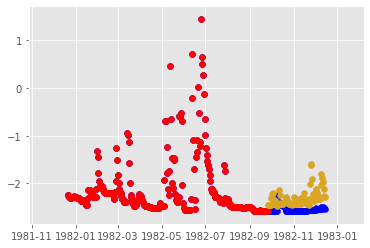

Epoch 0 batch 411 train Loss 0.0167 test Loss 0.0143 with training MSE metric 0.2523 and testing MSE metric 0.2942
NSE per seq:  -3.459586414054989
learning rate is 0.0003000000142492354


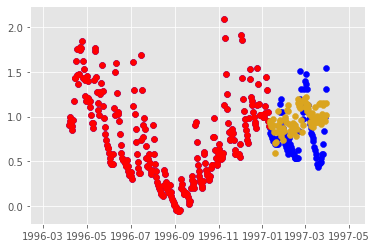

Epoch 0 batch 414 train Loss 0.0356 test Loss -0.0011 with training MSE metric 0.2917 and testing MSE metric 0.2296
NSE per seq:  0.33458441400968053
learning rate is 0.0003000000142492354


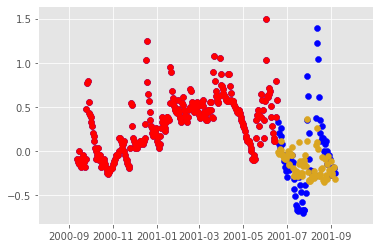

Epoch 0 batch 417 train Loss 0.0630 test Loss -0.0419 with training MSE metric 0.2848 and testing MSE metric 0.2013
NSE per seq:  -1.0772128659672278
learning rate is 0.0003000000142492354


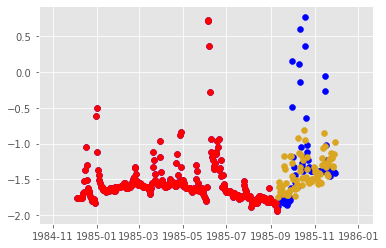

Epoch 0 batch 420 train Loss 0.0252 test Loss -0.0311 with training MSE metric 0.2918 and testing MSE metric 0.1819
NSE per seq:  0.3143908861362119
learning rate is 0.0003000000142492354


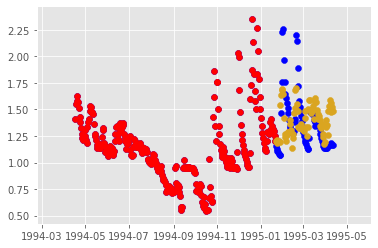

Epoch 0 batch 423 train Loss -0.0076 test Loss -0.0316 with training MSE metric 0.2355 and testing MSE metric 0.2478
NSE per seq:  0.21853126560001152
learning rate is 0.0003000000142492354


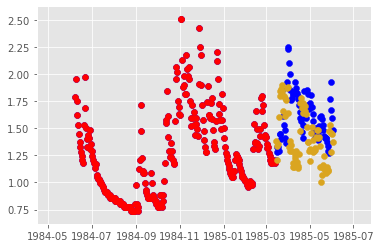

Epoch 0 batch 426 train Loss -0.0120 test Loss -0.0419 with training MSE metric 0.2205 and testing MSE metric 0.2392
NSE per seq:  0.40738388634749845
learning rate is 0.0003000000142492354


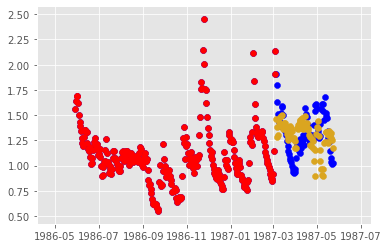

Epoch 0 batch 429 train Loss 0.0453 test Loss -0.0264 with training MSE metric 0.2739 and testing MSE metric 0.2675
NSE per seq:  -2.3495482665591605
learning rate is 0.0003000000142492354


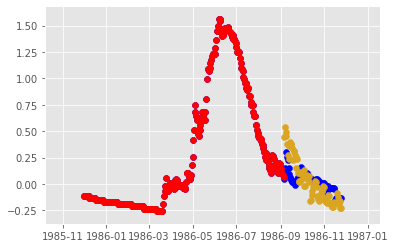

Epoch 0 batch 432 train Loss 0.0079 test Loss 0.0160 with training MSE metric 0.2200 and testing MSE metric 0.2491
NSE per seq:  0.16829004539498593
learning rate is 0.0003000000142492354


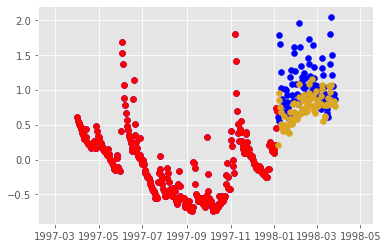

Epoch 0 batch 435 train Loss -0.0542 test Loss -0.0818 with training MSE metric 0.1779 and testing MSE metric 0.1851
NSE per seq:  0.32050935511618894
learning rate is 0.0003000000142492354


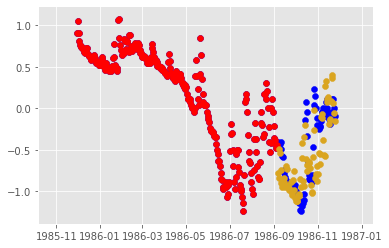

Epoch 0 batch 438 train Loss 0.0099 test Loss -0.1311 with training MSE metric 0.2254 and testing MSE metric 0.1168
NSE per seq:  0.038476706918600306
learning rate is 0.0003000000142492354


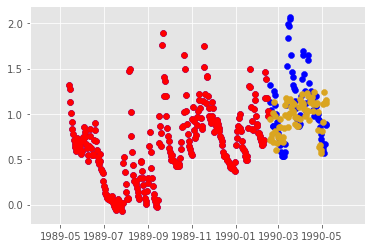

Epoch 0 batch 441 train Loss -0.0368 test Loss -0.0809 with training MSE metric 0.1763 and testing MSE metric 0.1786
NSE per seq:  0.43210623226494294
learning rate is 0.0003000000142492354


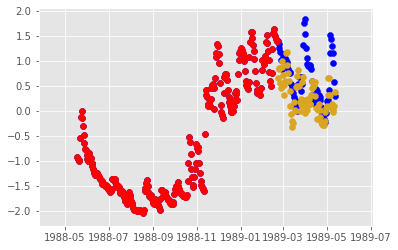

Epoch 0 batch 444 train Loss 0.0544 test Loss -0.0398 with training MSE metric 0.2665 and testing MSE metric 0.2244
NSE per seq:  -1.1701347401631599
learning rate is 0.0003000000142492354


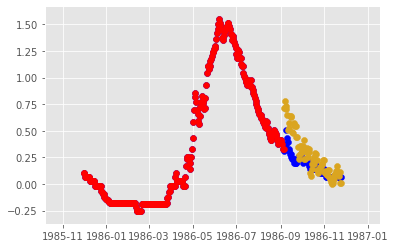

Epoch 0 batch 447 train Loss 0.0202 test Loss -0.0050 with training MSE metric 0.2524 and testing MSE metric 0.2657
NSE per seq:  0.35467270179712934
learning rate is 0.0003000000142492354


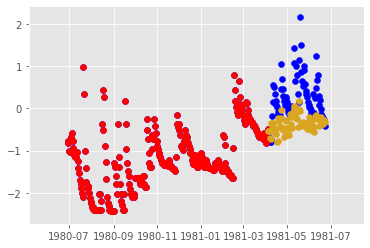

Epoch 0 batch 450 train Loss -0.0478 test Loss -0.0917 with training MSE metric 0.2080 and testing MSE metric 0.1829
NSE per seq:  0.2791483839754152
learning rate is 0.0003000000142492354


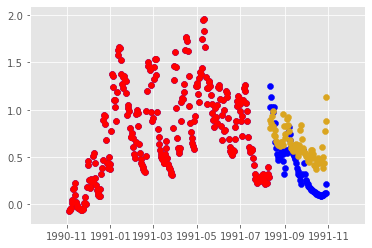

Epoch 0 batch 453 train Loss -0.0315 test Loss -0.1672 with training MSE metric 0.1985 and testing MSE metric 0.1312
NSE per seq:  0.372797837251873
learning rate is 0.0003000000142492354


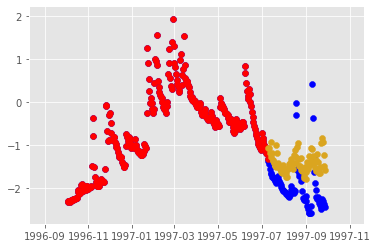

Epoch 0 batch 456 train Loss -0.0210 test Loss 0.0344 with training MSE metric 0.2201 and testing MSE metric 0.2860
NSE per seq:  0.10924305229686562
learning rate is 0.0003000000142492354


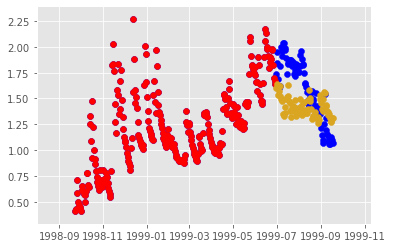

Epoch 0 batch 459 train Loss -0.0461 test Loss -0.0383 with training MSE metric 0.1986 and testing MSE metric 0.1865
NSE per seq:  -0.8362391258252175
learning rate is 0.0003000000142492354


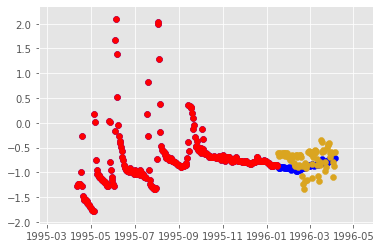

Epoch 0 batch 462 train Loss -0.0034 test Loss -0.1031 with training MSE metric 0.2430 and testing MSE metric 0.1400
NSE per seq:  -0.040175041627453584
learning rate is 0.0003000000142492354


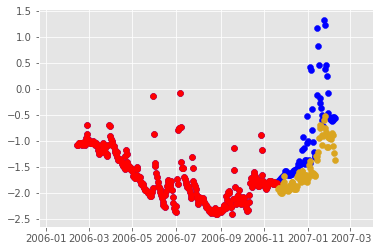

Epoch 0 batch 465 train Loss -0.0062 test Loss 0.0159 with training MSE metric 0.2220 and testing MSE metric 0.2390
NSE per seq:  0.3224973056192605
learning rate is 0.0003000000142492354


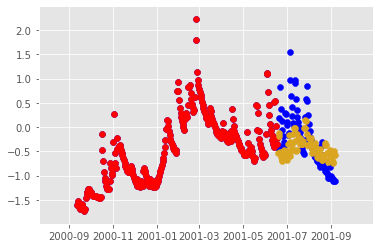

Epoch 0 batch 468 train Loss -0.0148 test Loss -0.1118 with training MSE metric 0.2162 and testing MSE metric 0.1313
NSE per seq:  0.36016456540134933
learning rate is 0.0003000000142492354


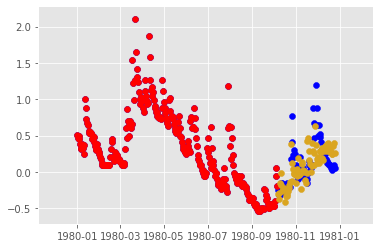

Epoch 0 batch 471 train Loss -0.0025 test Loss -0.0415 with training MSE metric 0.2098 and testing MSE metric 0.2016
NSE per seq:  0.14903642016145435
learning rate is 0.0003000000142492354


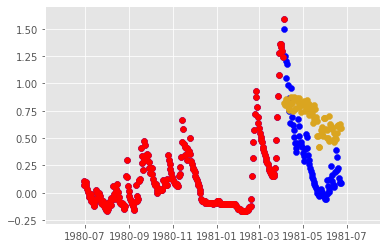

Epoch 0 batch 474 train Loss -0.0218 test Loss -0.0151 with training MSE metric 0.1957 and testing MSE metric 0.2415
NSE per seq:  0.4360907221711131
learning rate is 0.0003000000142492354


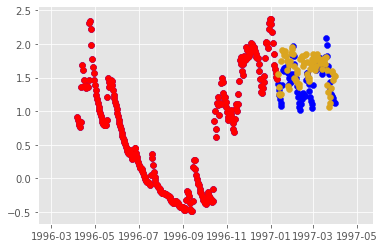

Epoch 0 batch 477 train Loss 0.0275 test Loss -0.0156 with training MSE metric 0.2751 and testing MSE metric 0.2510
NSE per seq:  0.2035792273202273
learning rate is 0.0003000000142492354


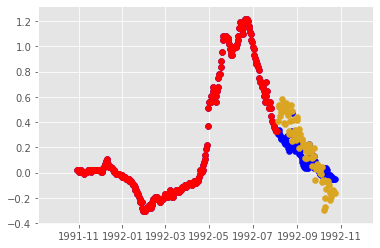

Epoch 0 batch 480 train Loss -0.0269 test Loss -0.0985 with training MSE metric 0.2314 and testing MSE metric 0.1460
NSE per seq:  0.2653417485151951
learning rate is 0.0003000000142492354


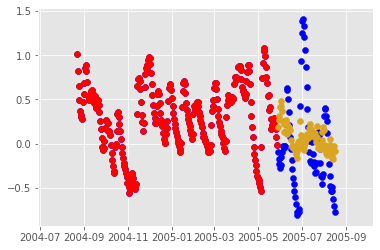

Epoch 0 batch 483 train Loss -0.0058 test Loss -0.0781 with training MSE metric 0.2150 and testing MSE metric 0.1612
NSE per seq:  -0.1685912512518638
learning rate is 0.0003000000142492354


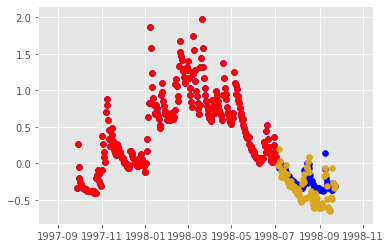

Epoch 0 batch 486 train Loss -0.0089 test Loss -0.1115 with training MSE metric 0.2359 and testing MSE metric 0.1553
NSE per seq:  0.31916468843179335
learning rate is 0.0003000000142492354


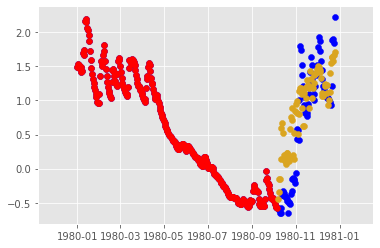

Epoch 0 batch 489 train Loss -0.0362 test Loss -0.0647 with training MSE metric 0.2138 and testing MSE metric 0.1872
NSE per seq:  0.23187028597213938
learning rate is 0.0003000000142492354


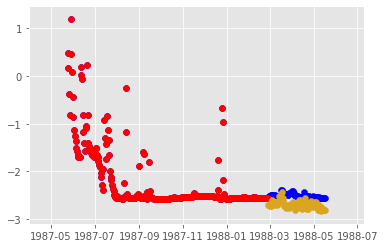

Epoch 0 batch 492 train Loss -0.0361 test Loss -0.0342 with training MSE metric 0.2013 and testing MSE metric 0.2115
NSE per seq:  0.3655995460878525
learning rate is 0.0003000000142492354


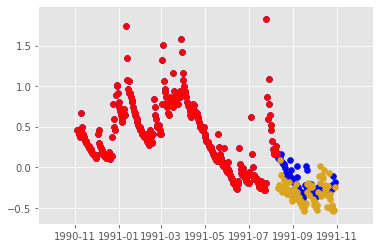

Epoch 0 batch 495 train Loss 0.0670 test Loss -0.0480 with training MSE metric 0.3240 and testing MSE metric 0.2094
NSE per seq:  0.3684457629061366
learning rate is 0.0003000000142492354


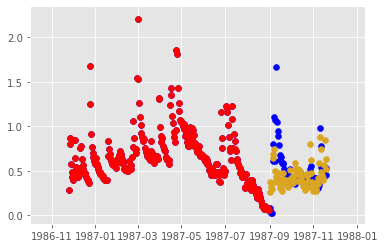

Epoch 0 batch 498 train Loss -0.0566 test Loss -0.1573 with training MSE metric 0.1840 and testing MSE metric 0.1481
NSE per seq:  -18.405503881644304
learning rate is 0.0003000000142492354


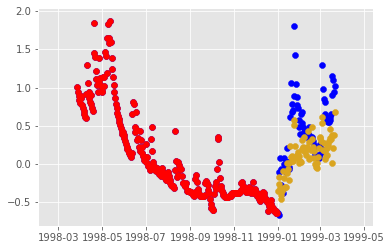

Epoch 0 batch 501 train Loss -0.0124 test Loss -0.0582 with training MSE metric 0.2334 and testing MSE metric 0.1918
NSE per seq:  0.2232071413455023
learning rate is 0.0003000000142492354


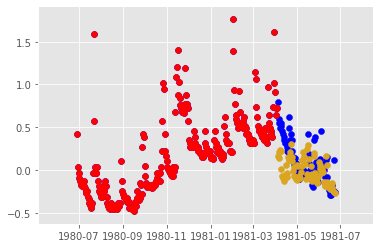

Epoch 0 batch 504 train Loss -0.0467 test Loss 0.0115 with training MSE metric 0.1745 and testing MSE metric 0.2636
NSE per seq:  -0.48564990714526257
learning rate is 0.0003000000142492354


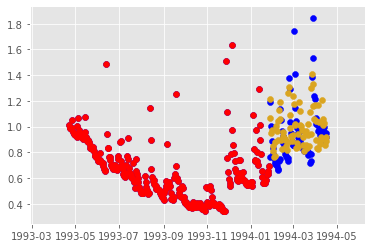

Epoch 0 batch 507 train Loss -0.0426 test Loss -0.0685 with training MSE metric 0.1877 and testing MSE metric 0.2015
NSE per seq:  -0.7057603979709655
learning rate is 0.0003000000142492354


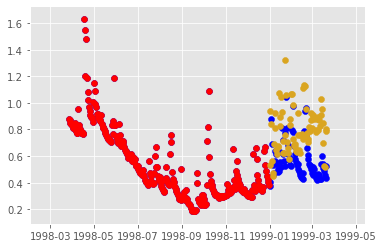

Epoch 0 batch 510 train Loss -0.0372 test Loss -0.1058 with training MSE metric 0.1840 and testing MSE metric 0.1903
NSE per seq:  -0.1436960335719652
learning rate is 0.0003000000142492354


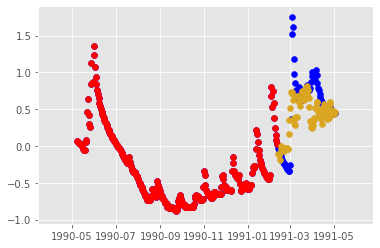

Epoch 0 batch 513 train Loss -0.0281 test Loss -0.0112 with training MSE metric 0.1976 and testing MSE metric 0.2351
NSE per seq:  0.2818015925016066
learning rate is 0.0003000000142492354


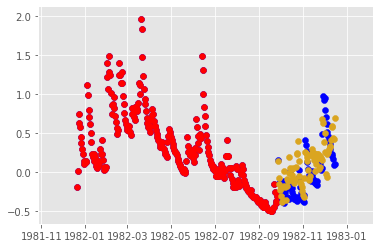

Epoch 0 batch 516 train Loss -0.0038 test Loss -0.0467 with training MSE metric 0.2401 and testing MSE metric 0.2128
NSE per seq:  -0.323252692723626
learning rate is 0.0003000000142492354


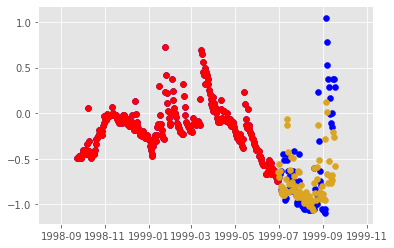

Epoch 0 batch 519 train Loss 0.0056 test Loss -0.0357 with training MSE metric 0.2217 and testing MSE metric 0.2033
NSE per seq:  0.24490026371115087
learning rate is 0.0003000000142492354


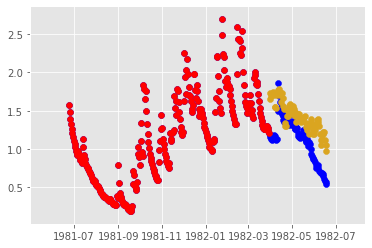

Epoch 0 batch 522 train Loss -0.0372 test Loss -0.0684 with training MSE metric 0.2104 and testing MSE metric 0.2102
NSE per seq:  -1.0397244197619446
learning rate is 0.0003000000142492354


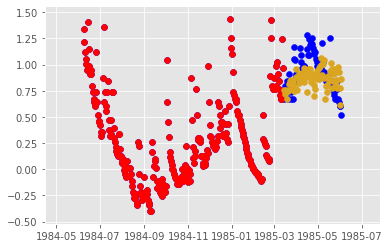

Epoch 0 batch 525 train Loss -0.0514 test Loss -0.0770 with training MSE metric 0.2157 and testing MSE metric 0.2649
NSE per seq:  0.37264730303187477
learning rate is 0.0003000000142492354


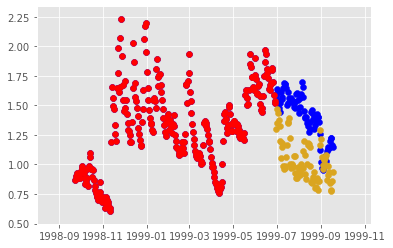

Epoch 0 batch 528 train Loss -0.0618 test Loss -0.0532 with training MSE metric 0.1790 and testing MSE metric 0.2131
NSE per seq:  -0.2931048773622268
learning rate is 0.0003000000142492354


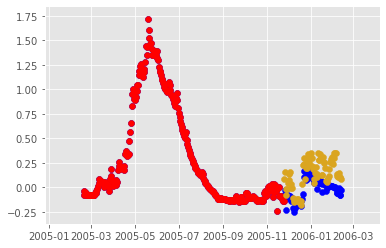

Epoch 0 batch 531 train Loss -0.0489 test Loss -0.0951 with training MSE metric 0.1935 and testing MSE metric 0.1814
NSE per seq:  0.15594734656863754
learning rate is 0.0003000000142492354


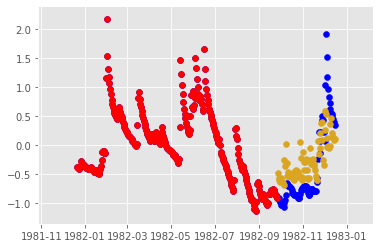

Epoch 0 batch 534 train Loss -0.0477 test Loss -0.0576 with training MSE metric 0.1964 and testing MSE metric 0.2201
NSE per seq:  0.3690835256945042
learning rate is 0.0003000000142492354


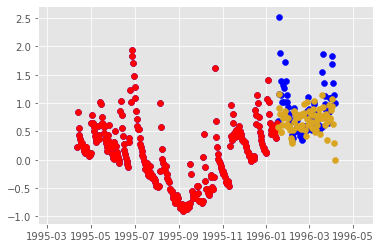

Epoch 0 batch 537 train Loss 0.0396 test Loss -0.0621 with training MSE metric 0.2682 and testing MSE metric 0.1840
NSE per seq:  0.3000856653174568
learning rate is 0.0003000000142492354


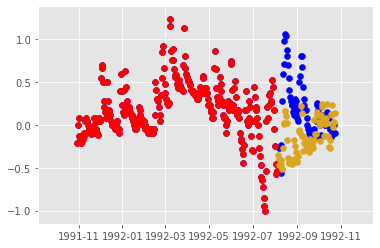

Epoch 0 batch 540 train Loss -0.0350 test Loss -0.0602 with training MSE metric 0.1890 and testing MSE metric 0.2028
NSE per seq:  -0.10067176625374066
learning rate is 0.0003000000142492354


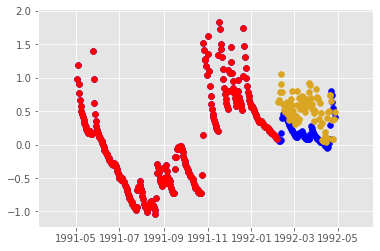

Epoch 0 batch 543 train Loss -0.0052 test Loss -0.0562 with training MSE metric 0.2167 and testing MSE metric 0.1847
NSE per seq:  0.1778372342631901
learning rate is 0.0003000000142492354


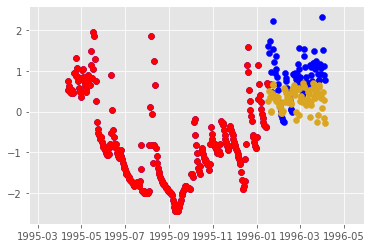

Epoch 0 batch 546 train Loss -0.0180 test Loss -0.0348 with training MSE metric 0.2493 and testing MSE metric 0.1804
NSE per seq:  -0.3105502488403899
learning rate is 0.0003000000142492354


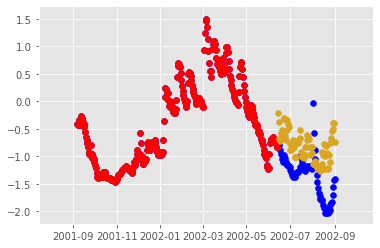

Epoch 0 batch 549 train Loss 0.0013 test Loss -0.0611 with training MSE metric 0.2261 and testing MSE metric 0.1870
NSE per seq:  -0.5786480370505342
learning rate is 0.0003000000142492354


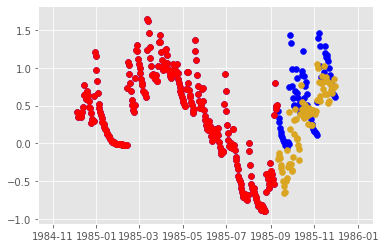

Epoch 0 batch 552 train Loss -0.0255 test Loss -0.0344 with training MSE metric 0.2238 and testing MSE metric 0.1997
NSE per seq:  0.22795944895671252
learning rate is 0.0003000000142492354


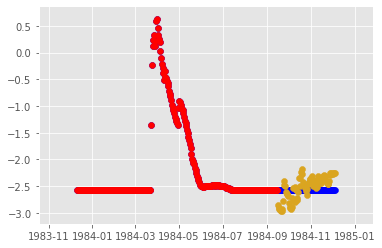

Epoch 0 batch 555 train Loss -0.0451 test Loss -0.1687 with training MSE metric 0.2009 and testing MSE metric 0.1216
NSE per seq:  0.3615408848554814
learning rate is 0.0003000000142492354


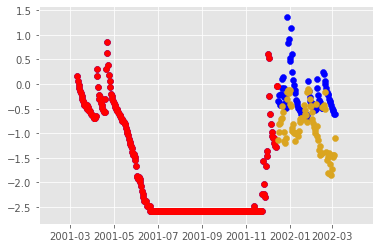

Epoch 0 batch 558 train Loss -0.0547 test Loss -0.0904 with training MSE metric 0.1945 and testing MSE metric 0.2194
NSE per seq:  0.23941522150809558
learning rate is 0.0003000000142492354


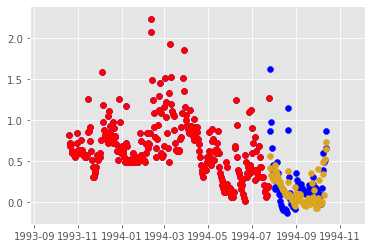

Epoch 0 batch 561 train Loss -0.0422 test Loss -0.1422 with training MSE metric 0.1967 and testing MSE metric 0.1410
NSE per seq:  0.3352903322644736
learning rate is 0.0003000000142492354


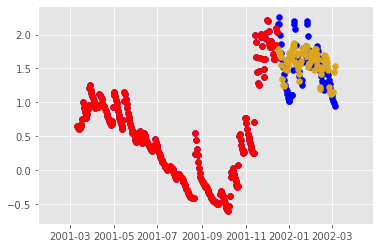

Epoch 0 batch 564 train Loss -0.0719 test Loss -0.1103 with training MSE metric 0.1672 and testing MSE metric 0.1354
NSE per seq:  0.30584231627308284
learning rate is 0.0003000000142492354


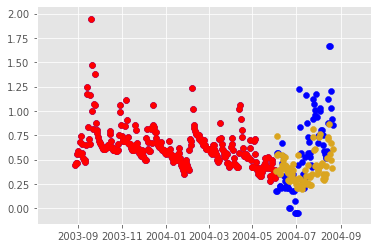

Epoch 0 batch 567 train Loss 0.0239 test Loss -0.0599 with training MSE metric 0.2736 and testing MSE metric 0.1918
NSE per seq:  0.328466928339469
learning rate is 0.0003000000142492354


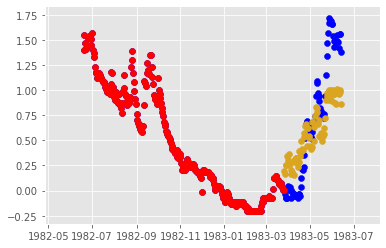

Epoch 0 batch 570 train Loss 0.0261 test Loss -0.0726 with training MSE metric 0.2405 and testing MSE metric 0.1886
NSE per seq:  0.48128727895107526
learning rate is 0.0003000000142492354


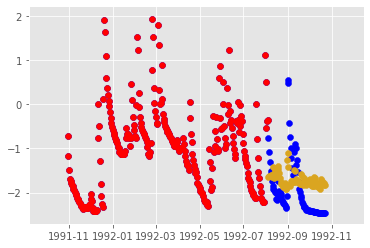

Epoch 0 batch 573 train Loss -0.0201 test Loss -0.0383 with training MSE metric 0.1925 and testing MSE metric 0.2219
NSE per seq:  0.4083249185677444
learning rate is 0.0003000000142492354


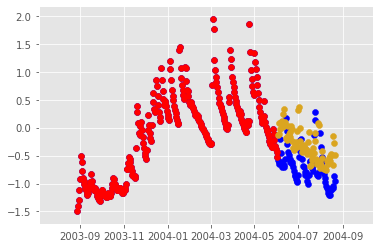

Epoch 0 batch 576 train Loss -0.0274 test Loss -0.0962 with training MSE metric 0.2032 and testing MSE metric 0.1742
NSE per seq:  0.36169994919372533
learning rate is 0.0003000000142492354


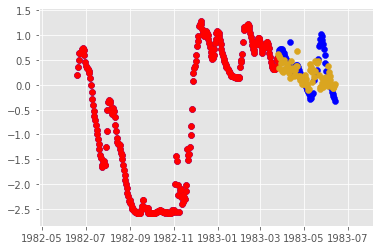

Epoch 0 batch 579 train Loss -0.0503 test Loss -0.0627 with training MSE metric 0.2045 and testing MSE metric 0.2036
NSE per seq:  -0.09623012188319593
learning rate is 0.0003000000142492354


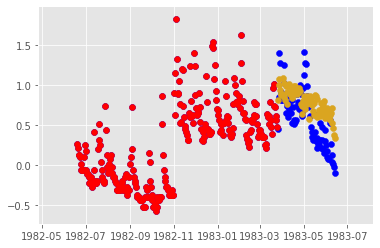

Epoch 0 batch 582 train Loss -0.0440 test Loss -0.1408 with training MSE metric 0.2050 and testing MSE metric 0.1389
NSE per seq:  0.5393233100940219
learning rate is 0.0003000000142492354


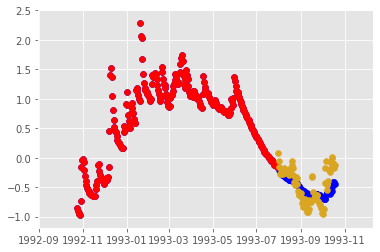

Epoch 0 batch 585 train Loss -0.0500 test Loss -0.1134 with training MSE metric 0.2008 and testing MSE metric 0.1600
NSE per seq:  0.5881924972004793
learning rate is 0.0003000000142492354


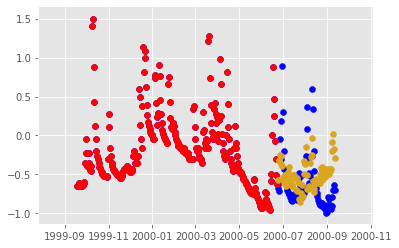

Epoch 0 batch 588 train Loss -0.0186 test Loss -0.0628 with training MSE metric 0.2109 and testing MSE metric 0.1634
NSE per seq:  -0.13695485704161747
learning rate is 0.0003000000142492354


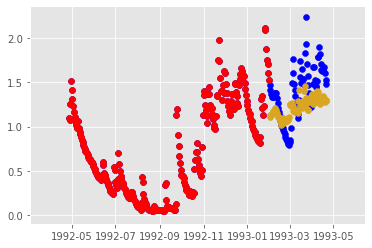

Epoch 0 batch 591 train Loss -0.0499 test Loss -0.0728 with training MSE metric 0.1812 and testing MSE metric 0.1927
NSE per seq:  0.18157479854291106
learning rate is 0.0003000000142492354


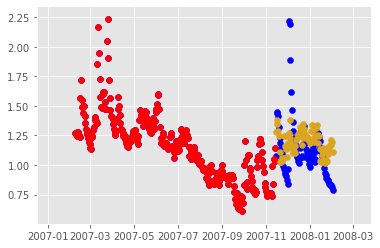

Epoch 0 batch 594 train Loss -0.0790 test Loss -0.0507 with training MSE metric 0.1664 and testing MSE metric 0.2115
NSE per seq:  -0.09754384410437682
learning rate is 0.0003000000142492354


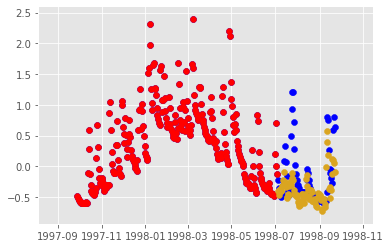

Epoch 0 batch 597 train Loss -0.0382 test Loss -0.0949 with training MSE metric 0.2058 and testing MSE metric 0.1699
NSE per seq:  0.19143673615847645
learning rate is 0.0003000000142492354


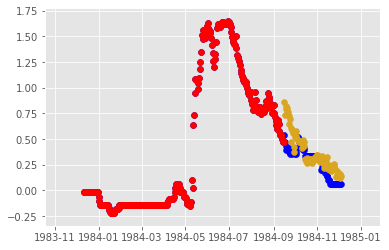

Epoch 0 batch 600 train Loss -0.0696 test Loss -0.1188 with training MSE metric 0.1904 and testing MSE metric 0.1450
NSE per seq:  -0.2788519410456313
learning rate is 0.0003000000142492354


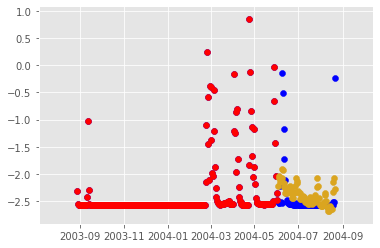

Epoch 0 batch 603 train Loss -0.0314 test Loss -0.0998 with training MSE metric 0.1837 and testing MSE metric 0.1631
NSE per seq:  0.3664592013803922
learning rate is 0.0003000000142492354


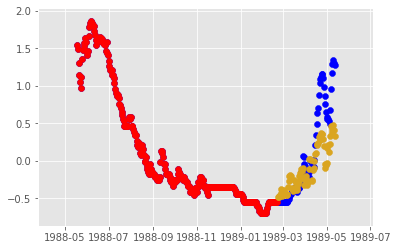

Epoch 0 batch 606 train Loss -0.0724 test Loss -0.0873 with training MSE metric 0.1939 and testing MSE metric 0.1698
NSE per seq:  0.3834291011273556
learning rate is 0.0003000000142492354


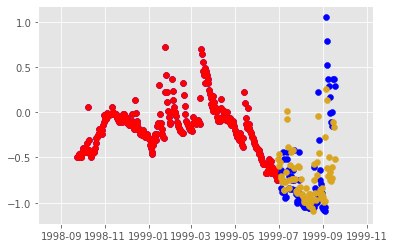

Epoch 0 batch 609 train Loss -0.0723 test Loss -0.0607 with training MSE metric 0.1628 and testing MSE metric 0.1782
NSE per seq:  0.37675173388732414
learning rate is 0.0003000000142492354


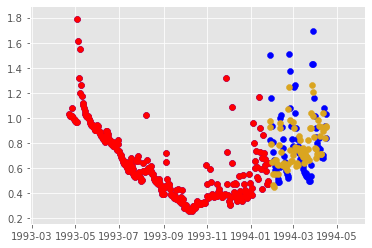

Epoch 0 batch 612 train Loss -0.0346 test Loss -0.0502 with training MSE metric 0.2291 and testing MSE metric 0.2079
NSE per seq:  0.21135776139239107
learning rate is 0.0003000000142492354


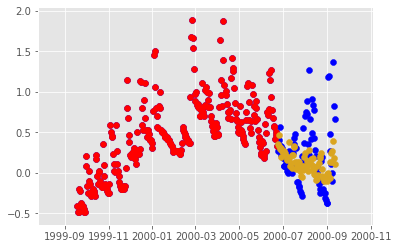

Epoch 0 batch 615 train Loss -0.0990 test Loss -0.0859 with training MSE metric 0.1714 and testing MSE metric 0.1730
NSE per seq:  -0.5476216873184065
learning rate is 0.0003000000142492354


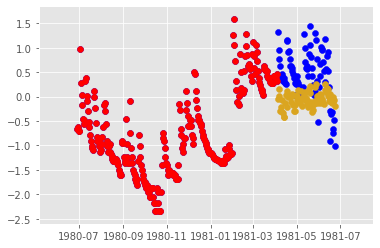

Epoch 0 batch 618 train Loss -0.0800 test Loss -0.1464 with training MSE metric 0.1748 and testing MSE metric 0.1307
NSE per seq:  0.46642423785258413
learning rate is 0.0003000000142492354


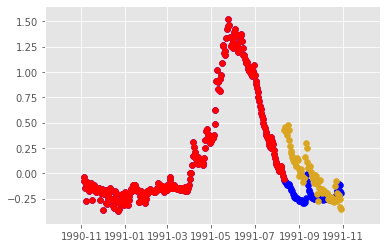

Epoch 0 batch 621 train Loss -0.0697 test Loss -0.0799 with training MSE metric 0.1874 and testing MSE metric 0.2408
NSE per seq:  0.3984034288252115
learning rate is 0.0003000000142492354


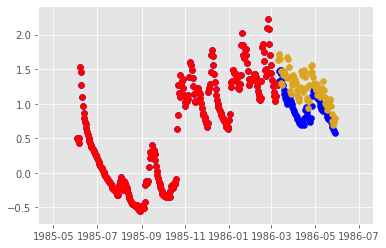

Epoch 0 batch 624 train Loss -0.0222 test Loss -0.1305 with training MSE metric 0.2429 and testing MSE metric 0.1540
NSE per seq:  0.32036010838396534
learning rate is 0.0003000000142492354


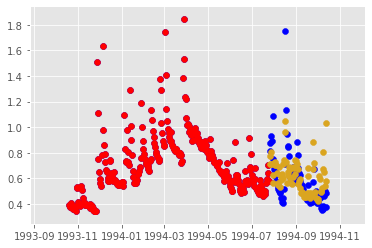

Epoch 0 batch 627 train Loss -0.0587 test Loss -0.1578 with training MSE metric 0.1774 and testing MSE metric 0.1332
NSE per seq:  0.48656041321537813
learning rate is 0.0003000000142492354


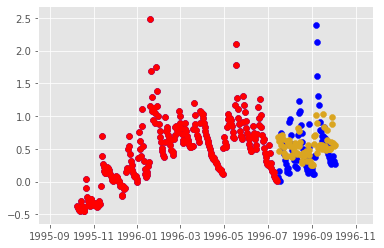

Epoch 0 batch 630 train Loss -0.0169 test Loss -0.0888 with training MSE metric 0.2224 and testing MSE metric 0.2232
NSE per seq:  -0.45087585333646096
learning rate is 0.0003000000142492354


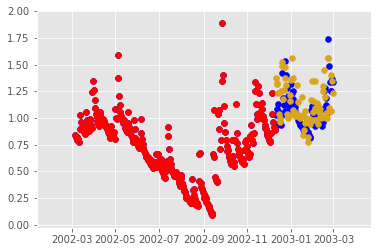

Epoch 0 batch 633 train Loss -0.0626 test Loss -0.1254 with training MSE metric 0.1640 and testing MSE metric 0.1236
NSE per seq:  0.4897140253614139
learning rate is 0.0003000000142492354


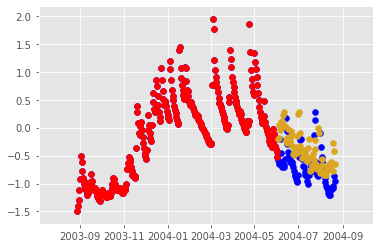

Epoch 0 batch 636 train Loss -0.0619 test Loss -0.1347 with training MSE metric 0.1698 and testing MSE metric 0.1288
NSE per seq:  -0.3429385597084166
learning rate is 0.0003000000142492354


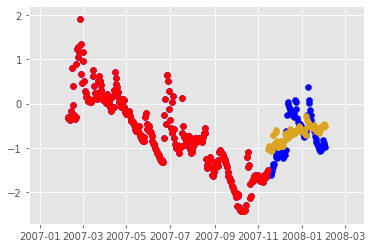

Epoch 0 batch 639 train Loss -0.0821 test Loss -0.0739 with training MSE metric 0.1805 and testing MSE metric 0.2209
NSE per seq:  0.3244048213988151
learning rate is 0.0003000000142492354


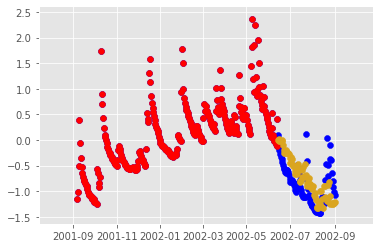

Epoch 0 batch 642 train Loss -0.0440 test Loss -0.0978 with training MSE metric 0.2106 and testing MSE metric 0.1765
NSE per seq:  0.28183594284023183
learning rate is 0.0003000000142492354


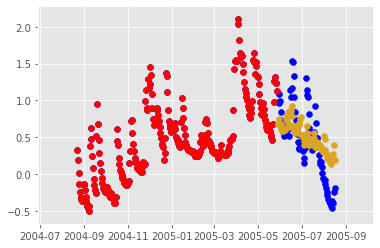

Epoch 0 batch 645 train Loss -0.1280 test Loss -0.1399 with training MSE metric 0.1475 and testing MSE metric 0.1604
NSE per seq:  0.2571213515801838
learning rate is 0.0003000000142492354


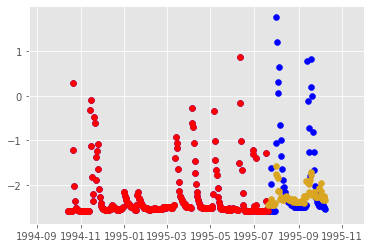

Epoch 0 batch 648 train Loss -0.0842 test Loss -0.1224 with training MSE metric 0.1742 and testing MSE metric 0.1799
NSE per seq:  0.3399584354418792
learning rate is 0.0003000000142492354


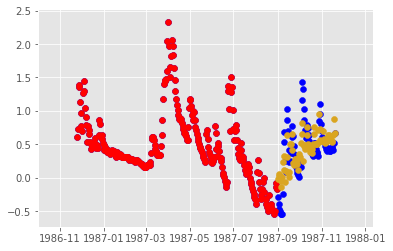

Epoch 0 batch 651 train Loss -0.1172 test Loss -0.1495 with training MSE metric 0.1410 and testing MSE metric 0.1406
NSE per seq:  0.4220707231698318
learning rate is 0.0003000000142492354


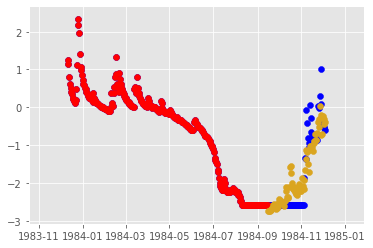

Epoch 0 batch 654 train Loss -0.0205 test Loss -0.0148 with training MSE metric 0.2094 and testing MSE metric 0.2898
NSE per seq:  0.45111027698260414
learning rate is 0.0003000000142492354


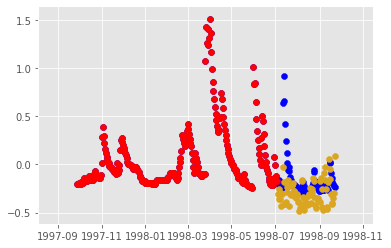

Epoch 0 batch 657 train Loss -0.1213 test Loss -0.1698 with training MSE metric 0.1566 and testing MSE metric 0.1301
NSE per seq:  0.5946987471299221
learning rate is 0.0003000000142492354


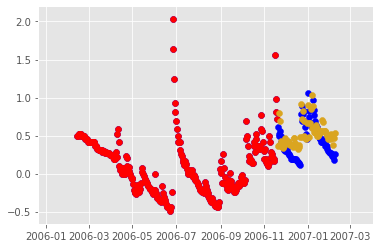

Epoch 0 batch 660 train Loss -0.0305 test Loss -0.1278 with training MSE metric 0.2003 and testing MSE metric 0.1519
NSE per seq:  0.5447563334901584
learning rate is 0.0003000000142492354


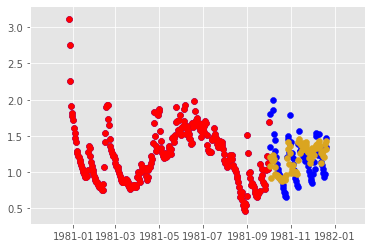

Epoch 0 batch 663 train Loss -0.1257 test Loss -0.1586 with training MSE metric 0.1283 and testing MSE metric 0.1037
NSE per seq:  0.3581503979371571
learning rate is 0.0003000000142492354


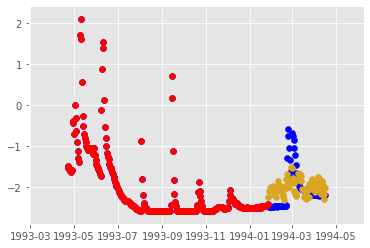

Epoch 0 batch 666 train Loss -0.0828 test Loss -0.0585 with training MSE metric 0.1675 and testing MSE metric 0.2325
NSE per seq:  0.16489008820205828
learning rate is 0.0003000000142492354


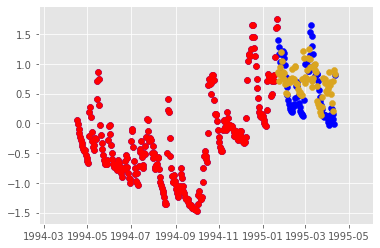

Epoch 0 batch 669 train Loss 0.0107 test Loss -0.1275 with training MSE metric 0.2396 and testing MSE metric 0.1342
NSE per seq:  0.039818931193956325
learning rate is 0.0003000000142492354


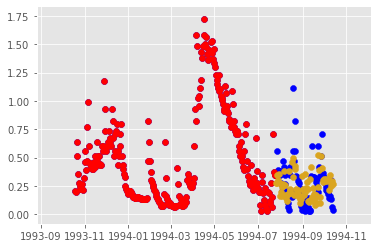

Epoch 0 batch 672 train Loss -0.1229 test Loss -0.1540 with training MSE metric 0.1322 and testing MSE metric 0.1408
NSE per seq:  0.5747771051363687
learning rate is 0.0003000000142492354


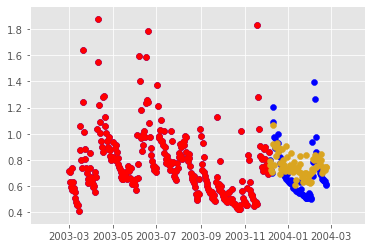

Epoch 0 batch 675 train Loss -0.1374 test Loss -0.1698 with training MSE metric 0.1441 and testing MSE metric 0.1336
NSE per seq:  0.6479905122586138
learning rate is 0.0003000000142492354


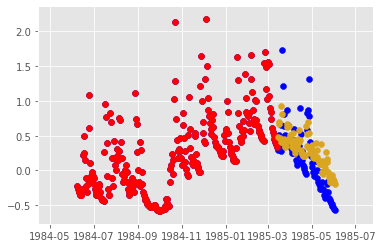

Epoch 0 batch 678 train Loss -0.0593 test Loss -0.1406 with training MSE metric 0.1931 and testing MSE metric 0.1360
NSE per seq:  0.4417045532225742
learning rate is 0.0003000000142492354


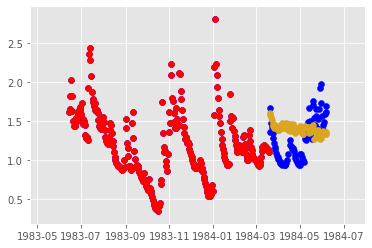

Epoch 0 batch 681 train Loss -0.0763 test Loss -0.1213 with training MSE metric 0.1816 and testing MSE metric 0.1411
NSE per seq:  0.1831106778133092
learning rate is 0.0003000000142492354


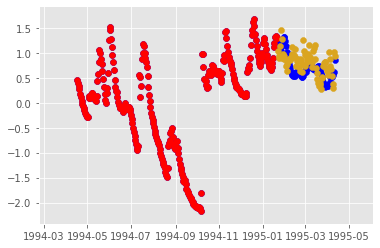

Epoch 0 batch 684 train Loss -0.0422 test Loss -0.1500 with training MSE metric 0.1942 and testing MSE metric 0.1206
NSE per seq:  0.36813292238392736
learning rate is 0.0003000000142492354


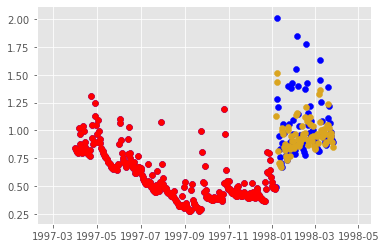

Epoch 0 batch 687 train Loss -0.0329 test Loss -0.1325 with training MSE metric 0.2118 and testing MSE metric 0.1982
NSE per seq:  0.4010977888973971
learning rate is 0.0003000000142492354


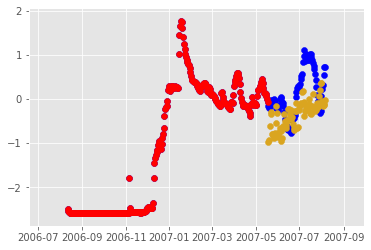

Epoch 0 batch 690 train Loss -0.0934 test Loss -0.0677 with training MSE metric 0.1421 and testing MSE metric 0.1781
NSE per seq:  0.38256961619419383
learning rate is 0.0003000000142492354


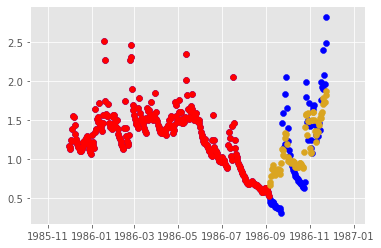

Epoch 0 batch 693 train Loss -0.1480 test Loss -0.1385 with training MSE metric 0.1271 and testing MSE metric 0.1459
NSE per seq:  0.1690273838488558
learning rate is 0.0003000000142492354


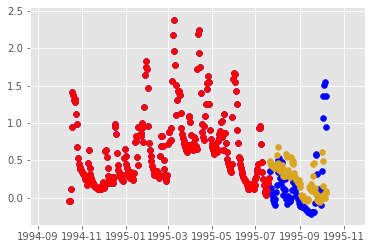

Epoch 0 batch 696 train Loss -0.1013 test Loss -0.1681 with training MSE metric 0.1624 and testing MSE metric 0.1347
NSE per seq:  0.5373611837973131
learning rate is 0.0003000000142492354


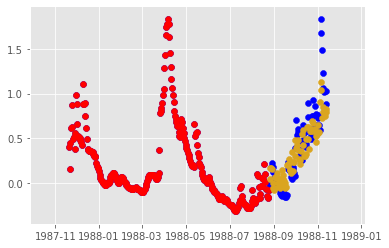

Epoch 0 batch 699 train Loss -0.1229 test Loss -0.1680 with training MSE metric 0.1493 and testing MSE metric 0.1283
NSE per seq:  0.2596958344333936
learning rate is 0.0003000000142492354


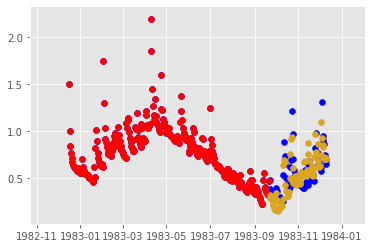

Epoch 0 batch 702 train Loss -0.1433 test Loss -0.0727 with training MSE metric 0.1288 and testing MSE metric 0.2376
NSE per seq:  0.2908716258539903
learning rate is 0.0003000000142492354


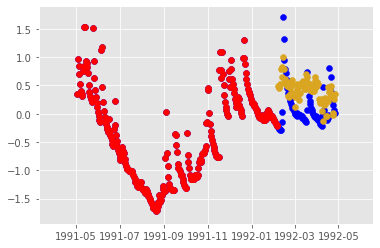

Epoch 0 batch 705 train Loss -0.0657 test Loss -0.0996 with training MSE metric 0.1631 and testing MSE metric 0.1517
NSE per seq:  0.5090863703805363
learning rate is 0.0003000000142492354


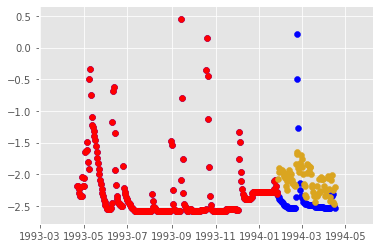

Epoch 0 batch 708 train Loss -0.1136 test Loss -0.1219 with training MSE metric 0.1733 and testing MSE metric 0.1660
NSE per seq:  0.4653657090302494
learning rate is 0.0003000000142492354


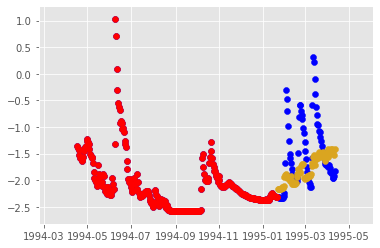

Epoch 0 batch 711 train Loss -0.1309 test Loss -0.0903 with training MSE metric 0.1333 and testing MSE metric 0.1872
NSE per seq:  0.4778446332572694
learning rate is 0.0003000000142492354


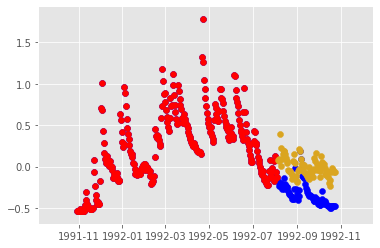

Epoch 0 batch 714 train Loss -0.0846 test Loss -0.1305 with training MSE metric 0.1806 and testing MSE metric 0.1732
NSE per seq:  0.5242640401957922
learning rate is 0.0003000000142492354


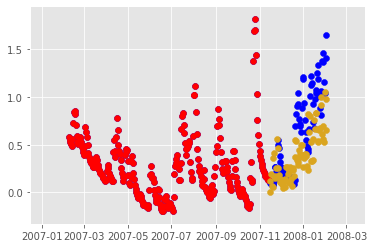

Epoch 0 batch 717 train Loss -0.1081 test Loss -0.1580 with training MSE metric 0.1571 and testing MSE metric 0.1563
NSE per seq:  0.529083379388707
learning rate is 0.0003000000142492354


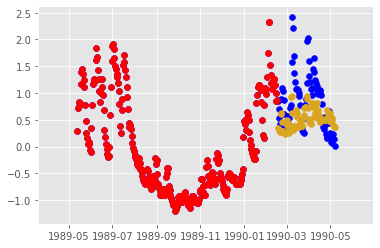

Epoch 0 batch 720 train Loss -0.1722 test Loss -0.1066 with training MSE metric 0.1237 and testing MSE metric 0.1481
NSE per seq:  0.5663319225373578
learning rate is 0.0003000000142492354


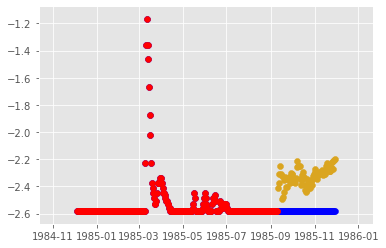

Epoch 0 batch 723 train Loss -0.1215 test Loss -0.1663 with training MSE metric 0.1431 and testing MSE metric 0.1246
NSE per seq:  -1.110298999725038
learning rate is 0.0003000000142492354


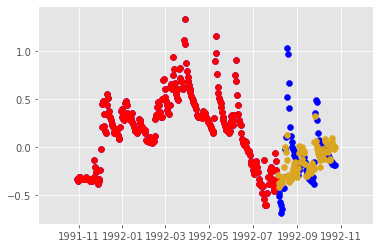

Epoch 0 batch 726 train Loss -0.1369 test Loss -0.1616 with training MSE metric 0.1338 and testing MSE metric 0.1273
NSE per seq:  0.48265810356204963
learning rate is 0.0003000000142492354


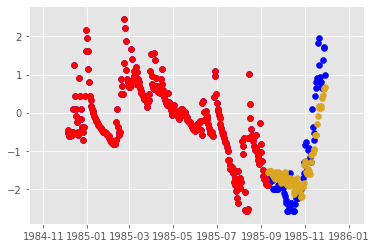

Epoch 0 batch 729 train Loss -0.1190 test Loss -0.1550 with training MSE metric 0.1385 and testing MSE metric 0.1303
NSE per seq:  0.2593443841876757
learning rate is 0.0003000000142492354


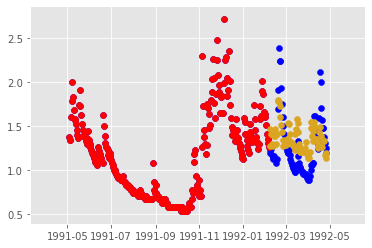

Epoch 0 batch 732 train Loss -0.0348 test Loss -0.0659 with training MSE metric 0.2123 and testing MSE metric 0.1908
NSE per seq:  0.5218007570807579
learning rate is 0.0003000000142492354


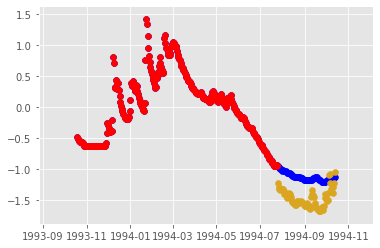

Epoch 0 batch 735 train Loss -0.1346 test Loss -0.1536 with training MSE metric 0.1425 and testing MSE metric 0.1498
NSE per seq:  0.5335926048368591
learning rate is 0.0003000000142492354


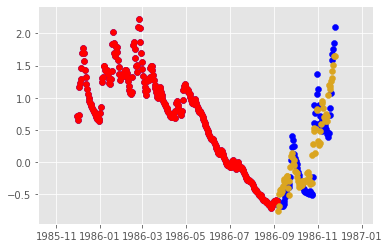

Epoch 0 batch 738 train Loss -0.1453 test Loss -0.2043 with training MSE metric 0.1292 and testing MSE metric 0.1125
NSE per seq:  0.239941223182883
learning rate is 0.0003000000142492354


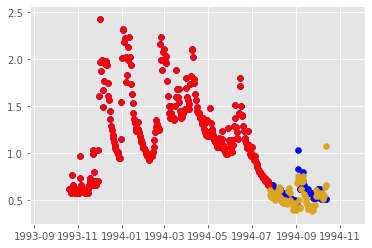

Epoch 0 batch 741 train Loss -0.1197 test Loss -0.1094 with training MSE metric 0.1323 and testing MSE metric 0.1828
NSE per seq:  0.3817499028949731
learning rate is 0.0003000000142492354


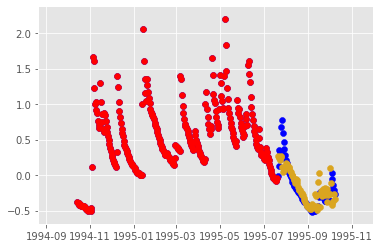

Epoch 0 batch 744 train Loss -0.0249 test Loss -0.0892 with training MSE metric 0.1917 and testing MSE metric 0.1730
NSE per seq:  0.3620723201020456
learning rate is 0.0003000000142492354


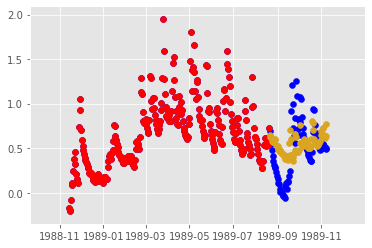

Epoch 0 batch 747 train Loss -0.1106 test Loss -0.0518 with training MSE metric 0.1435 and testing MSE metric 0.2222
NSE per seq:  0.13457164990794818
learning rate is 0.0003000000142492354


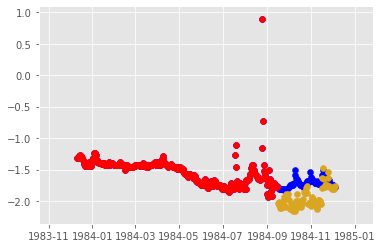

Epoch 0 batch 750 train Loss -0.0820 test Loss -0.1513 with training MSE metric 0.2065 and testing MSE metric 0.1703
NSE per seq:  0.5539684408031945
learning rate is 0.0003000000142492354


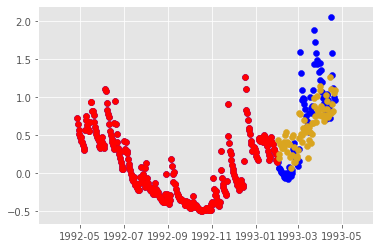

Epoch 0 batch 753 train Loss -0.1313 test Loss -0.1554 with training MSE metric 0.1609 and testing MSE metric 0.1477
NSE per seq:  0.5636459557074662
learning rate is 0.0003000000142492354


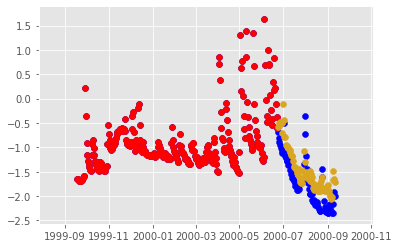

Epoch 0 batch 756 train Loss -0.1519 test Loss -0.1708 with training MSE metric 0.1556 and testing MSE metric 0.1179
NSE per seq:  0.47571829014631484
learning rate is 0.0003000000142492354


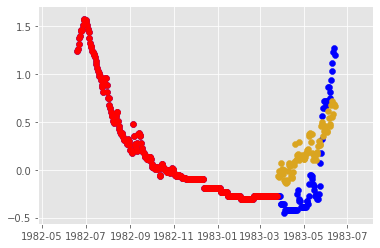

Epoch 0 batch 759 train Loss -0.1094 test Loss -0.1247 with training MSE metric 0.1722 and testing MSE metric 0.1924
NSE per seq:  0.21851801335576898
learning rate is 0.0003000000142492354


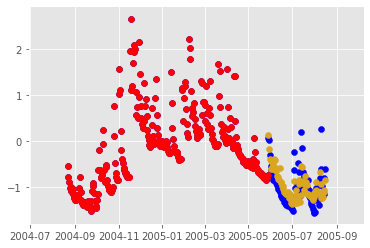

Epoch 0 batch 762 train Loss -0.1425 test Loss -0.0791 with training MSE metric 0.1374 and testing MSE metric 0.1768
NSE per seq:  0.4001644143184898
learning rate is 0.0003000000142492354


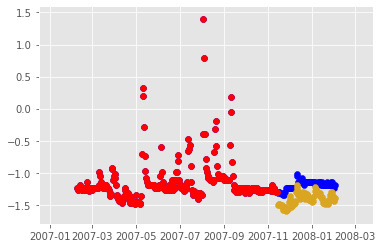

Epoch 0 batch 765 train Loss -0.1429 test Loss -0.1314 with training MSE metric 0.1417 and testing MSE metric 0.1762
NSE per seq:  -0.264893626347519
learning rate is 0.0003000000142492354


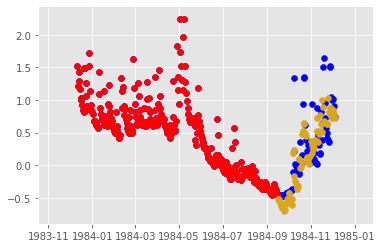

Epoch 0 batch 768 train Loss -0.1389 test Loss -0.2017 with training MSE metric 0.1433 and testing MSE metric 0.1088
NSE per seq:  0.6031827370435826
learning rate is 0.0003000000142492354


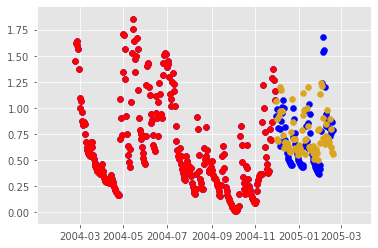

Epoch 0 batch 771 train Loss -0.1588 test Loss -0.1816 with training MSE metric 0.1383 and testing MSE metric 0.1344
NSE per seq:  0.4908897685029087
learning rate is 0.0003000000142492354


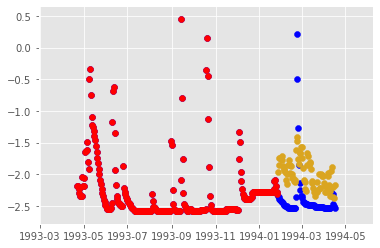

Epoch 0 batch 774 train Loss -0.1383 test Loss -0.1454 with training MSE metric 0.1459 and testing MSE metric 0.1375
NSE per seq:  0.39017990698142824
learning rate is 0.0003000000142492354


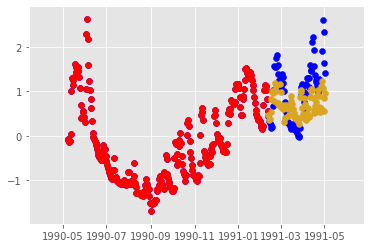

Epoch 0 batch 777 train Loss -0.1773 test Loss -0.1469 with training MSE metric 0.1118 and testing MSE metric 0.1249
NSE per seq:  -0.392437397170391
learning rate is 0.0003000000142492354


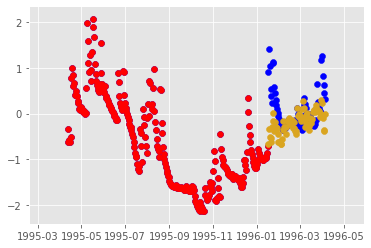

Epoch 0 batch 780 train Loss -0.1439 test Loss -0.1300 with training MSE metric 0.1437 and testing MSE metric 0.1690
NSE per seq:  0.45000001570521886
learning rate is 0.0003000000142492354


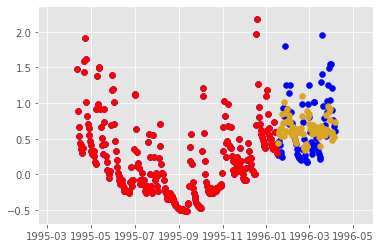

Epoch 0 batch 783 train Loss -0.1170 test Loss -0.1305 with training MSE metric 0.1588 and testing MSE metric 0.1221
NSE per seq:  0.35636639731216724
learning rate is 0.0003000000142492354


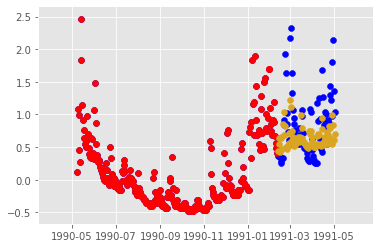

Epoch 0 batch 786 train Loss -0.1140 test Loss -0.1202 with training MSE metric 0.1737 and testing MSE metric 0.1583
NSE per seq:  0.5974042659539649
learning rate is 0.0003000000142492354


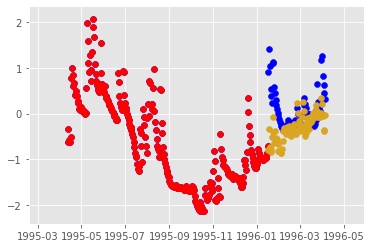

Epoch 0 batch 789 train Loss -0.0830 test Loss -0.1925 with training MSE metric 0.1697 and testing MSE metric 0.1769
NSE per seq:  0.5236709480022522
learning rate is 0.0003000000142492354


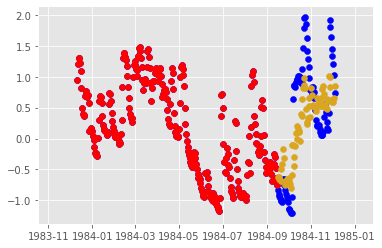

Epoch 0 batch 792 train Loss -0.1279 test Loss -0.1807 with training MSE metric 0.1590 and testing MSE metric 0.1291
NSE per seq:  0.5032782151749212
learning rate is 0.0003000000142492354


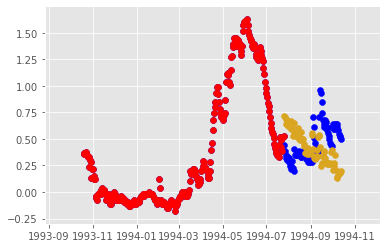

Epoch 0 batch 795 train Loss -0.0575 test Loss -0.1705 with training MSE metric 0.1931 and testing MSE metric 0.1473
NSE per seq:  0.3839628641236693
learning rate is 0.0003000000142492354


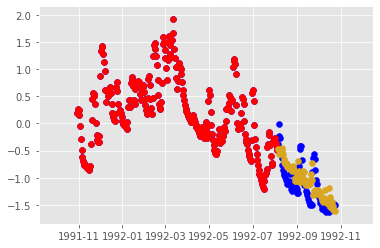

Epoch 0 batch 798 train Loss -0.0890 test Loss -0.1250 with training MSE metric 0.1687 and testing MSE metric 0.1295
NSE per seq:  0.45442450155230796
learning rate is 0.0003000000142492354


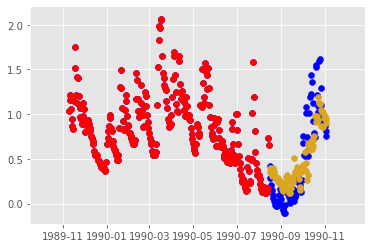

Epoch 0 batch 801 train Loss -0.0913 test Loss -0.2031 with training MSE metric 0.1751 and testing MSE metric 0.1007
NSE per seq:  0.13582175335822602
learning rate is 0.0003000000142492354


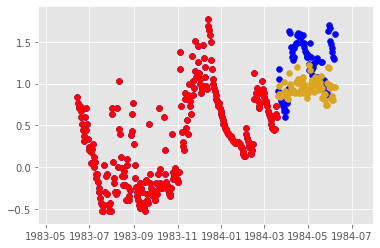

Epoch 0 batch 804 train Loss -0.1273 test Loss -0.1959 with training MSE metric 0.1359 and testing MSE metric 0.1324
NSE per seq:  0.5729886210309414
learning rate is 0.0003000000142492354


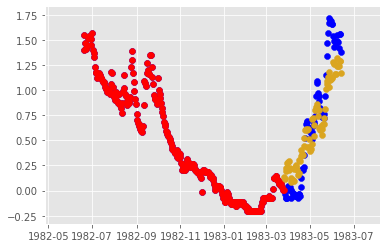

Epoch 0 batch 807 train Loss -0.1192 test Loss -0.1577 with training MSE metric 0.1482 and testing MSE metric 0.1242
NSE per seq:  0.556601841244903
learning rate is 0.0003000000142492354


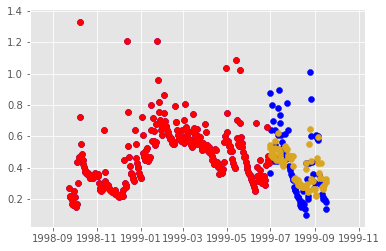

Epoch 0 batch 810 train Loss -0.2030 test Loss -0.2943 with training MSE metric 0.1211 and testing MSE metric 0.0717
NSE per seq:  0.49685469451138997
learning rate is 0.0003000000142492354


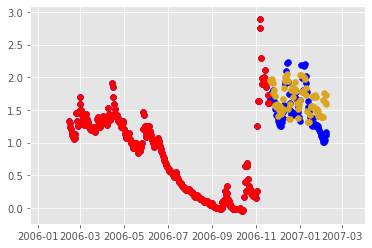

Epoch 0 batch 813 train Loss -0.1335 test Loss -0.2076 with training MSE metric 0.1422 and testing MSE metric 0.1214
NSE per seq:  0.589235473171825
learning rate is 0.0003000000142492354


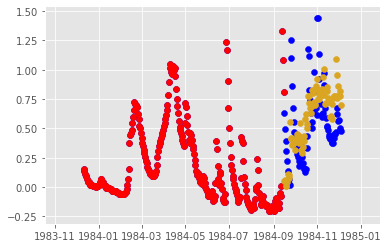

Epoch 0 batch 816 train Loss -0.0954 test Loss -0.2297 with training MSE metric 0.1663 and testing MSE metric 0.1104
NSE per seq:  0.4589335657463605
learning rate is 0.0003000000142492354


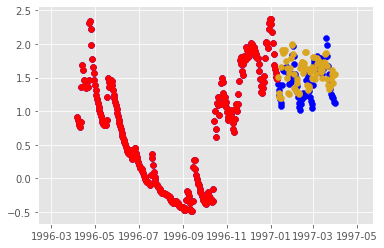

Epoch 0 batch 819 train Loss -0.1439 test Loss -0.1526 with training MSE metric 0.1476 and testing MSE metric 0.1624
NSE per seq:  0.5728325874423761
learning rate is 0.0003000000142492354


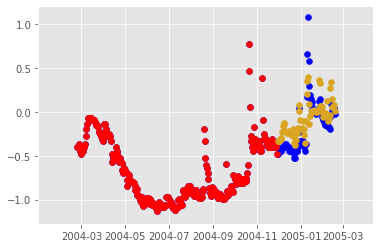

Epoch 0 batch 822 train Loss -0.0560 test Loss -0.2025 with training MSE metric 0.1596 and testing MSE metric 0.1073
NSE per seq:  0.5302293203868228
learning rate is 0.0003000000142492354


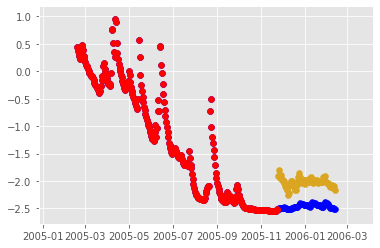

Epoch 0 batch 825 train Loss -0.0940 test Loss -0.2154 with training MSE metric 0.1417 and testing MSE metric 0.0906
NSE per seq:  0.6564024985572099
learning rate is 0.0003000000142492354


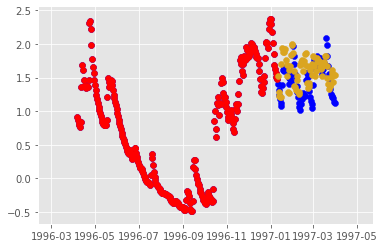

Epoch 0 batch 828 train Loss -0.1561 test Loss -0.2132 with training MSE metric 0.1352 and testing MSE metric 0.0869
NSE per seq:  0.46379127000080955
learning rate is 0.0003000000142492354


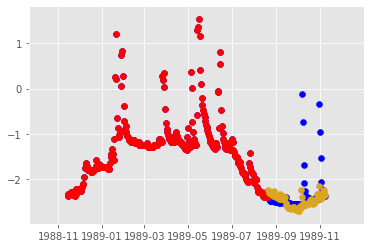

Epoch 0 batch 831 train Loss -0.1359 test Loss -0.0625 with training MSE metric 0.1377 and testing MSE metric 0.1736
NSE per seq:  0.2850136477241943
learning rate is 0.0003000000142492354


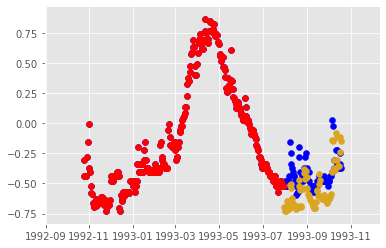

Epoch 0 batch 834 train Loss -0.1163 test Loss -0.1982 with training MSE metric 0.1571 and testing MSE metric 0.1374
NSE per seq:  0.6284714329246293
learning rate is 0.0003000000142492354


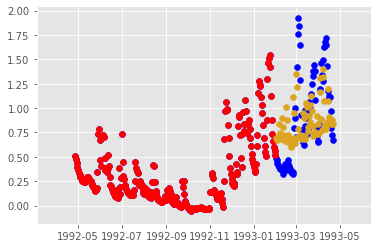

Epoch 0 batch 837 train Loss -0.1911 test Loss -0.3028 with training MSE metric 0.1125 and testing MSE metric 0.0651
NSE per seq:  0.6149968135959414
learning rate is 0.0003000000142492354


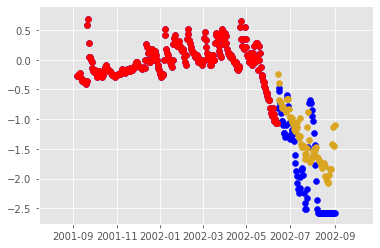

Epoch 0 batch 840 train Loss -0.1266 test Loss -0.1444 with training MSE metric 0.1329 and testing MSE metric 0.1498
NSE per seq:  0.5342023624471353
learning rate is 0.0003000000142492354


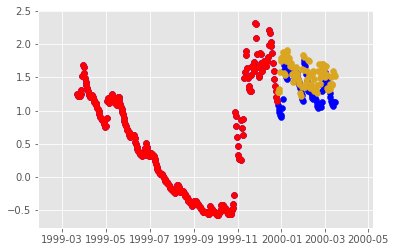

Epoch 0 batch 843 train Loss -0.1680 test Loss -0.1031 with training MSE metric 0.1395 and testing MSE metric 0.1848
NSE per seq:  0.028167210100772014
learning rate is 0.0003000000142492354


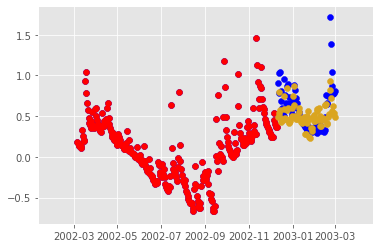

Epoch 0 batch 846 train Loss -0.1568 test Loss -0.2300 with training MSE metric 0.1319 and testing MSE metric 0.1347
NSE per seq:  0.5704634656263776
learning rate is 0.0003000000142492354


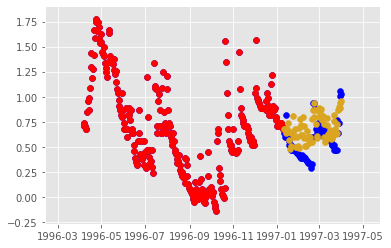

Epoch 0 batch 849 train Loss -0.1404 test Loss -0.1555 with training MSE metric 0.1330 and testing MSE metric 0.1450
NSE per seq:  -1.725382184413316
learning rate is 0.0003000000142492354


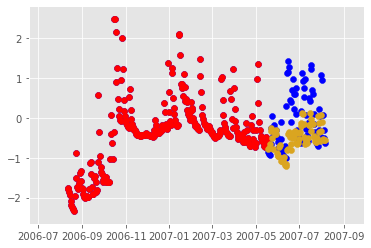

Epoch 0 batch 852 train Loss -0.1706 test Loss -0.1552 with training MSE metric 0.1215 and testing MSE metric 0.1419
NSE per seq:  0.36812961201096805
learning rate is 0.0003000000142492354


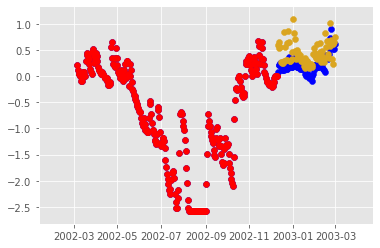

Epoch 0 batch 855 train Loss -0.1447 test Loss -0.2054 with training MSE metric 0.1290 and testing MSE metric 0.1148
NSE per seq:  0.5818662372733574
learning rate is 0.0003000000142492354


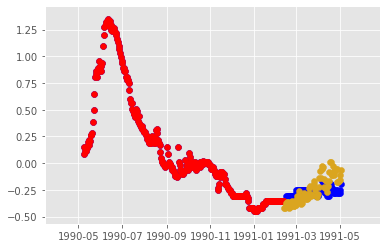

Epoch 0 batch 858 train Loss -0.1316 test Loss -0.2446 with training MSE metric 0.1384 and testing MSE metric 0.1140
NSE per seq:  -0.3227923220223714
learning rate is 0.0003000000142492354


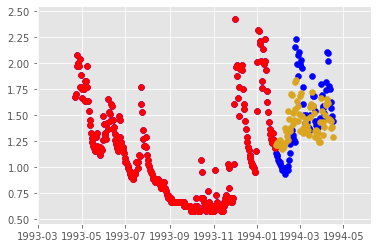

Epoch 0 batch 861 train Loss -0.1283 test Loss -0.1679 with training MSE metric 0.1429 and testing MSE metric 0.1477
NSE per seq:  0.5443302794300429
learning rate is 0.0003000000142492354


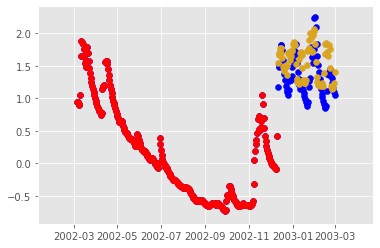

Epoch 0 batch 864 train Loss -0.1688 test Loss -0.1499 with training MSE metric 0.1290 and testing MSE metric 0.1663
NSE per seq:  0.3927005475509031
learning rate is 0.0003000000142492354


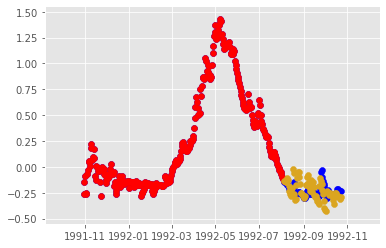

Epoch 0 batch 867 train Loss -0.1587 test Loss -0.2594 with training MSE metric 0.1320 and testing MSE metric 0.1035
NSE per seq:  0.5955168096034172
learning rate is 0.0003000000142492354


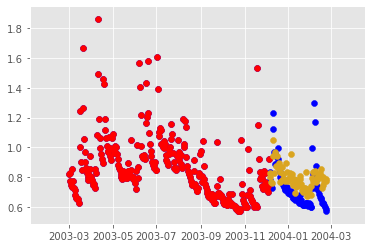

Epoch 0 batch 870 train Loss -0.0704 test Loss -0.2697 with training MSE metric 0.1642 and testing MSE metric 0.1159
NSE per seq:  0.4651277423194207
learning rate is 0.0003000000142492354


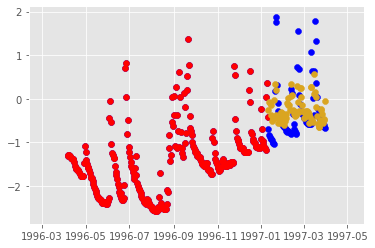

Epoch 0 batch 873 train Loss -0.1296 test Loss -0.1993 with training MSE metric 0.1516 and testing MSE metric 0.1029
NSE per seq:  0.49249635669325276
learning rate is 0.0003000000142492354


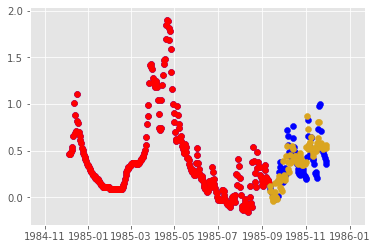

Epoch 0 batch 876 train Loss -0.0633 test Loss -0.1734 with training MSE metric 0.2149 and testing MSE metric 0.1311
NSE per seq:  0.6228763961034177
learning rate is 0.0003000000142492354


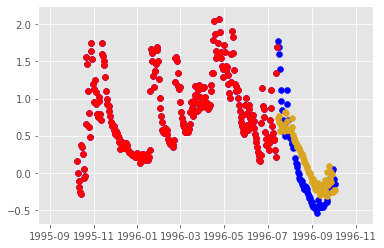

Epoch 0 batch 879 train Loss -0.1108 test Loss -0.1646 with training MSE metric 0.1539 and testing MSE metric 0.1271
NSE per seq:  -0.23835190561856748
learning rate is 0.0003000000142492354


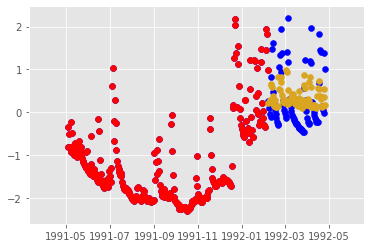

Epoch 0 batch 882 train Loss -0.0897 test Loss -0.2077 with training MSE metric 0.1576 and testing MSE metric 0.1143
NSE per seq:  0.43376587445692827
learning rate is 0.0003000000142492354


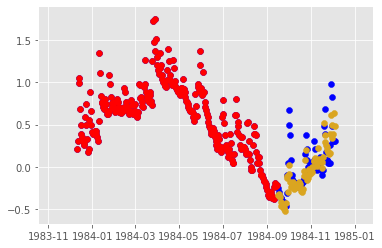

Epoch 0 batch 885 train Loss -0.1227 test Loss -0.1893 with training MSE metric 0.1849 and testing MSE metric 0.1176
NSE per seq:  0.45206832490976845
learning rate is 0.0003000000142492354


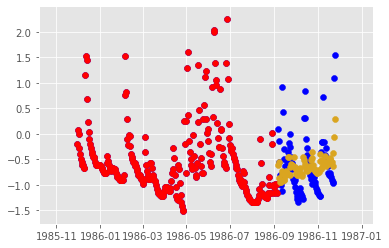

Epoch 0 batch 888 train Loss -0.1679 test Loss -0.1957 with training MSE metric 0.1157 and testing MSE metric 0.0958
NSE per seq:  0.4315934265060475
learning rate is 0.0003000000142492354


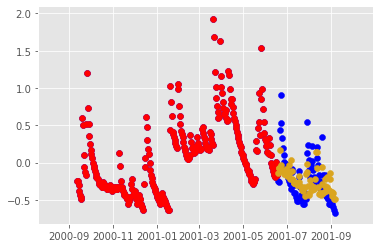

Epoch 0 batch 891 train Loss -0.1635 test Loss -0.2519 with training MSE metric 0.1162 and testing MSE metric 0.0867
NSE per seq:  0.48999790529170484
learning rate is 0.0003000000142492354


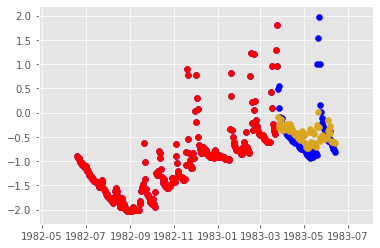

Epoch 0 batch 894 train Loss -0.1932 test Loss -0.2726 with training MSE metric 0.1172 and testing MSE metric 0.0996
NSE per seq:  0.516074182184937
learning rate is 0.0003000000142492354


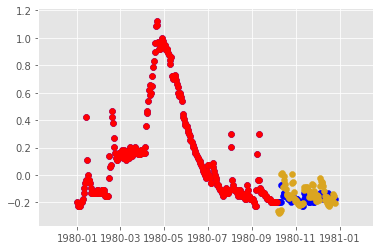

Epoch 0 batch 897 train Loss -0.1868 test Loss -0.2251 with training MSE metric 0.1065 and testing MSE metric 0.1018
NSE per seq:  0.5618673044228373
learning rate is 0.0003000000142492354


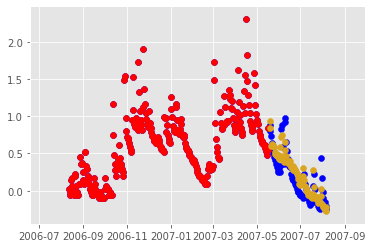

Epoch 0 batch 900 train Loss -0.1678 test Loss -0.1785 with training MSE metric 0.1217 and testing MSE metric 0.1487
NSE per seq:  0.5456297628594198
learning rate is 0.0003000000142492354


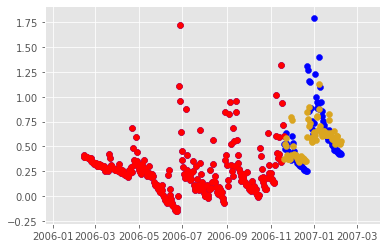

Epoch 0 batch 903 train Loss -0.1736 test Loss -0.1572 with training MSE metric 0.1340 and testing MSE metric 0.1482
NSE per seq:  0.36599522825173925
learning rate is 0.0003000000142492354


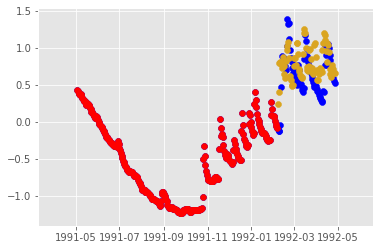

Epoch 0 batch 906 train Loss -0.1442 test Loss -0.2049 with training MSE metric 0.1327 and testing MSE metric 0.0924
NSE per seq:  0.5422017964315647
learning rate is 0.0003000000142492354


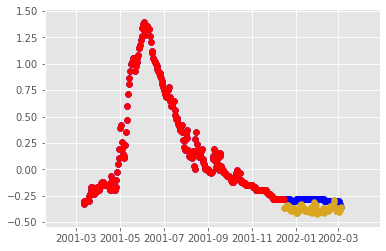

Epoch 0 batch 909 train Loss -0.1704 test Loss -0.2189 with training MSE metric 0.1340 and testing MSE metric 0.1268
NSE per seq:  0.49800887260236537
learning rate is 0.0003000000142492354


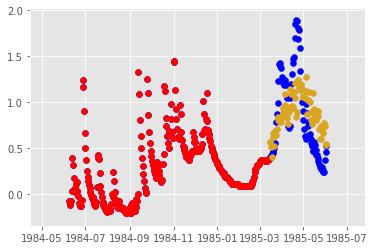

Epoch 0 batch 912 train Loss -0.1293 test Loss -0.2182 with training MSE metric 0.1768 and testing MSE metric 0.1000
NSE per seq:  0.49782648174085076
learning rate is 0.0003000000142492354


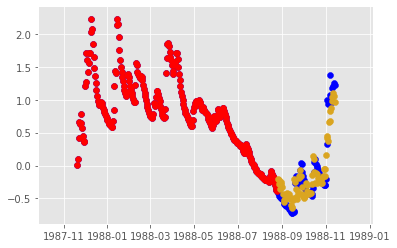

Epoch 0 batch 915 train Loss -0.2027 test Loss -0.1657 with training MSE metric 0.1035 and testing MSE metric 0.1302
NSE per seq:  0.5321954753987229
learning rate is 0.0003000000142492354


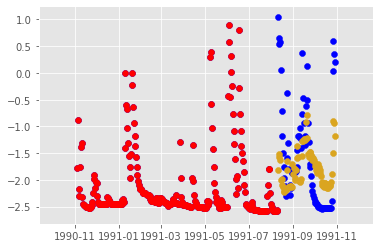

Epoch 0 batch 918 train Loss -0.2075 test Loss -0.1766 with training MSE metric 0.1101 and testing MSE metric 0.1436
NSE per seq:  0.5852878228860039
learning rate is 0.0003000000142492354


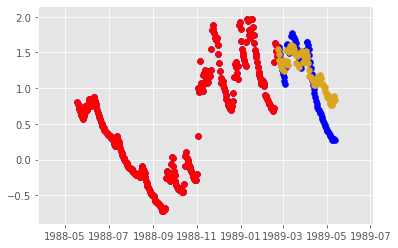

Epoch 0 batch 921 train Loss -0.1511 test Loss -0.1539 with training MSE metric 0.1399 and testing MSE metric 0.1399
NSE per seq:  0.4008884674485749
learning rate is 0.0003000000142492354


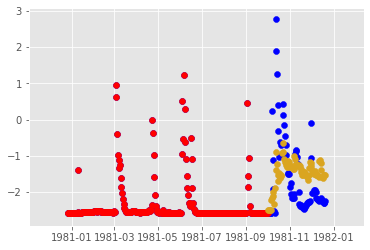

Epoch 0 batch 924 train Loss -0.2018 test Loss -0.2174 with training MSE metric 0.1043 and testing MSE metric 0.1633
NSE per seq:  0.5969207363089444
learning rate is 0.0003000000142492354


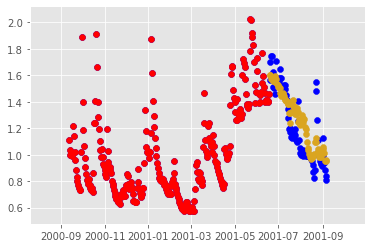

Epoch 0 batch 927 train Loss -0.1276 test Loss -0.2028 with training MSE metric 0.1438 and testing MSE metric 0.1376
NSE per seq:  0.5269825638169205
learning rate is 0.0003000000142492354


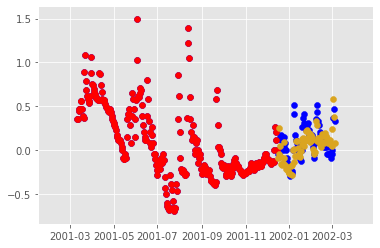

Epoch 0 batch 930 train Loss -0.1987 test Loss -0.2111 with training MSE metric 0.1223 and testing MSE metric 0.1100
NSE per seq:  0.5925005279945135
learning rate is 0.0003000000142492354


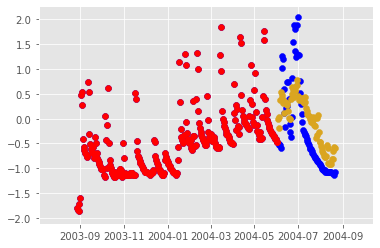

Epoch 0 batch 933 train Loss -0.1210 test Loss -0.2638 with training MSE metric 0.1465 and testing MSE metric 0.1167
NSE per seq:  0.5924970553734554
learning rate is 0.0003000000142492354


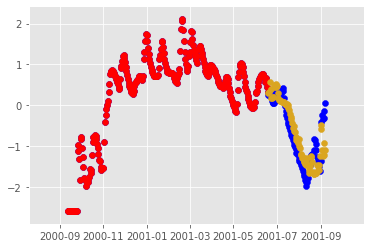

Epoch 0 batch 936 train Loss -0.2027 test Loss -0.1991 with training MSE metric 0.1243 and testing MSE metric 0.1158
NSE per seq:  0.5948283359381172
learning rate is 0.0003000000142492354


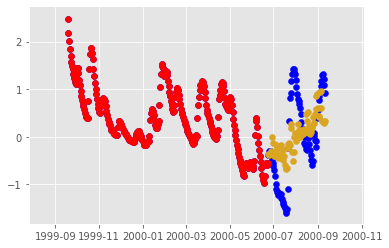

Epoch 0 batch 939 train Loss -0.1771 test Loss -0.2209 with training MSE metric 0.1255 and testing MSE metric 0.1059
NSE per seq:  0.6521099264545208
learning rate is 0.0003000000142492354


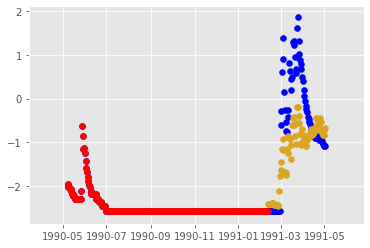

Epoch 0 batch 942 train Loss -0.2020 test Loss -0.1784 with training MSE metric 0.1134 and testing MSE metric 0.1529
NSE per seq:  0.51945674663245
learning rate is 0.0003000000142492354


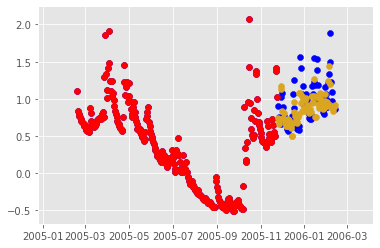

Epoch 0 batch 945 train Loss -0.1950 test Loss -0.2307 with training MSE metric 0.1266 and testing MSE metric 0.1257
NSE per seq:  0.49505245510571144
learning rate is 0.0003000000142492354


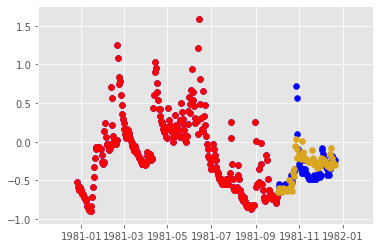

Epoch 0 batch 948 train Loss -0.1548 test Loss -0.2873 with training MSE metric 0.1405 and testing MSE metric 0.0731
NSE per seq:  0.6288892883836454
learning rate is 0.0003000000142492354


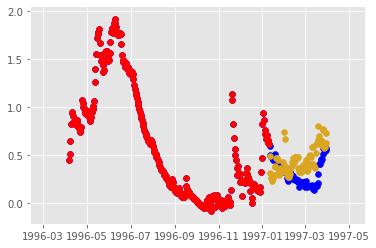

Epoch 0 batch 951 train Loss -0.2121 test Loss -0.2700 with training MSE metric 0.1069 and testing MSE metric 0.0890
NSE per seq:  -0.6662140461813499
learning rate is 0.0003000000142492354


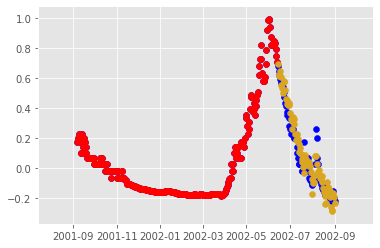

Epoch 0 batch 954 train Loss -0.1780 test Loss -0.2732 with training MSE metric 0.1128 and testing MSE metric 0.0837
NSE per seq:  0.5330259534764855
learning rate is 0.0003000000142492354


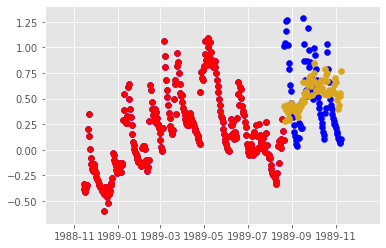

Epoch 0 batch 957 train Loss -0.1568 test Loss -0.2446 with training MSE metric 0.1327 and testing MSE metric 0.0988
NSE per seq:  0.5924875573632081
learning rate is 0.0003000000142492354


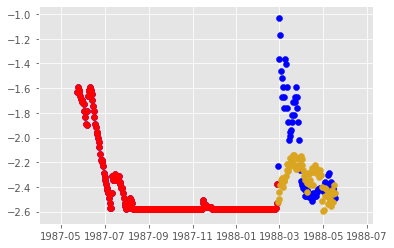

Epoch 0 batch 960 train Loss -0.1522 test Loss -0.2028 with training MSE metric 0.1467 and testing MSE metric 0.1409
NSE per seq:  0.4245029973189844
learning rate is 0.0003000000142492354


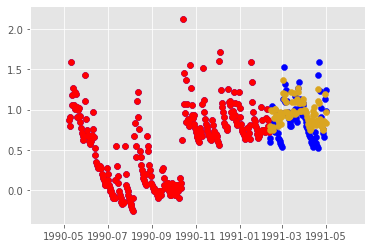

Epoch 0 batch 963 train Loss -0.1729 test Loss -0.2308 with training MSE metric 0.1358 and testing MSE metric 0.0990
NSE per seq:  0.5659596512365099
learning rate is 0.0003000000142492354


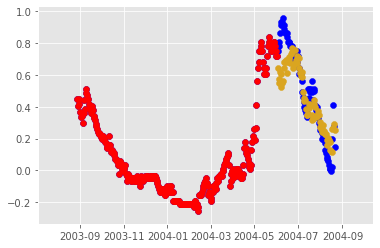

Epoch 0 batch 966 train Loss -0.2027 test Loss -0.1585 with training MSE metric 0.1073 and testing MSE metric 0.1460
NSE per seq:  0.6490455127948226
learning rate is 0.0003000000142492354


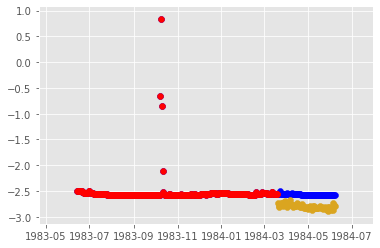

Epoch 0 batch 969 train Loss -0.2004 test Loss -0.1949 with training MSE metric 0.1127 and testing MSE metric 0.1101
NSE per seq:  -1.3211227740716522
learning rate is 0.0003000000142492354


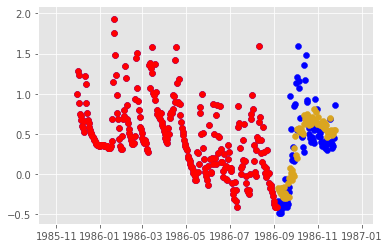

Epoch 0 batch 972 train Loss -0.1830 test Loss -0.2492 with training MSE metric 0.1099 and testing MSE metric 0.1176
NSE per seq:  0.5646754916986666
learning rate is 0.0003000000142492354


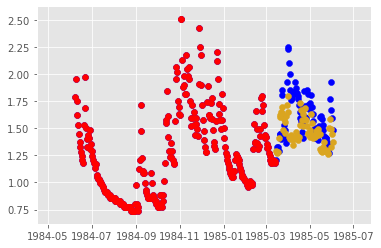

Epoch 0 batch 975 train Loss -0.1261 test Loss -0.3007 with training MSE metric 0.1463 and testing MSE metric 0.0650
NSE per seq:  0.6240844301716408
learning rate is 0.0003000000142492354


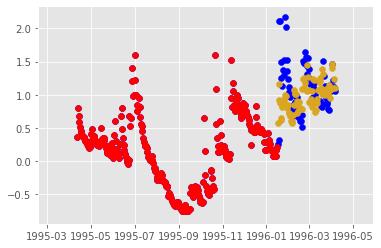

Epoch 0 batch 978 train Loss -0.1475 test Loss -0.2761 with training MSE metric 0.1475 and testing MSE metric 0.0908
NSE per seq:  0.5200978026764078
learning rate is 0.0003000000142492354


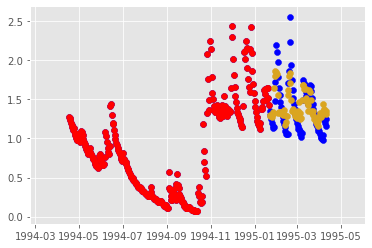

Epoch 0 batch 981 train Loss -0.1676 test Loss -0.2008 with training MSE metric 0.1208 and testing MSE metric 0.1064
NSE per seq:  -0.09103828078474022
learning rate is 0.0003000000142492354


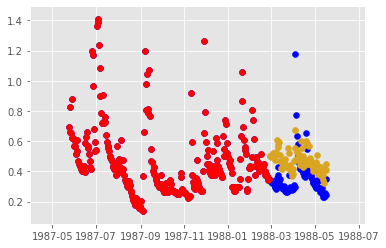

Epoch 0 batch 984 train Loss -0.2126 test Loss -0.2070 with training MSE metric 0.1237 and testing MSE metric 0.1021
NSE per seq:  0.3783169754103539
learning rate is 0.0003000000142492354


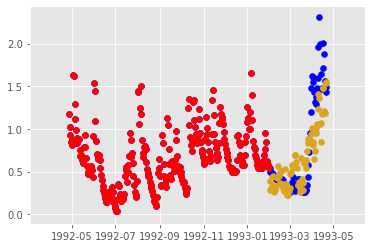

Epoch 0 batch 987 train Loss -0.1204 test Loss -0.2976 with training MSE metric 0.1464 and testing MSE metric 0.0963
NSE per seq:  0.634394216611686
learning rate is 0.0003000000142492354


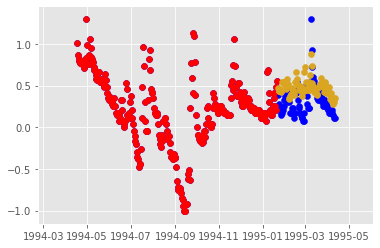

Epoch 0 batch 990 train Loss -0.1773 test Loss -0.2450 with training MSE metric 0.1266 and testing MSE metric 0.0947
NSE per seq:  0.5808801898851338
learning rate is 0.0003000000142492354


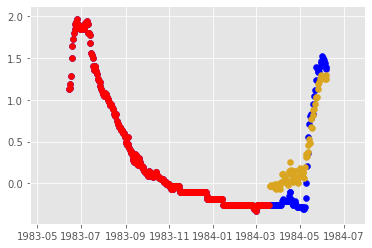

Epoch 0 batch 993 train Loss -0.1890 test Loss -0.2898 with training MSE metric 0.1238 and testing MSE metric 0.0716
NSE per seq:  0.5238646272607035
learning rate is 0.0003000000142492354


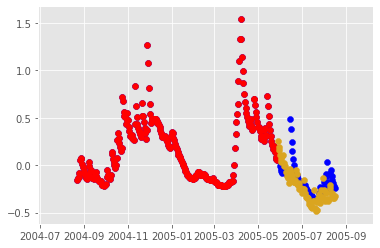

Epoch 0 batch 996 train Loss -0.1408 test Loss -0.2448 with training MSE metric 0.1317 and testing MSE metric 0.1363
NSE per seq:  0.4756481788397123
learning rate is 0.0003000000142492354


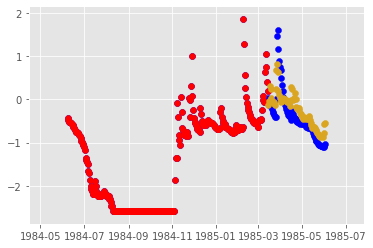

Epoch 0 batch 999 train Loss -0.1567 test Loss -0.1966 with training MSE metric 0.1758 and testing MSE metric 0.1553
NSE per seq:  0.5752705985140398
learning rate is 0.0003000000142492354
Time taken for 1 epoch: 6820.080276966095 secs



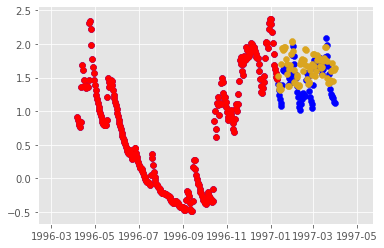

Epoch 1 batch 0 train Loss -0.1677 test Loss -0.1455 with training MSE metric 0.1440 and testing MSE metric 0.1389
NSE per seq:  0.35194248351879764
learning rate is 0.0003000000142492354


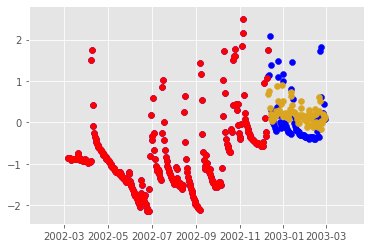

Epoch 1 batch 3 train Loss -0.1958 test Loss -0.1635 with training MSE metric 0.1127 and testing MSE metric 0.1262
NSE per seq:  0.4617399723760824
learning rate is 0.0003000000142492354


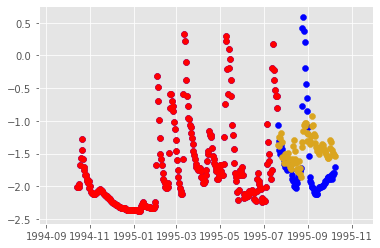

Epoch 1 batch 6 train Loss -0.1851 test Loss -0.2152 with training MSE metric 0.1316 and testing MSE metric 0.1195
NSE per seq:  0.6667746824175915
learning rate is 0.0003000000142492354


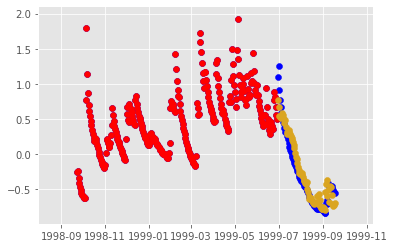

Epoch 1 batch 9 train Loss -0.2018 test Loss -0.2585 with training MSE metric 0.1343 and testing MSE metric 0.1060
NSE per seq:  0.607976433889619
learning rate is 0.0003000000142492354


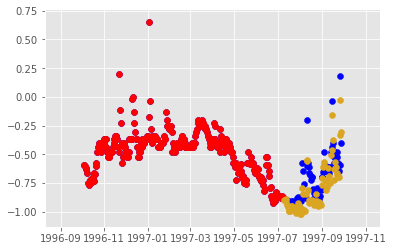

Epoch 1 batch 12 train Loss -0.1951 test Loss -0.2597 with training MSE metric 0.1045 and testing MSE metric 0.0879
NSE per seq:  0.46430022655776604
learning rate is 0.0003000000142492354


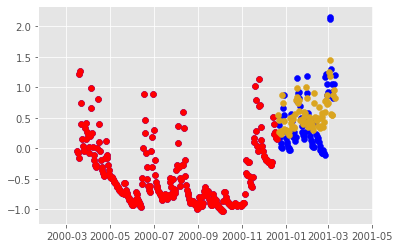

Epoch 1 batch 15 train Loss -0.1746 test Loss -0.2856 with training MSE metric 0.1193 and testing MSE metric 0.0948
NSE per seq:  0.6879464736233527
learning rate is 0.0003000000142492354


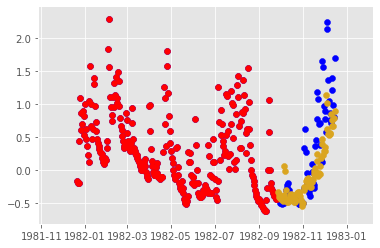

Epoch 1 batch 18 train Loss -0.1506 test Loss -0.1871 with training MSE metric 0.1173 and testing MSE metric 0.1383
NSE per seq:  -0.4312020404656429
learning rate is 0.0003000000142492354


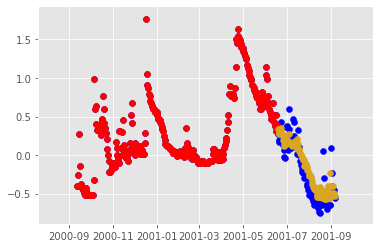

Epoch 1 batch 21 train Loss -0.1230 test Loss -0.1971 with training MSE metric 0.1478 and testing MSE metric 0.1348
NSE per seq:  0.6163204479134599
learning rate is 0.0003000000142492354


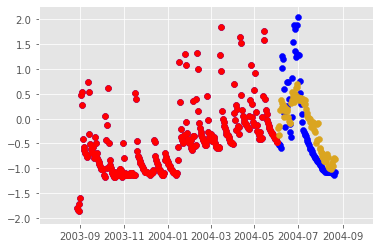

Epoch 1 batch 24 train Loss -0.2091 test Loss -0.2178 with training MSE metric 0.1139 and testing MSE metric 0.1152
NSE per seq:  0.6574956030407457
learning rate is 0.0003000000142492354


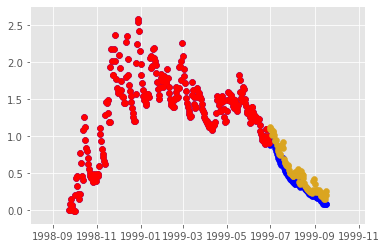

Epoch 1 batch 27 train Loss -0.2280 test Loss -0.1039 with training MSE metric 0.0992 and testing MSE metric 0.1735
NSE per seq:  0.41593026969246744
learning rate is 0.0003000000142492354


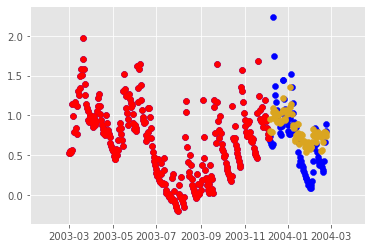

Epoch 1 batch 30 train Loss -0.1806 test Loss -0.2279 with training MSE metric 0.1250 and testing MSE metric 0.1156
NSE per seq:  0.6387284314306054
learning rate is 0.0003000000142492354


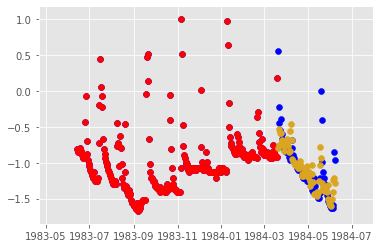

Epoch 1 batch 33 train Loss -0.1685 test Loss -0.1751 with training MSE metric 0.1206 and testing MSE metric 0.1354
NSE per seq:  0.557380879379149
learning rate is 0.0003000000142492354


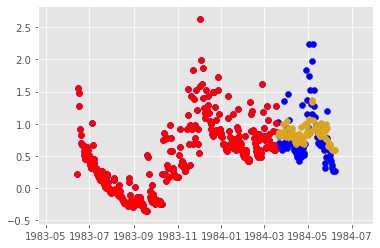

Epoch 1 batch 36 train Loss -0.1562 test Loss -0.2165 with training MSE metric 0.1406 and testing MSE metric 0.1236
NSE per seq:  0.5655196621599722
learning rate is 0.0003000000142492354


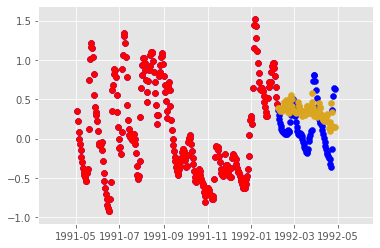

Epoch 1 batch 39 train Loss -0.1793 test Loss -0.1210 with training MSE metric 0.1199 and testing MSE metric 0.1179
NSE per seq:  0.4549097590380119
learning rate is 0.0003000000142492354


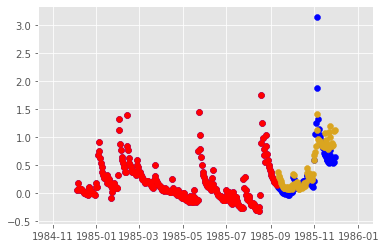

Epoch 1 batch 42 train Loss -0.1995 test Loss -0.2504 with training MSE metric 0.1224 and testing MSE metric 0.0883
NSE per seq:  0.06433915636171439
learning rate is 0.0003000000142492354


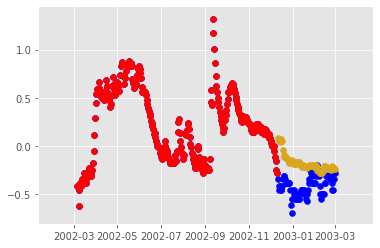

Epoch 1 batch 45 train Loss -0.1986 test Loss -0.2019 with training MSE metric 0.1106 and testing MSE metric 0.1029
NSE per seq:  0.5181250971862545
learning rate is 0.0003000000142492354


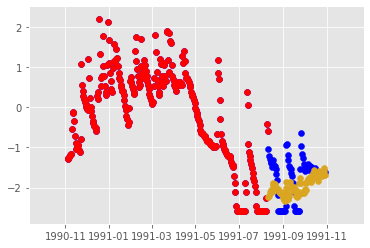

Epoch 1 batch 48 train Loss -0.2130 test Loss -0.3179 with training MSE metric 0.1109 and testing MSE metric 0.0887
NSE per seq:  0.7232286322664585
learning rate is 0.0003000000142492354


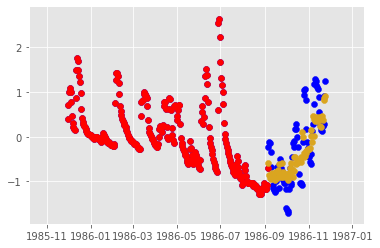

Epoch 1 batch 51 train Loss -0.1523 test Loss -0.2123 with training MSE metric 0.1306 and testing MSE metric 0.1045
NSE per seq:  0.6404138538193426
learning rate is 0.0003000000142492354


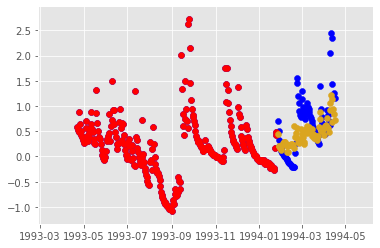

Epoch 1 batch 54 train Loss -0.1723 test Loss -0.2532 with training MSE metric 0.1294 and testing MSE metric 0.1114
NSE per seq:  0.544356524976866
learning rate is 0.0003000000142492354


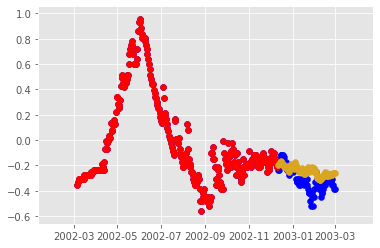

Epoch 1 batch 57 train Loss -0.1875 test Loss -0.2405 with training MSE metric 0.1131 and testing MSE metric 0.1016
NSE per seq:  0.4188130302501036
learning rate is 0.0003000000142492354


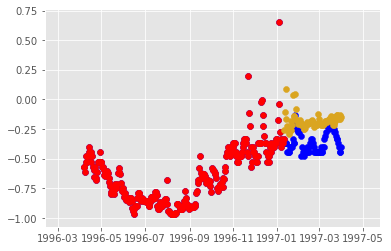

Epoch 1 batch 60 train Loss -0.1736 test Loss -0.2214 with training MSE metric 0.1217 and testing MSE metric 0.1235
NSE per seq:  0.6341527545516755
learning rate is 0.0003000000142492354


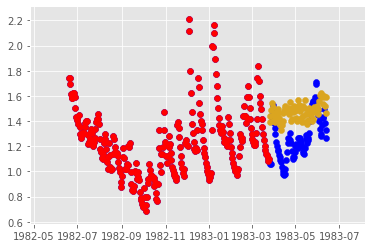

Epoch 1 batch 63 train Loss -0.2380 test Loss -0.1978 with training MSE metric 0.1037 and testing MSE metric 0.1385
NSE per seq:  0.566448270064458
learning rate is 0.0003000000142492354


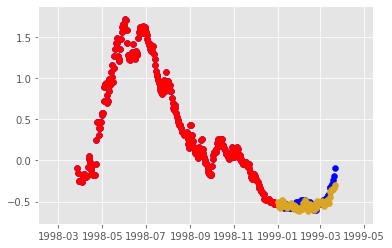

Epoch 1 batch 66 train Loss -0.2076 test Loss -0.2024 with training MSE metric 0.1209 and testing MSE metric 0.1626
NSE per seq:  0.5963488831873361
learning rate is 0.0003000000142492354


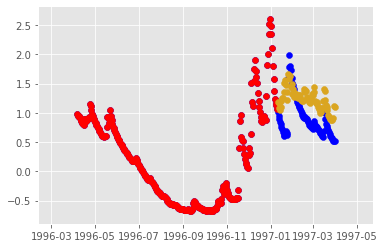

Epoch 1 batch 69 train Loss -0.2084 test Loss -0.1875 with training MSE metric 0.1038 and testing MSE metric 0.1076
NSE per seq:  0.40916205256361393
learning rate is 0.0003000000142492354


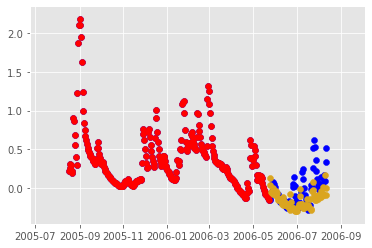

Epoch 1 batch 72 train Loss -0.2456 test Loss -0.2699 with training MSE metric 0.0928 and testing MSE metric 0.1318
NSE per seq:  0.6465227484612707
learning rate is 0.0003000000142492354


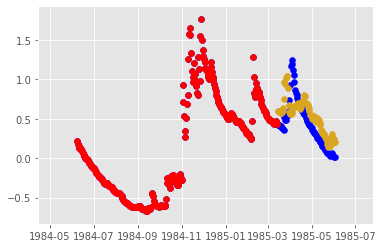

Epoch 1 batch 75 train Loss -0.2269 test Loss -0.2105 with training MSE metric 0.1085 and testing MSE metric 0.1109
NSE per seq:  0.6499206540967316
learning rate is 0.0003000000142492354


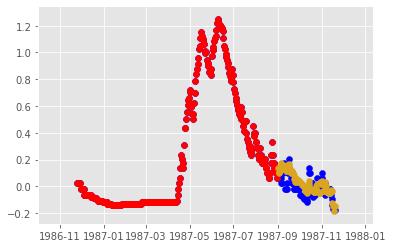

Epoch 1 batch 78 train Loss -0.2104 test Loss -0.2875 with training MSE metric 0.1043 and testing MSE metric 0.0832
NSE per seq:  -0.9701057929023205
learning rate is 0.0003000000142492354


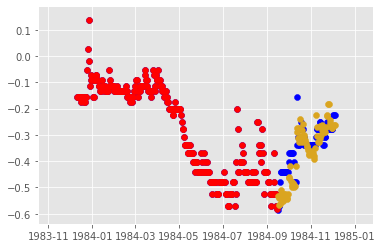

Epoch 1 batch 81 train Loss -0.2305 test Loss -0.2667 with training MSE metric 0.1081 and testing MSE metric 0.1083
NSE per seq:  0.6671226902209995
learning rate is 0.0003000000142492354


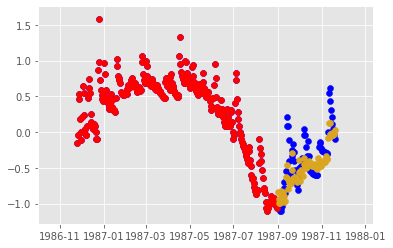

Epoch 1 batch 84 train Loss -0.0984 test Loss -0.1876 with training MSE metric 0.1621 and testing MSE metric 0.1314
NSE per seq:  0.49918938705500315
learning rate is 0.0003000000142492354


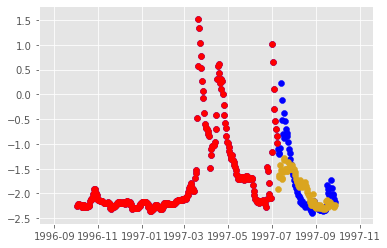

Epoch 1 batch 87 train Loss -0.1867 test Loss -0.2031 with training MSE metric 0.1153 and testing MSE metric 0.1126
NSE per seq:  0.5521186422506767
learning rate is 0.0003000000142492354


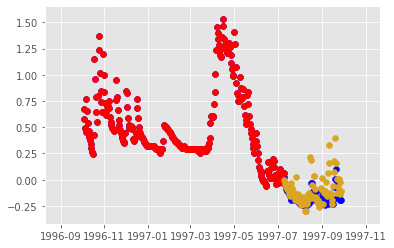

Epoch 1 batch 90 train Loss -0.2092 test Loss -0.2779 with training MSE metric 0.1124 and testing MSE metric 0.0962
NSE per seq:  0.6518854788539422
learning rate is 0.0003000000142492354


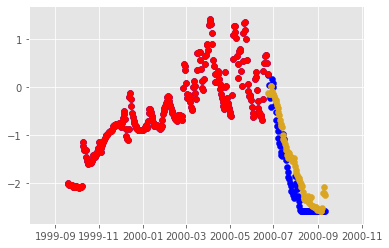

Epoch 1 batch 93 train Loss -0.1827 test Loss -0.1686 with training MSE metric 0.1528 and testing MSE metric 0.1373
NSE per seq:  0.6999692804133881
learning rate is 0.0003000000142492354


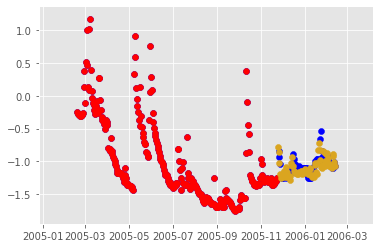

Epoch 1 batch 96 train Loss -0.1813 test Loss -0.2669 with training MSE metric 0.1085 and testing MSE metric 0.0806
NSE per seq:  0.6212334482953827
learning rate is 0.0003000000142492354


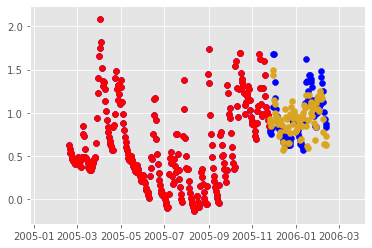

Epoch 1 batch 99 train Loss -0.2258 test Loss -0.2803 with training MSE metric 0.0996 and testing MSE metric 0.0961
NSE per seq:  0.5429635158816443
learning rate is 0.0003000000142492354


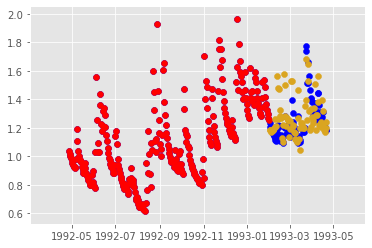

Epoch 1 batch 102 train Loss -0.1853 test Loss -0.2208 with training MSE metric 0.1171 and testing MSE metric 0.1431
NSE per seq:  0.4824415359370456
learning rate is 0.0003000000142492354


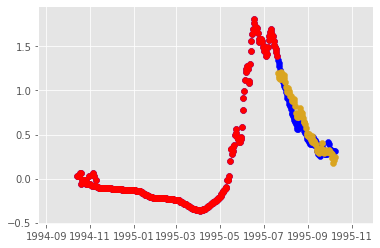

Epoch 1 batch 105 train Loss -0.1755 test Loss -0.2895 with training MSE metric 0.1224 and testing MSE metric 0.1130
NSE per seq:  0.6647086792047197
learning rate is 0.0003000000142492354


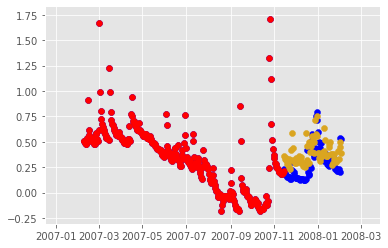

Epoch 1 batch 108 train Loss -0.2492 test Loss -0.2146 with training MSE metric 0.0969 and testing MSE metric 0.1298
NSE per seq:  0.5907601060462584
learning rate is 0.0003000000142492354


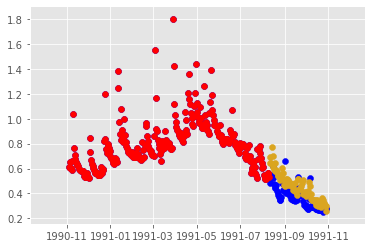

Epoch 1 batch 111 train Loss -0.2008 test Loss -0.1781 with training MSE metric 0.1191 and testing MSE metric 0.1348
NSE per seq:  0.5267005266422529
learning rate is 0.0003000000142492354


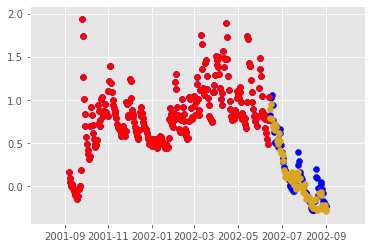

Epoch 1 batch 114 train Loss -0.1801 test Loss -0.2840 with training MSE metric 0.1302 and testing MSE metric 0.0756
NSE per seq:  0.6144377797716245
learning rate is 0.0003000000142492354


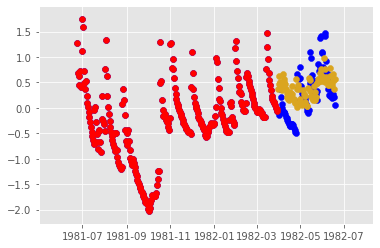

Epoch 1 batch 117 train Loss -0.2377 test Loss -0.2764 with training MSE metric 0.1120 and testing MSE metric 0.0999
NSE per seq:  0.5781854692145998
learning rate is 0.0003000000142492354


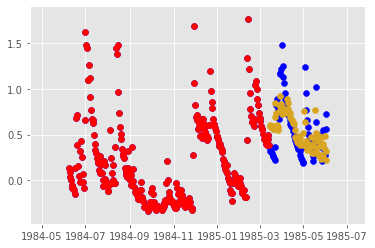

Epoch 1 batch 120 train Loss -0.1716 test Loss -0.1689 with training MSE metric 0.1312 and testing MSE metric 0.1291
NSE per seq:  0.5724640953360232
learning rate is 0.0003000000142492354


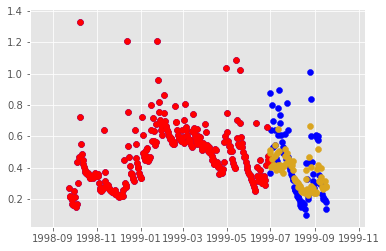

Epoch 1 batch 123 train Loss -0.2294 test Loss -0.3355 with training MSE metric 0.1127 and testing MSE metric 0.0776
NSE per seq:  0.27670766975776756
learning rate is 0.0003000000142492354


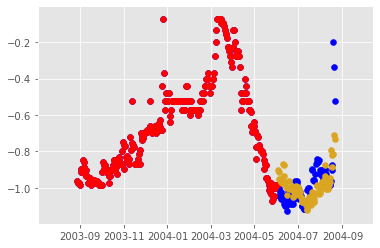

Epoch 1 batch 126 train Loss -0.2054 test Loss -0.3148 with training MSE metric 0.1082 and testing MSE metric 0.0705
NSE per seq:  0.6870671959644731
learning rate is 0.0003000000142492354


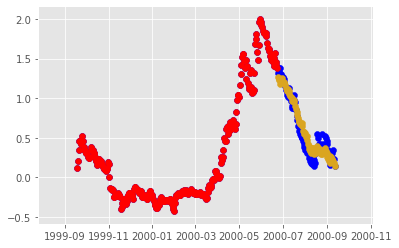

Epoch 1 batch 129 train Loss -0.1922 test Loss -0.3883 with training MSE metric 0.1157 and testing MSE metric 0.0494
NSE per seq:  0.621185888351799
learning rate is 0.0003000000142492354


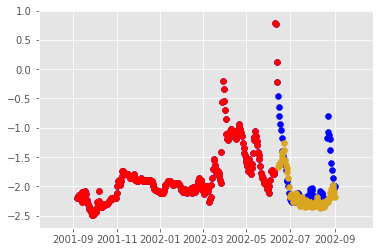

Epoch 1 batch 132 train Loss -0.1854 test Loss -0.1837 with training MSE metric 0.1525 and testing MSE metric 0.1068
NSE per seq:  0.6851660730839287
learning rate is 0.0003000000142492354


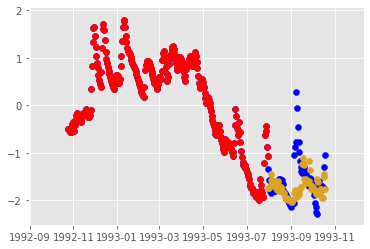

Epoch 1 batch 135 train Loss -0.2283 test Loss -0.2518 with training MSE metric 0.0935 and testing MSE metric 0.1044
NSE per seq:  0.6176697081387714
learning rate is 0.0003000000142492354


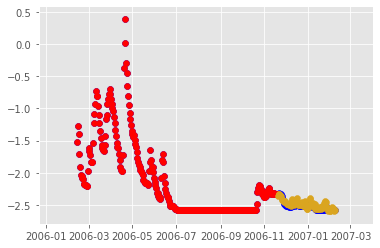

Epoch 1 batch 138 train Loss -0.2112 test Loss -0.1729 with training MSE metric 0.1097 and testing MSE metric 0.1473
NSE per seq:  0.6030079722462325
learning rate is 0.0003000000142492354


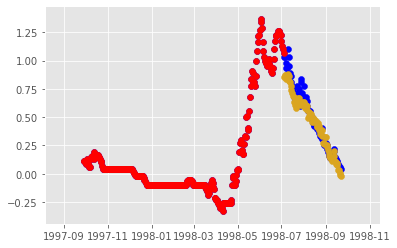

Epoch 1 batch 141 train Loss -0.1861 test Loss -0.1565 with training MSE metric 0.1215 and testing MSE metric 0.1404
NSE per seq:  0.40545686399992265
learning rate is 0.0003000000142492354


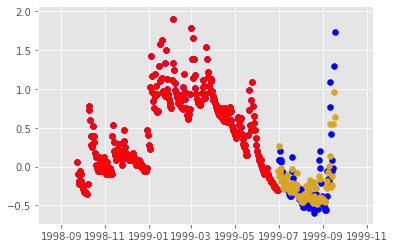

Epoch 1 batch 144 train Loss -0.2930 test Loss -0.2298 with training MSE metric 0.0676 and testing MSE metric 0.1072
NSE per seq:  0.5952857730756727
learning rate is 0.0003000000142492354


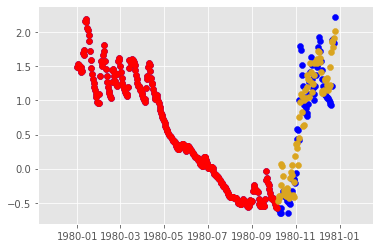

Epoch 1 batch 147 train Loss -0.2193 test Loss -0.2497 with training MSE metric 0.0911 and testing MSE metric 0.1221
NSE per seq:  0.6764609067582543
learning rate is 0.0003000000142492354


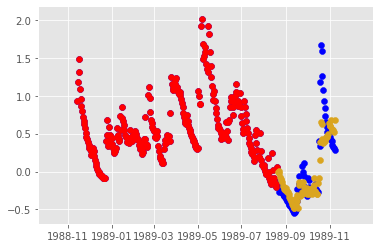

Epoch 1 batch 150 train Loss -0.2089 test Loss -0.2549 with training MSE metric 0.1068 and testing MSE metric 0.1255
NSE per seq:  0.4360206864756457
learning rate is 0.0003000000142492354


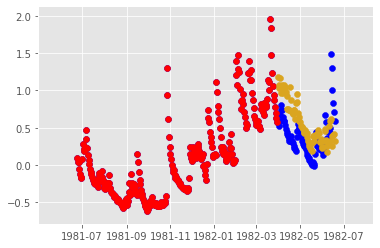

Epoch 1 batch 153 train Loss -0.2382 test Loss -0.2181 with training MSE metric 0.1214 and testing MSE metric 0.1367
NSE per seq:  0.6449747387335552
learning rate is 0.0003000000142492354


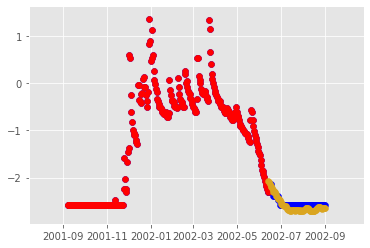

Epoch 1 batch 156 train Loss -0.2307 test Loss -0.2128 with training MSE metric 0.1092 and testing MSE metric 0.0985
NSE per seq:  0.594886672622083
learning rate is 0.0003000000142492354


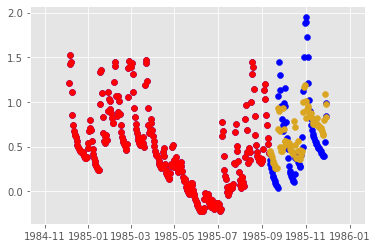

Epoch 1 batch 159 train Loss -0.2320 test Loss -0.2712 with training MSE metric 0.1132 and testing MSE metric 0.0801
NSE per seq:  0.6823388288724599
learning rate is 0.0003000000142492354


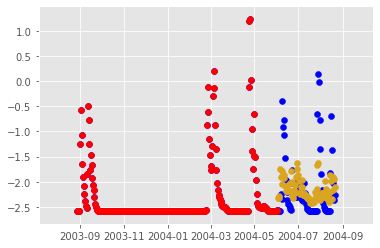

Epoch 1 batch 162 train Loss -0.2755 test Loss -0.2090 with training MSE metric 0.0963 and testing MSE metric 0.1204
NSE per seq:  0.5768739921164769
learning rate is 0.0003000000142492354


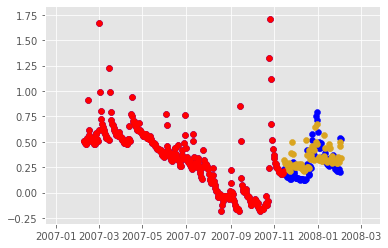

Epoch 1 batch 165 train Loss -0.2282 test Loss -0.3571 with training MSE metric 0.0967 and testing MSE metric 0.0549
NSE per seq:  0.7018102721844703
learning rate is 0.0003000000142492354


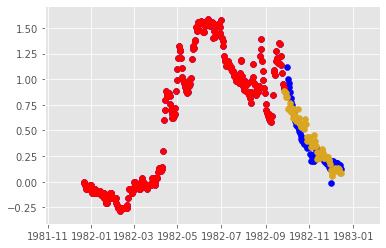

Epoch 1 batch 168 train Loss -0.2709 test Loss -0.3288 with training MSE metric 0.1173 and testing MSE metric 0.0773
NSE per seq:  0.7103633348903126
learning rate is 0.0003000000142492354


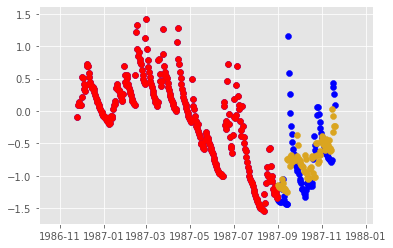

Epoch 1 batch 171 train Loss -0.2143 test Loss -0.3801 with training MSE metric 0.1211 and testing MSE metric 0.0596
NSE per seq:  0.6273738309638179
learning rate is 0.0003000000142492354


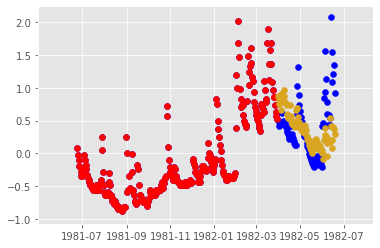

Epoch 1 batch 174 train Loss -0.2541 test Loss -0.3094 with training MSE metric 0.1071 and testing MSE metric 0.0864
NSE per seq:  0.6295655775951974
learning rate is 0.0003000000142492354


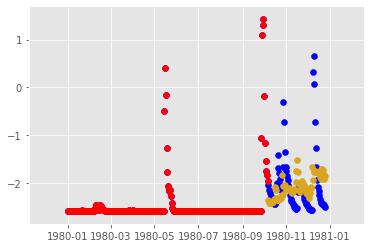

Epoch 1 batch 177 train Loss -0.1903 test Loss -0.3284 with training MSE metric 0.1212 and testing MSE metric 0.0807
NSE per seq:  0.7561077152380962
learning rate is 0.0003000000142492354


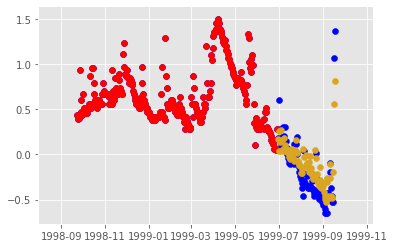

Epoch 1 batch 180 train Loss -0.2542 test Loss -0.3348 with training MSE metric 0.1003 and testing MSE metric 0.0837
NSE per seq:  0.6650156059578758
learning rate is 0.0003000000142492354


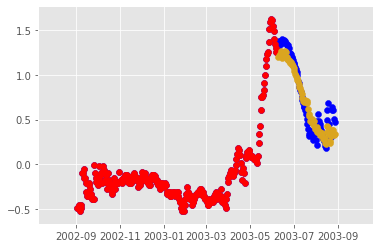

Epoch 1 batch 183 train Loss -0.2417 test Loss -0.2786 with training MSE metric 0.0951 and testing MSE metric 0.1030
NSE per seq:  0.6923567206951542
learning rate is 0.0003000000142492354


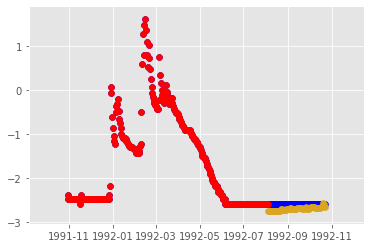

Epoch 1 batch 186 train Loss -0.2406 test Loss -0.2710 with training MSE metric 0.0951 and testing MSE metric 0.1157
NSE per seq:  0.6190919442664828
learning rate is 0.0003000000142492354


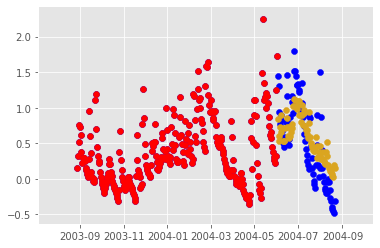

Epoch 1 batch 189 train Loss -0.2615 test Loss -0.2671 with training MSE metric 0.0936 and testing MSE metric 0.0919
NSE per seq:  -0.1208974951354963
learning rate is 0.0003000000142492354


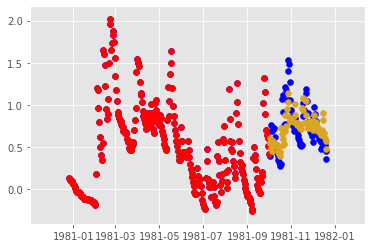

Epoch 1 batch 192 train Loss -0.2236 test Loss -0.3312 with training MSE metric 0.1034 and testing MSE metric 0.0749
NSE per seq:  0.690311107743095
learning rate is 0.0003000000142492354


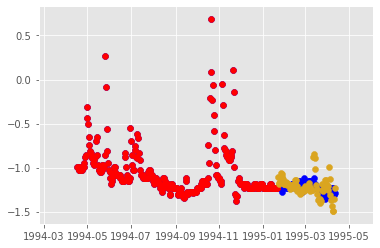

Epoch 1 batch 195 train Loss -0.2607 test Loss -0.2961 with training MSE metric 0.1061 and testing MSE metric 0.0947
NSE per seq:  0.6539012163481159
learning rate is 0.0003000000142492354


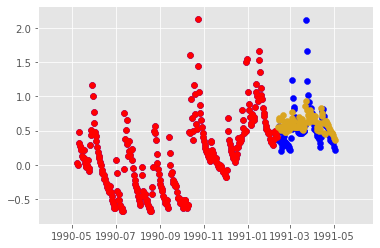

Epoch 1 batch 198 train Loss -0.2379 test Loss -0.3265 with training MSE metric 0.1040 and testing MSE metric 0.0882
NSE per seq:  0.7130637713057082
learning rate is 0.0003000000142492354


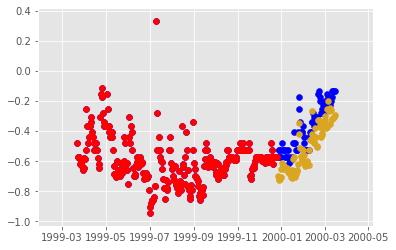

Epoch 1 batch 201 train Loss -0.1991 test Loss -0.3273 with training MSE metric 0.1327 and testing MSE metric 0.0771
NSE per seq:  0.6598104393075513
learning rate is 0.0003000000142492354


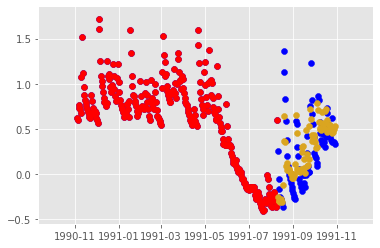

Epoch 1 batch 204 train Loss -0.2525 test Loss -0.2575 with training MSE metric 0.1003 and testing MSE metric 0.1091
NSE per seq:  0.6086316214559908
learning rate is 0.0003000000142492354


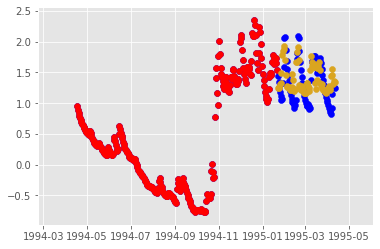

Epoch 1 batch 207 train Loss -0.2367 test Loss -0.2443 with training MSE metric 0.0859 and testing MSE metric 0.1198
NSE per seq:  0.6204852346811822
learning rate is 0.0003000000142492354


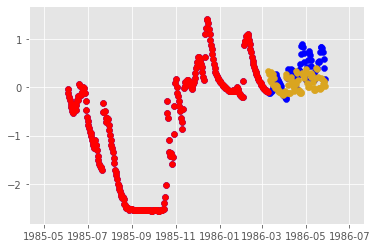

Epoch 1 batch 210 train Loss -0.2516 test Loss -0.3372 with training MSE metric 0.1038 and testing MSE metric 0.0661
NSE per seq:  0.5616730984298607
learning rate is 0.0003000000142492354


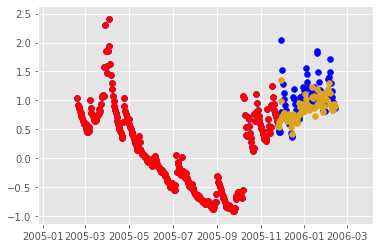

Epoch 1 batch 213 train Loss -0.2017 test Loss -0.2404 with training MSE metric 0.1324 and testing MSE metric 0.1281
NSE per seq:  0.6457842318728193
learning rate is 0.0003000000142492354


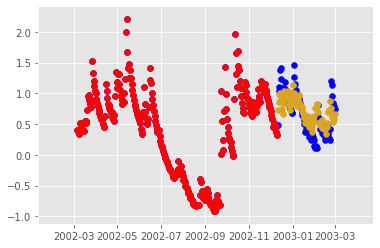

Epoch 1 batch 216 train Loss -0.2671 test Loss -0.2750 with training MSE metric 0.0901 and testing MSE metric 0.0866
NSE per seq:  0.5899127890603768
learning rate is 0.0003000000142492354


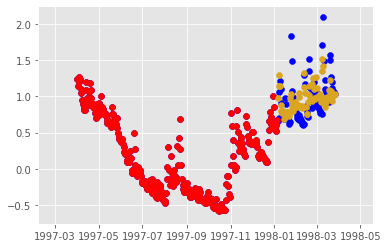

Epoch 1 batch 219 train Loss -0.2294 test Loss -0.2721 with training MSE metric 0.0915 and testing MSE metric 0.0987
NSE per seq:  0.6729315424593454
learning rate is 0.0003000000142492354


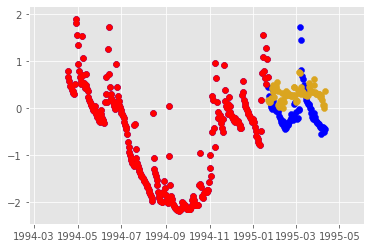

Epoch 1 batch 222 train Loss -0.2821 test Loss -0.2433 with training MSE metric 0.0864 and testing MSE metric 0.1043
NSE per seq:  0.6185471525362236
learning rate is 0.0003000000142492354


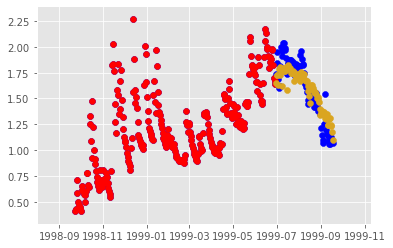

Epoch 1 batch 225 train Loss -0.2629 test Loss -0.3100 with training MSE metric 0.0996 and testing MSE metric 0.0873
NSE per seq:  0.6678827456054539
learning rate is 0.0003000000142492354


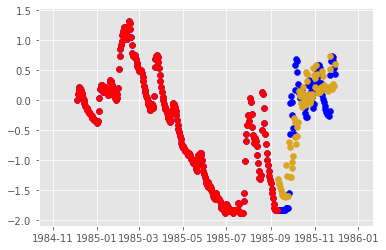

Epoch 1 batch 228 train Loss -0.1617 test Loss -0.2137 with training MSE metric 0.1280 and testing MSE metric 0.1463
NSE per seq:  0.6773459583065184
learning rate is 0.0003000000142492354


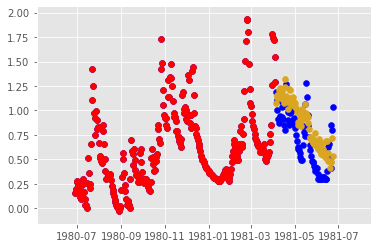

Epoch 1 batch 231 train Loss -0.1936 test Loss -0.3340 with training MSE metric 0.1292 and testing MSE metric 0.0714
NSE per seq:  0.654363079272118
learning rate is 0.0003000000142492354


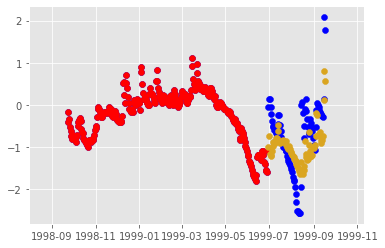

Epoch 1 batch 234 train Loss -0.2477 test Loss -0.2842 with training MSE metric 0.0992 and testing MSE metric 0.1120
NSE per seq:  0.6927944288201091
learning rate is 0.0003000000142492354


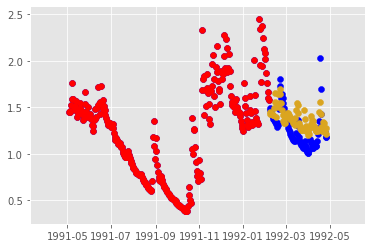

Epoch 1 batch 237 train Loss -0.2529 test Loss -0.3052 with training MSE metric 0.0917 and testing MSE metric 0.0939
NSE per seq:  0.7279083918435705
learning rate is 0.0003000000142492354


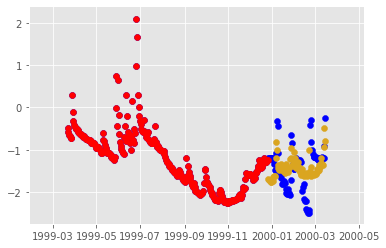

Epoch 1 batch 240 train Loss -0.2658 test Loss -0.3604 with training MSE metric 0.1267 and testing MSE metric 0.0691
NSE per seq:  0.6528779410482771
learning rate is 0.0003000000142492354


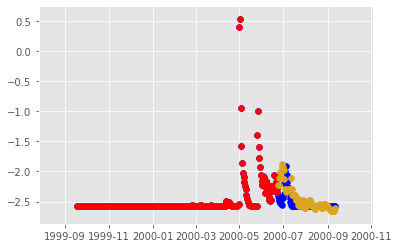

Epoch 1 batch 243 train Loss -0.2511 test Loss -0.1639 with training MSE metric 0.0906 and testing MSE metric 0.1787
NSE per seq:  0.5848171470191241
learning rate is 0.0003000000142492354


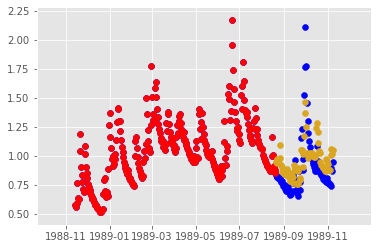

Epoch 1 batch 246 train Loss -0.2996 test Loss -0.2616 with training MSE metric 0.0782 and testing MSE metric 0.0850
NSE per seq:  0.25038455524141257
learning rate is 0.0003000000142492354


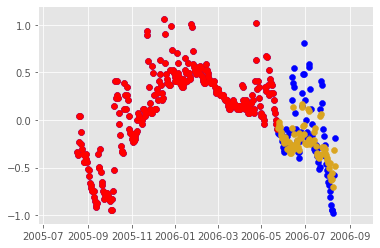

Epoch 1 batch 249 train Loss -0.3300 test Loss -0.3814 with training MSE metric 0.0746 and testing MSE metric 0.0661
NSE per seq:  0.7471158047746596
learning rate is 0.0003000000142492354


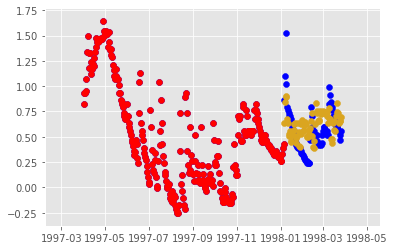

Epoch 1 batch 252 train Loss -0.2648 test Loss -0.3125 with training MSE metric 0.0946 and testing MSE metric 0.0957
NSE per seq:  0.6357911399191137
learning rate is 0.0003000000142492354


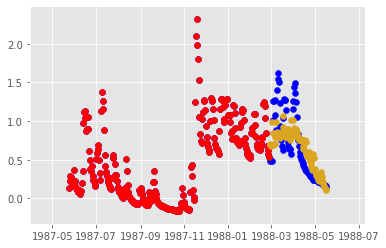

Epoch 1 batch 255 train Loss -0.2609 test Loss -0.2516 with training MSE metric 0.0884 and testing MSE metric 0.1173
NSE per seq:  -0.21856533089249347
learning rate is 0.0003000000142492354


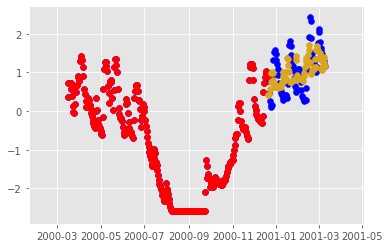

Epoch 1 batch 258 train Loss -0.2766 test Loss -0.2342 with training MSE metric 0.0936 and testing MSE metric 0.1509
NSE per seq:  0.6036747141387677
learning rate is 0.0003000000142492354


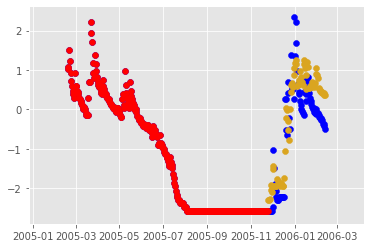

Epoch 1 batch 261 train Loss -0.2003 test Loss -0.3083 with training MSE metric 0.1247 and testing MSE metric 0.0890
NSE per seq:  0.6888448200169198
learning rate is 0.0003000000142492354


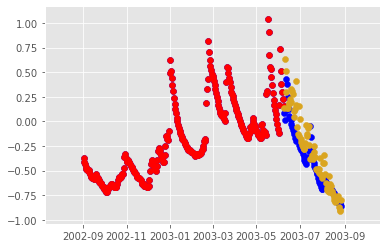

Epoch 1 batch 264 train Loss -0.1972 test Loss -0.2800 with training MSE metric 0.1135 and testing MSE metric 0.1179
NSE per seq:  0.7094111053600762
learning rate is 0.0003000000142492354


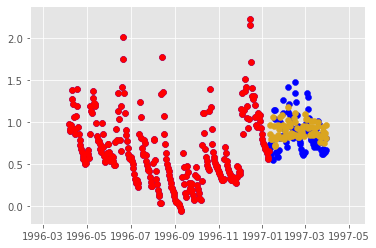

Epoch 1 batch 267 train Loss -0.2447 test Loss -0.2855 with training MSE metric 0.1062 and testing MSE metric 0.1033
NSE per seq:  0.67412301717792
learning rate is 0.0003000000142492354


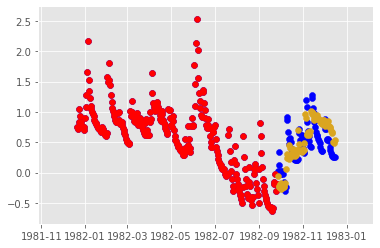

Epoch 1 batch 270 train Loss -0.2543 test Loss -0.2932 with training MSE metric 0.1078 and testing MSE metric 0.0997
NSE per seq:  0.6523233984486221
learning rate is 0.0003000000142492354


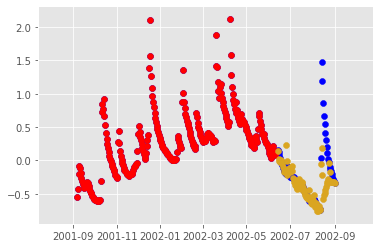

Epoch 1 batch 273 train Loss -0.2192 test Loss -0.3023 with training MSE metric 0.1005 and testing MSE metric 0.0857
NSE per seq:  0.6119508110113245
learning rate is 0.0003000000142492354


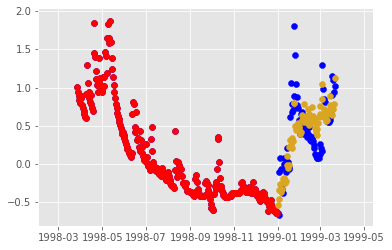

Epoch 1 batch 276 train Loss -0.3039 test Loss -0.3076 with training MSE metric 0.0762 and testing MSE metric 0.0859
NSE per seq:  0.6845760423804963
learning rate is 0.0003000000142492354


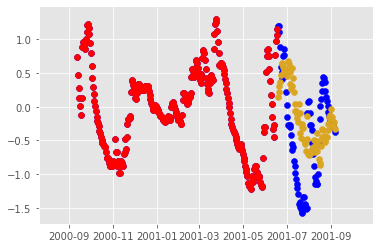

Epoch 1 batch 279 train Loss -0.1866 test Loss -0.2747 with training MSE metric 0.1422 and testing MSE metric 0.1122
NSE per seq:  0.6255371268317023
learning rate is 0.0003000000142492354


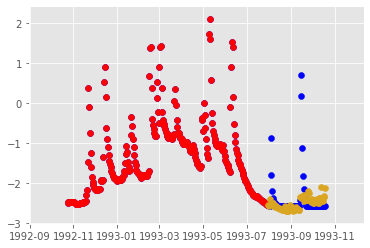

Epoch 1 batch 282 train Loss -0.2513 test Loss -0.3138 with training MSE metric 0.1054 and testing MSE metric 0.0929
NSE per seq:  0.6556080880082942
learning rate is 0.0003000000142492354


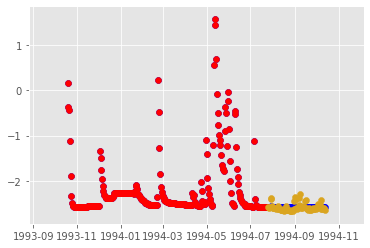

Epoch 1 batch 285 train Loss -0.2399 test Loss -0.1463 with training MSE metric 0.0990 and testing MSE metric 0.1394
NSE per seq:  0.5382982640564941
learning rate is 0.0003000000142492354


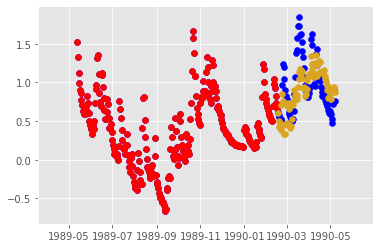

Epoch 1 batch 288 train Loss -0.2512 test Loss -0.2767 with training MSE metric 0.0992 and testing MSE metric 0.1230
NSE per seq:  0.7027190321548552
learning rate is 0.0003000000142492354


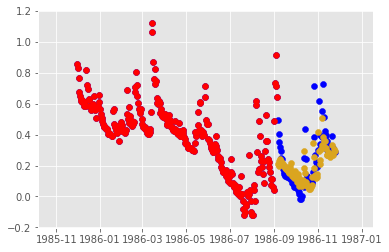

Epoch 1 batch 291 train Loss -0.2928 test Loss -0.2619 with training MSE metric 0.1113 and testing MSE metric 0.1195
NSE per seq:  0.6742287005823726
learning rate is 0.0003000000142492354


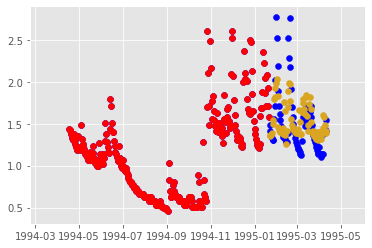

Epoch 1 batch 294 train Loss -0.3134 test Loss -0.3485 with training MSE metric 0.0851 and testing MSE metric 0.0995
NSE per seq:  0.695821219251978
learning rate is 0.0003000000142492354


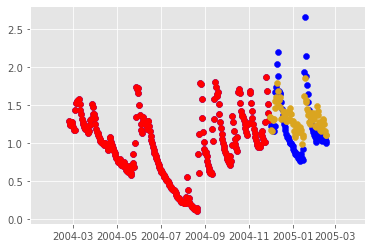

Epoch 1 batch 297 train Loss -0.2347 test Loss -0.2762 with training MSE metric 0.1187 and testing MSE metric 0.0852
NSE per seq:  -0.004286482861625418
learning rate is 0.0003000000142492354


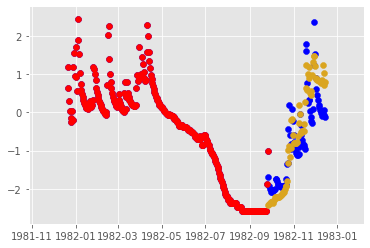

Epoch 1 batch 300 train Loss -0.2468 test Loss -0.2735 with training MSE metric 0.0928 and testing MSE metric 0.0913
NSE per seq:  0.5858244857122098
learning rate is 0.0003000000142492354


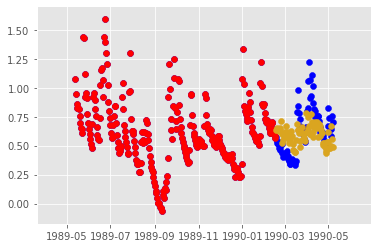

Epoch 1 batch 303 train Loss -0.2142 test Loss -0.2547 with training MSE metric 0.1153 and testing MSE metric 0.1147
NSE per seq:  0.6461116819619459
learning rate is 0.0003000000142492354


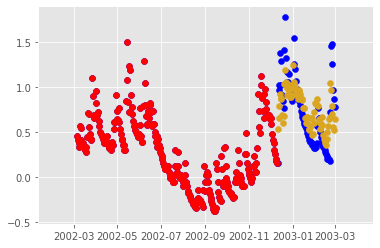

Epoch 1 batch 306 train Loss -0.2358 test Loss -0.3598 with training MSE metric 0.1060 and testing MSE metric 0.0784
NSE per seq:  -0.4799482701524349
learning rate is 0.0003000000142492354


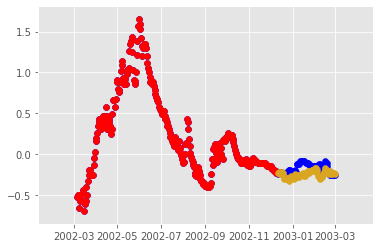

Epoch 1 batch 309 train Loss -0.2600 test Loss -0.3496 with training MSE metric 0.1096 and testing MSE metric 0.0793
NSE per seq:  0.6376193137201934
learning rate is 0.0003000000142492354


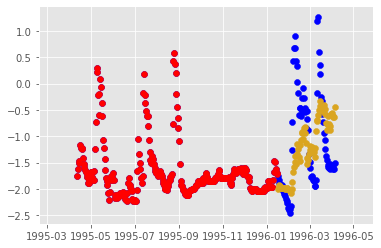

Epoch 1 batch 312 train Loss -0.2166 test Loss -0.2368 with training MSE metric 0.1161 and testing MSE metric 0.1053
NSE per seq:  0.573262754172404
learning rate is 0.0003000000142492354


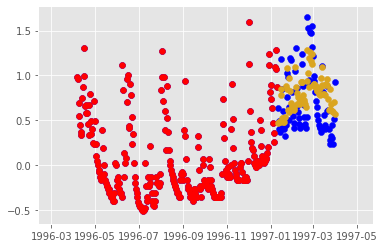

Epoch 1 batch 315 train Loss -0.2294 test Loss -0.2520 with training MSE metric 0.1111 and testing MSE metric 0.1572
NSE per seq:  0.679423625822147
learning rate is 0.0003000000142492354


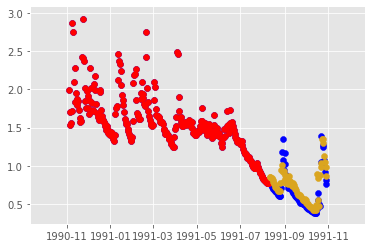

Epoch 1 batch 318 train Loss -0.2766 test Loss -0.2824 with training MSE metric 0.0939 and testing MSE metric 0.0874
NSE per seq:  0.7386631871031806
learning rate is 0.0003000000142492354


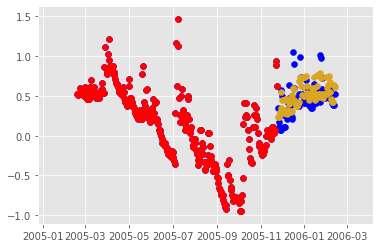

Epoch 1 batch 321 train Loss -0.2687 test Loss -0.3040 with training MSE metric 0.1069 and testing MSE metric 0.1242
NSE per seq:  0.609731619411163
learning rate is 0.0003000000142492354


KeyboardInterrupt: 

In [83]:
if __name__ == '__main__':
    step = 0
    # change to run 9 if you want to overfit
    EPOCHS = 75; batch_s  = 64; run = 3; tr_regime ='shuffle'
    l= [128, 64, 32]; heads = 16; e = 128; context = 280; c= 280
    name_comp = 'run_' + str(run)
    logdir = save_dir + '/logs/' + name_comp
    writer = tf.summary.create_file_writer(logdir)
    folder = save_dir + '/ckpt/check_' + name_comp
    optimizer_c = tf.keras.optimizers.Adam(3e-4)
    helpers.mkdir(folder)
    decoder = experimental_model.Decoder(e, l[0], l[1], l[2], num_heads=heads)
    num_batches = 1000
    ckpt = tf.train.Checkpoint(step=tf.Variable(1), optimizer=optimizer_c, net=decoder)
    manager = tf.train.CheckpointManager(ckpt, folder, max_to_keep=3)
    ckpt.restore(manager.latest_checkpoint)
    if manager.latest_checkpoint:
        print("Restored from {}".format(manager.latest_checkpoint))
    else:
        print("Initializing from scratch.")
    with writer.as_default():
        for epoch in range(EPOCHS):
            start = time.time()
            for batch_n in range(num_batches):
                m_tr.reset_states(); train_loss.reset_states()
                batch_idx = np.random.choice(train_b_idx, 64)
                idxs = np.random.choice(np.arange(56), 64, replace = True)
                y_tr = np.array([df_filt_sliced[basin_list.iloc[batch_idx[i]][0]]['y'][idxs[i]] for i in range(64)])
                x_tr = np.array([np.concatenate((df_filt_sliced[basin_list.iloc[batch_idx[i]][0]]['x'][idxs[i]][:, None, :], df_filt_sliced[basin_list.iloc[batch_idx[i]][0]]['t'][idxs[i]]), axis = 2) for i in range(64)])
#                 x_tr = np.array([df_filt_sliced[basin_list.iloc[batch_idx[i]][0]]['x'][idxs[i]] for i in range(64)])
                to_gather = helpers.gather_idx(c, l=360, b=64)
                temp = np.zeros((64, 360))
                temp[to_gather[:, 0], to_gather[:, 1]] = 1
                pred, pred_log, weights, names, shapes, y_real, g = train_step(decoder, optimizer_c, train_loss, m_tr, x_tr.squeeze(), y_tr, d = False, to_gather=temp)
                if (epoch == 0) & (batch_n == 0): helpers.write_speci(folder, names, shapes, context, heads)
                if batch_n % 3 == 0:
                    m_te.reset_states(); test_loss.reset_states()


                    b_idxs_te = np.random.choice(test_b_idx, 32)
                    idxs_te = np.random.choice(np.arange(56), 32, replace = True)

                    y_te = np.array([df_filt_sliced[basin_list.iloc[b_idxs_te[i]][0]]['y'][idxs_te[i]] for i in range(32)])
                    x_te = np.array([np.concatenate((df_filt_sliced[basin_list.iloc[b_idxs_te[i]][0]]['x'][idxs_te[i]][:, None, :], df_filt_sliced[basin_list.iloc[b_idxs_te[i]][0]]['t'][idxs_te[i]]), axis = 2) for i in range(32)])
#                     x_te = np.array([df_filt_sliced[basin_list.iloc[b_idxs_te[i]][0]]['x'][idxs_te[i]] for i in range(32)])


                    to_gather_te = helpers.gather_idx(c, l=360, b= 32)
                    temp_te = np.zeros((32, 360))
                    temp_te[to_gather_te[:, 0], to_gather_te[:, 1]] = 1
                    pred_te, pred_log_te = test_step(decoder, test_loss, m_te, x_te =x_te.squeeze(), y_te = y_te, to_gather=temp_te, d=False)

                    fig,ax = plt.subplots()
                    ax.scatter(df_filt_sliced[basin_list.iloc[b_idxs_te[1]][0]]['date'][idxs_te[1]], y_te[1], c='blue')
                    ax.scatter(df_filt_sliced[basin_list.iloc[b_idxs_te[1]][0]]['date'][idxs_te[1]][:280], y_te[1][:280], c='red')
                    ax.scatter(df_filt_sliced[basin_list.iloc[b_idxs_te[1]][0]]['date'][idxs_te[1]][280:], pred_te[1, 279:], c='goldenrod') 
                    plt.show()
                        
                        
                    helpers.print_progress(epoch, batch_n, train_loss.result(), test_loss.result(), m_tr.result(), m_te.result())
                    helpers.tf_summaries(run, step, train_loss.result(), test_loss.result(), m_tr.result(), m_te.result(), weights, names)
                    r = metrics.r_squared(pred_te[:, 279:], y_te, batch_s = 32, c=280)
                    print('NSE per seq: ', np.mean(r))
                    print('learning rate is {}'.format(optimizer_c._decayed_lr('float32').numpy()))
                    manager.save()
                step += 1
                ckpt.step.assign_add(1)
            print ('Time taken for 1 epoch: {} secs\n'.format(time.time() - start))

In [88]:
c = []
for i in range(32):
    a = np.mean((np.exp(pred_te[i, 279:]) - np.exp(y_te[i, 280:]))**2)
    b = np.mean((np.exp(y_te[i, 280:]) - np.mean(np.exp(y_te[i, :])))**2)
    print(1 - (a/b))
    c.append(1 - (a/b))

0.790903517518559
0.6124418940146198
0.304421517962814
0.6075058485976151
0.9762767352352473
0.4091347090156745
0.2675136951700896
0.3051149576267971
0.303611590338533
0.21772375920136433
0.9958117331959371
0.9723764706134742
0.5209788833685258
0.9996809781772313
-0.06852018329449061
0.6928244546821967
0.15377850251794156
0.31498289000276536
0.8249957848233559
0.5904552309348845
0.649716674595779
0.9910460649545038
0.6876424622655799
0.6733845883573608
0.31818828100619423
0.8641595043624402
0.9762521562002828
0.8504601204358458
0.14548628875808456
0.22725373157414552
0.7153729076158626
0.9445904696630173


In [89]:
np.mean(c)

0.5886114443591323

In [22]:
b = np.mean((y_te[1, 280:] - np.mean(y_te[1, :]))**2)

In [24]:
1 - (a/b)

0.5375031681400716

In [34]:
m_te.result()

<tf.Tensor: shape=(), dtype=float32, numpy=1.533694>

In [91]:
len(test_b_idx)

50

In [104]:
df_filtered['01022500']

,Date,t,Dayl(s),PRCP(mm/day),SRAD(W/m2),Tmax(C),Tmin(C),Vp(Pa),Q
0,1980-01-01,-1.731643,-1.685847,-0.807959,-1.091910,-1.521315,-1.521315,-1.065478,0.701785
1,1980-01-02,-1.731317,-1.669542,-0.807959,-1.059105,-1.451285,-1.451285,-1.054692,0.640415
2,1980-01-03,-1.730990,-1.659879,-0.807959,-1.003921,-1.524154,-1.524154,-1.104178,0.578850
3,1980-01-04,-1.730664,-1.648827,-0.807959,-1.104774,-1.831715,-1.831715,-1.178520,0.518092
4,1980-01-05,-1.730338,-1.648827,-0.807959,-1.279001,-1.991647,-1.991647,-1.199030,0.469766
...,...,...,...,...,...,...,...,...,...
10588,2008-12-27,1.730574,-1.697352,1.011087,-1.274967,-1.473051,-1.473051,-1.043021,1.154240
10589,2008-12-28,1.730900,-1.697352,0.580257,-1.477890,-0.822914,-0.822914,-0.648048,1.322055
10590,2008-12-29,1.731226,-1.697352,-0.426231,-1.086582,-0.663928,-0.663928,-0.614612,1.436933
10591,2008-12-30,1.731553,-1.697352,-0.684678,-1.260429,-1.029216,-1.029216,-0.898361,1.396015


In [106]:
b

8

In [111]:
ix

39

In [112]:
b_idxs_te

array([  9,  73,   8,  13, 252, 168,  39,   8,  62, 252, 465, 136, 355,
       465, 244,  66,  89, 394, 297,   8, 115, 465, 434, 115, 296,  57,
       369, 358, 325, 172, 320, 249])

In [20]:
    step = 0
    # change to run 9 if you want to overfit
    EPOCHS = 75; batch_s  = 64; run = 3; tr_regime ='shuffle'
    l= [128, 64, 32]; heads = 16; e = 128; context = 280; c= 280
    name_comp = 'run_' + str(run)
    logdir = save_dir + '/logs/' + name_comp
    writer = tf.summary.create_file_writer(logdir)
    folder = save_dir + '/ckpt/check_' + name_comp
    optimizer_c = tf.keras.optimizers.Adam(3e-4)
    helpers.mkdir(folder)
    decoder = experimental_model.Decoder(e, l[0], l[1], l[2], num_heads=heads)
    num_batches = 1000
    ckpt = tf.train.Checkpoint(step=tf.Variable(1), optimizer=optimizer_c, net=decoder)
    manager = tf.train.CheckpointManager(ckpt, folder, max_to_keep=3)
    ckpt.restore(manager.latest_checkpoint)
    if manager.latest_checkpoint:
        print("Restored from {}".format(manager.latest_checkpoint))
    else:
        print("Initializing from scratch.")

Already exists
Restored from /Users/omernivron/Downloads/river_flow/ckpt/check_run_3/ckpt-442


In [21]:
df_filt_sliced_te = {}
for ix in test_b_idx:
    b = basin_list.iloc[ix][0]
    df_filt_sliced_te[b] = {}
    temp = df_filtered[b].reset_index()[:10441]
    d_y = np.array(temp['Q'])
    t_y = np.array(embed_position(temp['t'][:, None], d=122, TΔmin= 0.2, Tmax=180))
    x_y = np.array(temp[['PRCP(mm/day)','Dayl(s)', 'SRAD(W/m2)', 'Tmax(C)', 'Tmin(C)', 'Vp(Pa)']])
    time_x = np.array(temp['Date'].dt.date)
    df_filt_sliced_te[b]['x'] = x_y
    df_filt_sliced_te[b]['t'] = t_y
    df_filt_sliced_te[b]['y'] = d_y
    df_filt_sliced_te[b]['date'] = time_x

In [25]:
c = 5844
y_te = np.array([df_filt_sliced_te[basin_list.iloc[test_b_idx[i]][0]]['y'] for i in range(2)])
x_te = np.array([np.concatenate((df_filt_sliced_te[basin_list.iloc[test_b_idx[i]][0]]['x'][:, None, :], df_filt_sliced_te[basin_list.iloc[test_b_idx[i]][0]]['t']), axis = 2) for i in range(2)])
to_gather_te = helpers.gather_idx(c, l=10441, b= 2)
temp_te = np.zeros((2, 10441))
temp_te[to_gather_te[:, 0], to_gather_te[:, 1]] = 1

In [ ]:

pred_te, pred_log_te = test_step(decoder, test_loss, m_te, x_te =x_te.squeeze(), y_te = y_te, to_gather=temp_te, d=False)



In [ ]:
c = []
for i in range(2):
    a = np.mean((np.exp(pred_te[i, 5843:]) - np.exp(y_te[i, 5844:]))**2)
    b = np.mean((np.exp(y_te[i, 5844:]) - np.mean(np.exp(y_te[i, :])))**2)
    print(1 - (a/b))
    c.append(1 - (a/b))

In [ ]:
from helpers import masks

In [144]:
idd = np.random.choice(np.arange(1000))

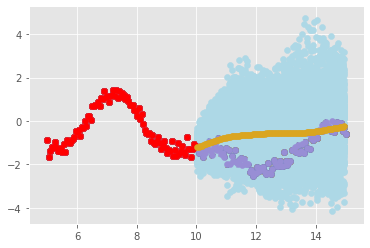

In [153]:
idd = np.random.choice(np.arange(1000))
fig,ax = plt.subplots()
for j in range(100):
    x = batch_x[0, :][None, :, :]
    y_s = y[8000 + idd, :100] 
    y_s = y_s[:-1][None, :]
    for i in range(99):
        x_s = x[:, :(100 + i), :]
        _, _, sample_y = evaluate(decoder, x_s, y_s, d=d, sample=True)
    #     print((t[:(301 + i)][-1], sample_y))
        y_s = tf.concat((y_s, tf.reshape(sample_y, [1, 1])), axis=1)
        

    ax.scatter(t, y[8000+idd], cmap=cmap)
    ax.scatter(t[:100], y[8000+idd][:100], c='red')
    ax.scatter(t[100:-1], (y_s.numpy()[:, 99:]), c='lightblue') 

x = batch_x[0, :][None, :, :]
y_s = y[8000 + idd, :100] 
y_s = y_s[:-1][None, :]
for i in range(99):
    x_s = x[:, :(100 + i), :]
    _, _, sample_y = evaluate(decoder, x_s, y_s, d=d, sample=False)
#     print((t[:(301 + i)][-1], sample_y))
    y_s = tf.concat((y_s, tf.reshape(sample_y, [1, 1])), axis=1)
ax.scatter(t, y[8000+idd], cmap=cmap)
ax.scatter(t[:100], y[8000+idd][:100], c='red')
ax.scatter(t[100:-1], (y_s.numpy()[:, 99:]), c='goldenrod') 

In [156]:
x[:, :99, :].shape

(1, 99, 80)

In [161]:
y_s.numpy()

array([[-0.8383658 , -0.6227807 , -1.1252137 , -0.7462958 , -0.4878531 ,
        -0.661256  , -0.8845227 , -0.58334965, -0.67272997, -0.9614765 ,
        -1.05763   , -1.207521  , -0.9587398 , -0.90073526, -0.9497277 ,
        -0.60751134, -0.97908336, -0.95478165, -1.3323395 , -0.9433719 ,
        -0.5966298 , -0.74621814, -1.3341026 , -0.42232022, -0.800609  ,
        -1.4460624 , -1.0498679 , -0.9903614 , -0.9897834 , -0.38197884,
        -0.4651513 , -0.77497715, -0.45981643, -0.49297252, -0.39442134,
        -0.44021064, -0.5837369 , -0.24118242, -0.38061407,  0.11325204,
         0.38787743, -0.10958096,  0.26768184,  0.09883021,  0.60849315,
         0.32071134,  0.61996984,  0.4277914 ,  0.66737634,  0.65756434,
         0.77830726,  0.58163524,  0.97329557,  0.8547472 ,  0.39792678,
         0.47246534,  0.56132054,  0.7538089 ,  0.86992955,  0.7706112 ,
         0.23906313,  0.30827406,  0.34237644,  0.14827892,  0.7130859 ,
        -0.26457757,  0.07647462, -0.7049664 , -0.3

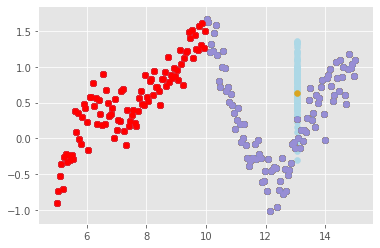

In [166]:
# get epistemic uncertainty 

idd = np.random.choice(np.arange(1000))
fig,ax = plt.subplots()
df = np.zeros((100, 2))
for j in range(100):
    x = batch_x[0, :][None, :, :]
    y_s = y[8000 + idd, :100] 
    y_s = y_s[:-1][None, :]
    x_s = np.concatenate((x[:, :99, :], x[:, 160, :].reshape(1, 1, -1)), axis =1)
    for i in range(2):
        _, _, sample_y = evaluate(decoder, x_s, y_s, d=d, sample=True)
        y_s = tf.concat((y_s, tf.reshape(sample_y, [1, 1])), axis=1)
        df[j, i] = sample_y
        x_s = np.concatenate((x_s, x[:, 160, :].reshape(1, 1, -1)), axis =1)
        
    ax.scatter(t, y[8000+idd], cmap=cmap)
    ax.scatter(t[:100], y[8000+idd][:100], c='red')
    ax.scatter(t[160], (y_s.numpy()[:, -2]), c='lightblue') 

y_s = y[8000 + idd, :100] 
y_s = y_s[:-1][None, :]
x_s = np.concatenate((x[:, :99, :], x[:, 160, :].reshape(1, 1, -1)), axis =1)
for i in range(2):
    _, _, sample_y = evaluate(decoder, x_s, y_s, d=d, sample=False)
    y_s = tf.concat((y_s, tf.reshape(sample_y, [1, 1])), axis=1)
    x_s = np.concatenate((x_s, x[:, 160, :].reshape(1, 1, -1)), axis =1)
ax.scatter(t, y[8000+idd], cmap=cmap)
ax.scatter(t[:100], y[8000+idd][:100], c='red')
ax.scatter(t[160], (y_s.numpy()[:, -2]), c='goldenrod') 

In [177]:
cov_y12 = sum((df[:, 0] - np.mean(df[:, 0])) * (df[:, 1] - np.mean(df[:, 1]))) / 100

In [178]:
var_y1 = sum((df[:, 0] - np.mean(df[:, 0]))**2) / 100

In [179]:
cov_y12 / (var_y1)

0.8414868587767466

In [182]:
t[160:163]

array([13.04020101, 13.09045226, 13.14070352])

In [184]:
t[162:159:-1]

array([13.14070352, 13.09045226, 13.04020101])

In [186]:
x[:, 162:159:-1, :].shape

(1, 3, 80)

In [196]:
x[:, 159:219:20, :].shape

(1, 3, 80)

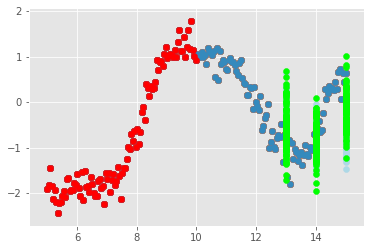

In [198]:
### FDD

idd = np.random.choice(np.arange(1000))
fig,ax = plt.subplots()
df = np.zeros((100, 2))
for j in range(100):
    x = batch_x[0, :][None, :, :]
    y_s = y[8000 + idd, :100] 
    y_s = y_s[:-1][None, :]
    x_1 = np.concatenate((x[:, :99, :], x[:, 159:219:20, :].reshape(1, 3, -1)), axis =1)
    t_1 = np.concatenate((t[:99], t[159:219:20]), axis =0)
    for i in range(3):
        x_s = x_1[:, :(100+i), :]
        _, _, sample_y = evaluate(decoder, x_s, y_s, d=d, sample=True)
        y_s = tf.concat((y_s, tf.reshape(sample_y, [1, 1])), axis=1)
#         df[j, i] = sample_y
        
    ax.scatter(t, y[8000+idd], cmap=cmap)
    ax.scatter(t[:100], y[8000+idd][:100], c='red')
    ax.scatter(t_1[-3:], (y_s.numpy()[:, -3:]), c='lightblue') 
    
    
for j in range(100):
    x = batch_x[0, :][None, :, :]
    y_s = y[8000 + idd, :100] 
    y_s = y_s[:-1][None, :]
    x_1 = np.concatenate((x[:, :99, :], x[:, 199:139:-20, :].reshape(1, 3, -1)), axis =1)
    t_1 = np.concatenate((t[:99], t[159:219:20]), axis =0)
    for i in range(3):
        x_s = x_1[:, :(100+i), :]
        _, _, sample_y = evaluate(decoder, x_s, y_s, d=d, sample=True)
        y_s = tf.concat((y_s, tf.reshape(sample_y, [1, 1])), axis=1)
#         df[j, i] = sample_y

    ax.scatter(t_1[-3:], (y_s.numpy()[:, -3:]), c='lime') 

# y_s = y[8000 + idd, :100] 
# y_s = y_s[:-1][None, :]
# x_s = np.concatenate((x[:, :99, :], x[:, 160, :].reshape(1, 1, -1)), axis =1)
# for i in range(2):
#     _, _, sample_y = evaluate(decoder, x_s, y_s, d=d, sample=False)
#     y_s = tf.concat((y_s, tf.reshape(sample_y, [1, 1])), axis=1)
#     x_s = np.concatenate((x_s, x[:, 160, :].reshape(1, 1, -1)), axis =1)
# ax.scatter(t, y[8000+idd], cmap=cmap)
# ax.scatter(t[:100], y[8000+idd][:100], c='red')
# ax.scatter(t[160], (y_s.numpy()[:, -2]), c='goldenrod') 

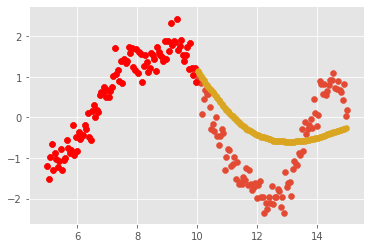

In [141]:

plt.show()

In [51]:
def evaluate(model, x, y, sample=True, d=False):

    combined_mask_x = masks.create_masks(x[:, :, 0])
    pred = model(x, y, False, combined_mask_x[:, :-1, :-1])
    if sample:
        sample_y = np.random.normal(pred[-1, 0], np.exp(pred[-1, 1]))
    else:
        sample_y = pred[-1, 0]

    return pred[:, 0], pred[:, 1], sample_y

In [36]:
batch_x.shape

(12800, 1, 80)

In [18]:
decoder.embedding_y.weights

[<tf.Variable 'decoder_2/embedding_y/embeddings:0' shape=(720, 512) dtype=float64, numpy=
 array([[-0.03918333,  0.002555  , -0.04375133, ..., -0.00895372,
          0.01428103, -0.04062321],
        [ 0.04875097,  0.00332681,  0.02075737, ..., -0.00281248,
         -0.0422142 , -0.0279823 ],
        [-0.01159028, -0.01968206, -0.00533449, ..., -0.04627387,
          0.0472882 ,  0.01146601],
        ...,
        [ 0.0485401 ,  0.0070847 ,  0.01357337, ..., -0.04143491,
         -0.02743685,  0.02866772],
        [-0.01393959, -0.03927393, -0.03441395, ..., -0.03966967,
         -0.00072969,  0.00185381],
        [ 0.01771626, -0.00915341,  0.04119668, ..., -0.04464048,
          0.04295359,  0.04671597]])>]

In [43]:
decoder.mha2.wk

In [44]:
decoder.mha.wk

### Embeddings in tensorboard

In [ ]:
helpers.tensorboard_embeddings(decoder, layer_num = 0, meta_data = np.concatenate(([0, 1], np.unique(b_data[2]))))

### Inference

att:  (1, 32, 250, 250)
unique:  tf.Tensor(
[ 41 245  40 242 243  66  65  73  67  68  71  72  83  84 174 248  45  46
  50  52  47 249  48  49  51  53  42 246 247  59  60 233  27 223   8  19
 211 212   9  38 239 240 241  35  54  55  57  58  63  56  61  62  28  29
 228 235 244  36  37  80  81  79  75  76 204  20  21  15  16  43  44 162
 163 164 159 165   6   7 201 202  17  39  33  34 234  64], shape=(86,), dtype=int32)
count:  tf.Tensor(
[2 2 4 2 2 4 2 1 2 1 2 1 1 1 1 4 4 4 7 6 2 2 7 5 6 6 5 3 3 2 2 1 2 1 1 1 1
 1 1 2 2 1 1 2 2 2 2 2 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1], shape=(86,), dtype=int32)
att:  (1, 32, 251, 251)
unique:  tf.Tensor(
[ 41 245  40 242 243  66  65  73  67  68  71  72  83  84 174  45  46 248
  50  52 249  47 250  48  51  49  53  42 246 247  59  60 233  27 223   8
  19 211 212   9  38 239 240 241  35  54  55  57  58  63  56  61  62  28
  29 228 235 244  36  37  80  81  79  75  76 204  20  21  15  16  43  44
 162 163 164 159 165 

att:  (1, 32, 264, 264)
unique:  tf.Tensor(
[173 172 168 170 171  66  68  69  70  65  23 219 220 221  13  45  46 248
  50 254  47 249  48  52 256  51 263  59  60  58  53  64  67 255 257  43
 169 174 165 166 167  74 152 153 154 155 156  54  55 258  57 260 261 262
 236 237 238  39 235  63  61  62  73  75  35  36  37  33  79  80  81  41
 245  40  42 246 162 163 164 159   0   1 200   6   7 250 251  44], shape=(88,), dtype=int32)
count:  tf.Tensor(
[1 1 1 1 1 3 2 2 2 4 1 1 1 1 1 3 3 3 5 5 1 1 1 3 3 4 3 4 4 5 2 3 2 3 4 2 1
 1 2 1 1 2 1 1 1 1 1 2 2 2 4 3 3 2 1 1 1 2 1 3 3 2 1 2 1 1 1 1 1 1 1 1 1 1
 2 1 1 1 1 1 1 1 1 1 1 1 1 1], shape=(88,), dtype=int32)
att:  (1, 32, 265, 265)
unique:  tf.Tensor(
[173 172 168 170 171  66  68  69  70  74  10  11  12 205  23  45  46 248
 263 264  50 254  47 249  48  52 256  51  59  60  58  64  67  65 255  53
 257  43 169 174 165 166 152 153 154 155 156  54  55 258  57 260 261 262
 236 237 238 235  35  63  61  73  39  36  37  79  80  81  75 150  41 245
  40  42 

att:  (1, 32, 276, 276)
unique:  tf.Tensor(
[173 172 168 170 171 270 271 273 274 275  10  11  12 205  15  82  97  98
  99  88  45  46 248  50 254  52 256  51  89  96  93  64 269 265  59  60
  53 255 257  43 169 165 166 167 174  67  68  69  70  74  66  54  55 258
  48  61  62 267  83  84  77  73  78  63  58 111 112 113 105 106  75  76
  65 272  90  91  92  94 100 107 108  85 162 163 164 159 263 264  13  14
  80  81  79  41 245 242 243 244], shape=(98,), dtype=int32)
count:  tf.Tensor(
[1 1 1 1 1 3 3 3 3 2 2 2 2 1 1 3 4 4 4 4 1 1 1 2 2 1 1 2 3 3 3 2 2 2 2 2 1
 1 2 1 1 3 1 1 1 2 1 1 1 3 2 1 1 1 1 3 3 1 2 2 2 2 1 3 2 1 1 1 2 2 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 2 2 1 1 1 1 1 1 1 1 1 1], shape=(98,), dtype=int32)
att:  (1, 32, 277, 277)
unique:  tf.Tensor(
[173 172 168 170 171 276 270 271 273 274  10  11  12 205  15  82  97  98
  99  88  45  46 248  50 254  52 256  51  89  96  93  64 269 265  59  60
  53 255 257  43 169 165 166 167 174  67  68  69  70  74  66  54  55 258
  48  61  62 267  83 

att:  (1, 32, 288, 288)
unique:  tf.Tensor(
[173 172 168 170 171 276 277 278 270 271  10  11  12 205  20  97  98  99
  88  82  89 100  93  94  95  52 256  50 254  51  53  79  75  76  80  81
 255 257  56 169 174 165 166  67 280 281 282  74  66  48  49 252 253  45
  61  62 267  83  84  77  78  73 286 287  96  64 273 111 112 113 110 105
 279 274  65 272  90  91  92 106 107 108  85 162 163 164 159  63 263 264
 265  58  57 260 250 251  40  43  44  87  41 245 242 243], shape=(104,), dtype=int32)
count:  tf.Tensor(
[2 1 1 1 1 2 2 2 3 3 1 1 1 1 1 4 4 3 4 2 4 2 3 2 1 2 2 1 1 2 2 2 2 2 3 3 1
 1 1 1 1 2 1 2 1 1 2 2 2 1 1 1 1 1 2 2 1 2 2 2 1 2 2 2 2 1 2 1 1 1 1 2 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1], shape=(104,), dtype=int32)
att:  (1, 32, 289, 289)
unique:  tf.Tensor(
[173 172 168 170 171 276 277 278 270 271  10  11  12 205  15  97  98  99
  88  83  89 101 102 103 104  52 256  50 254  51  53 257  79  75  76  80
  81 255  56 169 165 166 167 174  67 280 281 288 282  66

att:  (1, 32, 300, 300)
unique:  tf.Tensor(
[173 172 168 170 171 276 277 278 270 271  10  11  12 205  22  97  98  99
  87  82  89 100 101 102 103  52 256  50 254  58  88  53 257  79 297  80
  81 298  56 259  51 169 174 165 166 167  67 280 281 288  68  75  76 289
 290 291 104 269  74  83  84  77  78  73 286  96  93  66 287 273 111 112
 113 110 105 279  65 272  90  91  92  94 106 107 108 159 162 163 164 263
  63  85  86 265  59  60 266 146  54 299  41 245 242 243 244], shape=(105,), dtype=int32)
count:  tf.Tensor(
[1 1 1 1 1 2 1 1 2 2 1 1 1 1 1 5 5 5 3 2 5 3 2 2 2 2 2 2 1 1 3 2 2 1 1 2 2
 2 1 1 1 1 1 1 1 1 2 2 2 3 1 1 1 1 1 1 1 1 4 1 1 1 1 2 2 2 3 1 1 1 1 1 1 1
 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 2 2 2 1 1 1 1 1 1 1 1], shape=(105,), dtype=int32)
att:  (1, 32, 301, 301)
unique:  tf.Tensor(
[173 172 168 170 171 276 277 278 270 271  10  11  12 205  22  97  98  99
  87  82  89 100 101 102 103  52 256  50 254  58  88  53 257  79 297  80
  81 298  56 259  51 169 174 165 166 167  67 280 2

att:  (1, 32, 313, 313)
unique:  tf.Tensor(
[ 41 245  40 242 243 177 110 111 112 113  10  11  12 205  20  87 310 305
  97  98 312  89  93  94  95 197 191 193 194 195  88 311  53  33  34 234
 304  83  84 306 198 192 188 189  45  46 248  48  49  67 280 281 282 288
 114 115 116 119 120 100 109 101 102  90  91  92  82 302 303 307 308  85
  86  96  99  66  73 286 287 273 199 186 279 276 277 278  74  75 105 106
 107 108 159 162 163 164 165 265  63  59  60 266  54 274 270 271], shape=(106,), dtype=int32)
count:  tf.Tensor(
[2 1 1 1 1 1 2 1 1 1 1 1 1 1 1 2 2 3 4 4 1 4 6 3 2 3 2 1 1 1 4 4 1 1 1 1 2
 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 2 2 2 2 2 2 2 1 1 1 2 1 1 1 2
 2 1 1 1 1 2 1 1 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 2 1 2 2 2 1 1 1 1], shape=(106,), dtype=int32)
att:  (1, 32, 314, 314)
unique:  tf.Tensor(
[ 41 245  40 242 243 177 110 111 112 113  10  11  12 205  20  87 310 305
  97  98 312 313  89  93  94 197 191 193 194 195  88 311  53  33  34 234
 304  83  84 306 198 192 188 189  45  46 248

att:  (1, 32, 325, 325)
unique:  tf.Tensor(
[ 41 245  40 242 243 123 124 120 125 126  10  11  12 205  19  87 310  97
  98  99  89 312 313 314 315 197 191 193 194 195 117 118 114  22 216  17
  18 210 110 321 322 109 198 192 188 189 223 224 233  27 225 115 116 119
 199 187 105 106 107 108 319  82 302 303 307 308 111 112 113 323 324  96
  93 121 122 159 160 161 294 295 296 304  75  90  91  92 101 102 279  71
  72 284 285 320  39  64  59  60 266 265  88 311 173 179], shape=(104,), dtype=int32)
count:  tf.Tensor(
[1 1 1 1 1 2 2 3 1 1 1 1 1 1 1 2 2 4 4 4 2 2 2 2 2 3 3 2 1 1 5 2 4 1 1 1 1
 1 2 2 2 2 3 2 1 1 1 1 1 1 1 3 3 2 2 1 3 3 1 1 1 1 1 1 2 1 1 1 1 1 1 3 2 2
 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1], shape=(104,), dtype=int32)
att:  (1, 32, 326, 326)
unique:  tf.Tensor(
[ 41 245  40 242 243 123 124 120 125 126  19 211 212  10  11  87 310  97
  98  99  89 312 313 314 315 197 191 193 194 195 110 321 322 117  22 216
  17  18 210 118 198 192 188 189 223 224 233 225 226 114

att:  (1, 32, 337, 337)
unique:  tf.Tensor(
[173 168 172 170 171 127 131 334 332 132  73 286 287  74 294 151 152 153
 160 161 143 144 140 141 142  45  46 248  50 254 135 138 139 145 333 125
 335 136  42 246 247  40  41  24 217 218 223 224 123 119 114 115 116 154
 155 156  63  58  57 260 261 133 146 134 137 121 122 124 118 331 250 251
 159 162 163 164 157 158 336 148 149 147 150  71  72 284 285 100 317 198
 109 105  87 310 304 305  82 128 129 130 169 165 166 167], shape=(104,), dtype=int32)
count:  tf.Tensor(
[2 1 1 1 1 2 3 3 4 4 1 1 1 1 2 1 2 2 2 1 1 1 4 3 2 1 1 1 1 1 7 4 4 4 1 1 2
 4 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 1 1 1 1 1 2 3 2 3 2 2 1 1 1 1 1 1 1
 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1], shape=(104,), dtype=int32)
att:  (1, 32, 338, 338)
unique:  tf.Tensor(
[173 172 168 170 171 127 131 334 132 336  73 286 287 282  74 151 152 153
 160 161 143 144 140 141 142  45  46 248  50 254 135 332 145 333 124 138
 337 136 335  40  42 246 247  41 217 218  24  20  21 123

att:  (1, 32, 349, 349)
unique:  tf.Tensor(
[173 172 168 170 171 131 334 127 132 336  22 216  23 219 220 160 161 151
 152 153 143 144 140 141 142  45  46 248  52 256 174 175 159 154 155 156
 157  51 255  42 246 247 169 165 166 167  57 260 261 262  54 150 147 146
 136 340 341 137 342 135 138 139 343 344 145 346 347 348 134 339 335 332
 333 162 163 164 133 338 337 148 149  61  62 267 268 263 193 194 195 196
 198 125], shape=(92,), dtype=int32)
count:  tf.Tensor(
[5 4 4 3 2 2 2 1 2 1 1 1 1 1 1 6 4 3 2 2 1 1 2 2 2 1 1 1 1 1 2 2 3 6 4 3 2
 1 1 1 1 1 1 3 3 2 1 1 1 1 1 2 4 3 1 1 1 2 1 2 1 1 1 1 2 2 2 2 2 2 1 1 1 2
 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1], shape=(92,), dtype=int32)
att:  (1, 32, 350, 350)
unique:  tf.Tensor(
[173 172 168 170 171 131 334 127 132 336  23 219 220 221  20 160 161 152
 153 151 143 144 140 141 142  45  46 248  52 256 135 145 346 347 348 159
 154 155  42 246 247  40  51 169 174 165 166 175 167  57 260 261 262  54
 150 147 146 136 340 341 137 138 139 343 134 339 333 335 

att:  (1, 32, 361, 361)
unique:  tf.Tensor(
[173 172 168 170 171 174 177 169 162 163  22 216 217 218  20 160 161 152
 153 357 143 144 140 141 142  45  46 248  52 256 355 356 360 198 175 332
 159 154 155  42 246 247  51 255 165 166 167  57 260 261 262 257 150 350
 351 352 137 342 136 340 341 145 346 347 348 135 134 339 335 333 125 345
 147 156 157 146 133 338 337 148 149 349 164 199 197 193 194 126 132 336], shape=(90,), dtype=int32)
count:  tf.Tensor(
[6 5 4 2 2 2 1 4 2 2 1 1 1 1 1 5 4 1 1 1 1 1 3 3 3 2 2 2 2 2 3 2 2 2 3 1 4
 3 2 1 1 1 1 1 3 3 2 1 1 1 1 1 2 2 2 2 1 1 1 1 1 3 2 2 2 1 1 1 1 2 2 1 3 1
 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1], shape=(90,), dtype=int32)
att:  (1, 32, 362, 362)
unique:  tf.Tensor(
[173 172 168 170 171 174 169 177  20  21  22 216  23 152 153 357 358 160
 143 144 140 141 142  45  46 248  52 256 161 151 353 354 145 346 347 348
 138 159 361 154  42 246 247  40  41 165 175 166 167 360  54  55 258  57
 260 150 350 351 352 355 137 342 136 340 341 179 135 134 339 335 132 3

att:  (1, 32, 374, 374)
unique:  tf.Tensor(
[173 369 370 371 172 177 174 169 175  22 216  20  21  19 182 179 183 191
 188 193 194 195 196 192 197 199 145 346 347 348 127 366 160 161 362 190
 198 168 367 170 171 368 165 166 167 363 189 150 350 351 352 355 146 159
 361 181 184 152 153 357 154 155 156 157 158 187 185  66 279  71  72 284
 162 163 164 365 178 180 176 124 125 126 333 128], shape=(84,), dtype=int32)
count:  tf.Tensor(
[5 5 5 4 3 2 2 3 1 1 1 1 1 1 3 4 2 5 6 4 3 1 1 3 4 5 2 2 1 1 1 1 3 3 3 2 4
 1 1 1 1 1 1 1 1 1 5 1 1 1 1 1 1 5 4 2 2 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1], shape=(84,), dtype=int32)
att:  (1, 32, 375, 375)
unique:  tf.Tensor(
[173 369 370 371 172 177 374 174 175  20  21  22 216  10 179 182 183 181
 193 194 195 196 192 197 191 145 346 347 348 138 366 160 161 362 190 199
 198 169 168 367 170 171 368 165 166 167 363 188 189 150 350 351 352 154
 146 184 159 361 155 187 185  71  72 284 285 279 162 163 164 365 178 180
 124 125 126 333 131], shape=(77,

att:  (1, 32, 387, 387)
unique:  tf.Tensor(
[173 369 370 371 172 177 374 376 377  19 211 212  22 216 182 183 381 188
 189 193 194 195 196 192 197 191 179 379 333 125 126 127 332 199 198 190
 169 366 170 171 368 168 367 184 185 382 386 152 153 357 358 159 154 155
 156 157 158 384 385 187  71  72 284 285  75 160 161 362 361 150 350 351
 352 378 383 178 375 180 124], shape=(79,), dtype=int32)
count:  tf.Tensor(
[4 3 3 2 2 1 1 1 1 1 1 1 1 1 3 2 2 8 5 4 4 3 1 5 9 6 2 1 2 2 2 1 1 7 6 3 1
 2 1 1 1 1 1 2 2 2 2 2 2 2 2 2 1 1 1 1 1 2 2 2 1 1 1 1 1 2 1 1 1 1 1 1 1 1
 2 1 1 1 1], shape=(79,), dtype=int32)
att:  (1, 32, 388, 388)
unique:  tf.Tensor(
[173 369 370 371 172 376 377 177 374 183  19 211 212  22 216 188 189 197
 191 182 193 194 195 196 192 179 379 333 125 126 127 199 387 198 169 366
 170 171 368 168 367 184 185 382 190 386 159 361 152 153 381 162 163 164
 365 154 155 156 157 158 384 187 385  71  72 284 285  75 160 161 362 378
 383 178 375 180 124  15  16], shape=(79,), dtype=int32)
count:

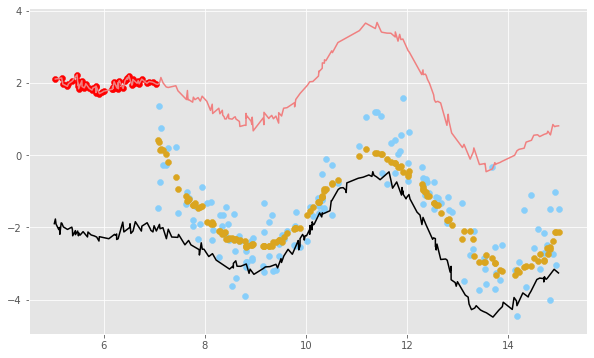

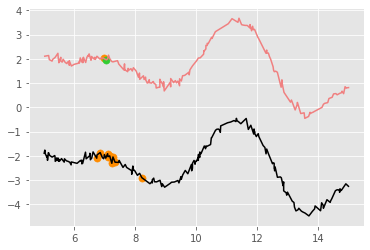

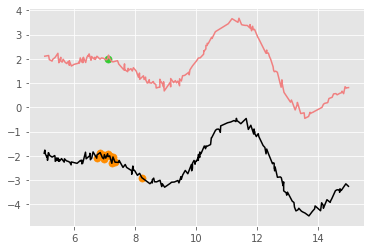

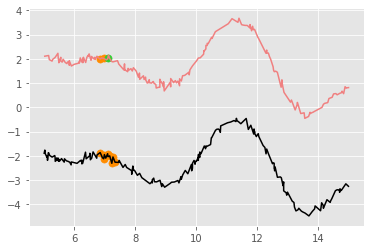

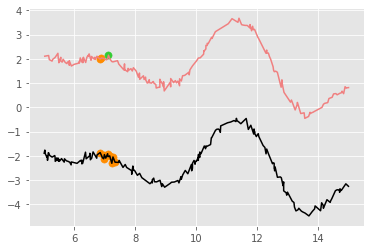

...

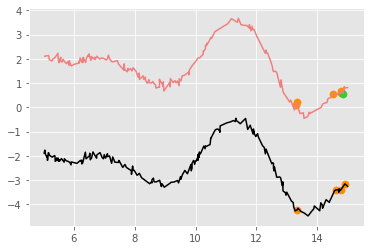

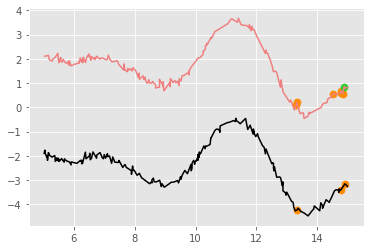

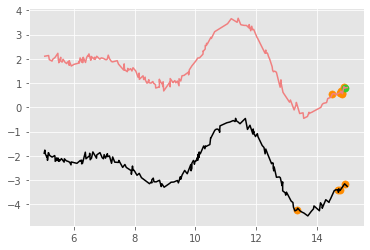

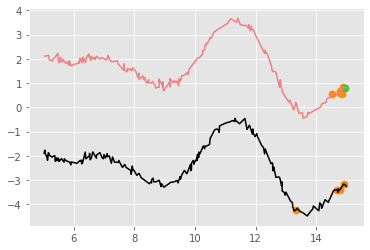

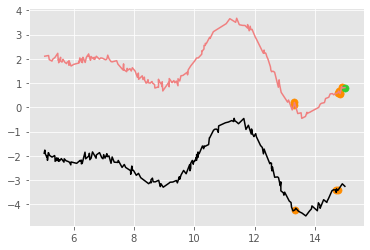

In [26]:
run = 7; l= [256, 64, 32]; e = 512; context = 50
decoder, optimizer_c, ckpt, manager, num_batches, writer, folder = helpers.pre_trained_loader(data[1], save_dir, e, l, d=True, batch_s=64, context=context, heads=1, run=run)
idx = int(np.random.choice(np.arange(0, 30000, 1), 1));
_ = plotter.infer_plot2D(decoder, data[-4][idx, :], data[-2][idx, :], data[0][idx, :], data[1][idx, :], samples = 1, num_steps = 999, consec = True, order = True, context_p = 50)

In [12]:
import pandas as pd

In [13]:
run = 6
name_comp = 'run_' + str(run)
folder = save_dir + '/ckpt/check_' + name_comp

In [15]:
df = pd.read_csv(folder + '_context_' + str(35) + '_speci.csv', header=None)

In [6]:
run =5; l= [256, 64, 32]; e = 512; context = 35
decoder, optimizer_c, ckpt, manager, num_batches, writer, folder = helpers.pre_trained_loader(data[3], save_dir, e, l, d=d, batch_s=64, context=context, heads=1, run=run)

Already exists
Restored from /Users/omernivron/Downloads/GPT_rbf/ckpt/check_run_5/ckpt-33


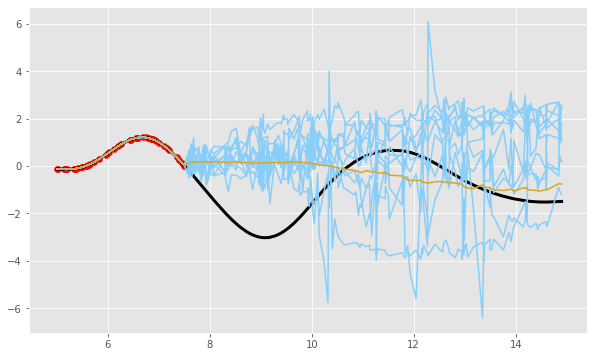

In [19]:
idx = int(np.random.choice(np.arange(0, 1000, 1), 1));
plotter.infer_plot(decoder, em = data[0][idx, :], em_y = data[2][idx, :], x = data[4][idx, :], y= data[6][idx, :], samples = 10, num_steps = 999, consec = True, order = True, context_p = 50)

In [ ]:
## Reading epistemic uncertainty
# 1. given context points predict y*(x*)
# 2. predict y**(x*) given y*(x*)
# 3. Repeat (1-->2) N times
# 4. Calculate var(y*) by 1/N *((y_i* - mean(y*))**2)
# 5. Calculate cov(y*, y**) by 1/N * ((y_i* - mean(y*)(y_i** - mean(y**))) 
# 6. Epistemic uncertainty of y* is given by 5
# 7. Aleatoric uncertainty of y* is given by (4 - 5)